<a id="2"></a>
<h1 style="background-color:#2eddc6;font-family:newtimeroman;font-size:300%;text-align:center;border-radius: 15px 50px;">CHD Notebook </h1>

# <a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Data Overview</h3>

The **Framingham Heart Study** is considering a turning point in identifying the **risk factors of heart disease**, and is one of the most important epidemiological studies conducted.

A lot of our present understanding of cardiovascular disease can be attributed to this study.

To better understand heart disease and the measures that could be taken to combat it, the Framingham Heart Study (FHS) was established in the late 1940's.

It was a **joint project of Boston University and the National Heart, Lung, and Blood Institute (NHLBI)**.

The **aim** of the study was to to **better understand cardiovascular disease by enrolling people free of the disease, and see who** 

**developed the disease in the next 10 years.**

|         Column       |                             Description                            |
|:-------------------:|:---------------------------------------------------------------:|
|         Gender        |                Male or female (Nominal)                            |
|         Age         |                Age of the patient (Continuous)                      |
|   Current Smoker    |     Whether or not the patient is a current smoker (Nominal)      |
|    Cigs Per Day     |     The number of cigarettes that the person smoked on average in one day (Continuous) |
|      BP Meds        |     Whether or not the patient was on blood pressure medication (Nominal) |
|  Prevalent Stroke   |     Whether or not the patient had previously had a stroke (Nominal) |
|   Prevalent Hyp     |     Whether or not the patient was hypertensive , Subject was defined as hypertensive if treated or if second exam at which mean systolic was >=140 mmHg or mean Diastolic >=90 mmHg (Nominal)          |
|      Diabetes       |     Whether or not the patient had diabetes, Diabetic according to criteria of first exam treated or first exam with casual glucose of 200 mg/dL or more (Nominal)               |
|      Tot Chol       |     Serum Total cholesterol level (mg/dL) (Continuous)                            |
|       Sys BP        |     Systolic blood pressure (Continuous)                            |
|       Dia BP        |     Diastolic blood pressure (Continuous)                           |
|         BMI         |     Body Mass Index, weight in kilograms/height meters squared  (Continuous)                                    |
|     Heart Rate      |     Heart rate (Continuous - In medical research, variables such as heart rate though in fact discrete, yet are considered continuous because of the large number of possible values) |
|       Glucose       |     Casual serum glucose (mg/dL) (Continuous)                                      |
|10-year risk of coronary heart disease CHD| Binary variable indicating whether the patient has a 10-year risk of coronary heart disease (CHD) (Binary: "1" means "Yes", "0" means "No") |

# <a id="2"></a>
<h1 style="background-color:#c5f6ef;font-family:newtimeroman;font-size:250%;text-align:center;border-radius: 15px 50px;">Medical Background </h1>

# <a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Cardiovascular systemt</h3>

The cardiovascular system, also known as the circulatory system, is a vital network of organs, vessels, and tissues responsible for transporting blood, oxygen, nutrients, and waste products throughout the body. It plays a crucial role in maintaining homeostasis and supporting various bodily functions. The key components of the cardiovascular system include the heart, blood vessels, and blood.

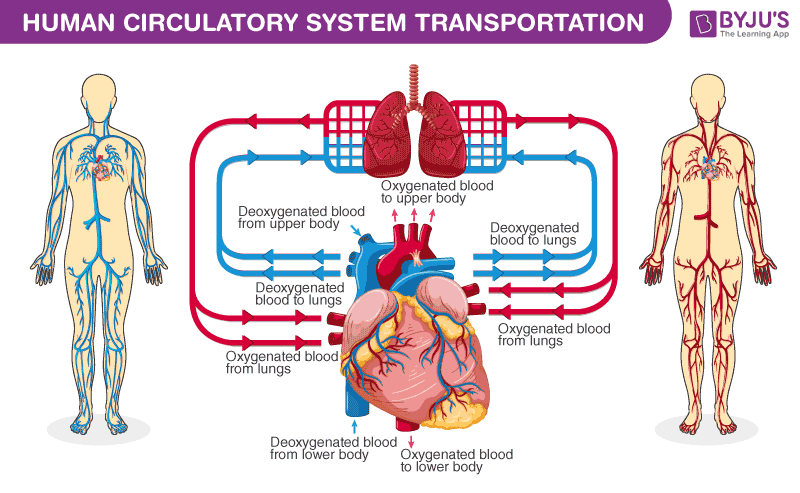

In [694]:
from IPython.display import Image
Image(filename='Human-Circulatory-System-Transportation.png',width=900,height=400)

<a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Coronary Artery Disease(CAD)</h3>

Coronary artery disease (CAD), also known as ischemic heart disease (IHD), is a condition characterized by impaired blood flow to the heart muscle. This is most often caused by atherosclerosis, a process in which plaques, made up of fat, cholesterol, calcium, and other substances found in the blood, build up on the inner walls of the coronary arteries. These arteries are the major blood vessels that supply the heart with oxygen, nutrients, and blood.

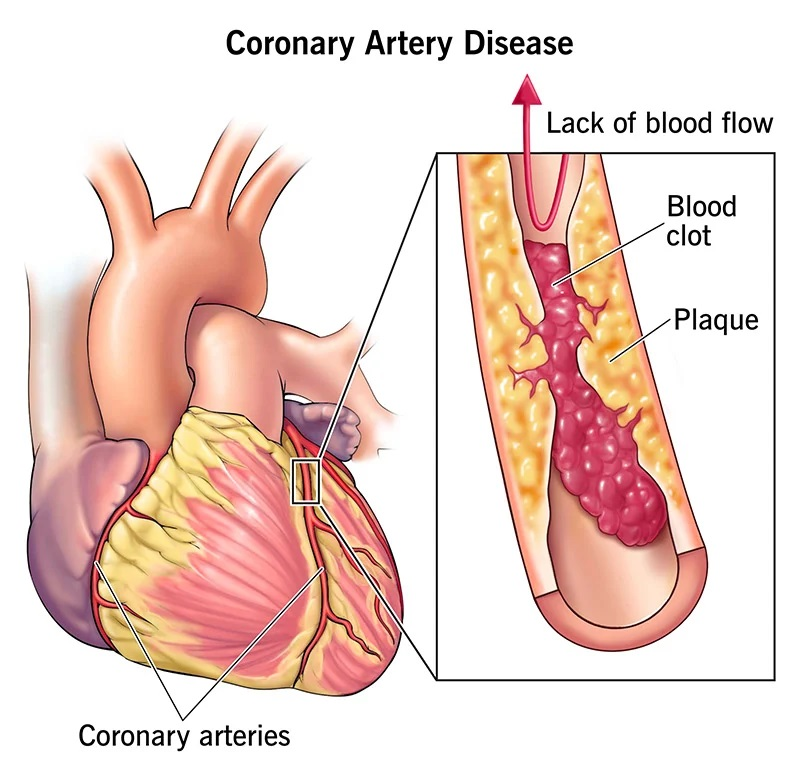

In [698]:
Image(filename='CAD.jpg',width=900,height=400)

# <a id="2"></a>
<h1 style="background-color:#c5f6ef;font-family:newtimeroman;font-size:250%;text-align:center;border-radius: 15px 50px;"> Libraries & loading the data</h1>

In [509]:
pip install missingno

Note: you may need to restart the kernel to use updated packages.


In [1]:
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go
import scipy.stats as stats
from scipy.stats import chi2_contingency

In [511]:
df = pd.read_csv('CHD.csv')

# <a id="2"></a>
<h1 style="background-color:#c5f6ef;font-family:newtimeroman;font-size:250%;text-align:center;border-radius: 15px 50px;"> Exploratory Data Analysis</h1>


In [512]:
print(f'No. of records are {df.shape[0]}')
print(f'No. of columns are {df.shape[1]}')

No. of records are 4238
No. of columns are 16


In [513]:
df.head()

,male,age,education,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,TenYearCHD
0,1,39,4.0,0,0.0,0.0,0,0,0,195.0,106.0,70.0,26.97,80.0,77.0,0
1,0,46,2.0,0,0.0,0.0,0,0,0,250.0,121.0,81.0,28.73,95.0,76.0,0
2,1,48,1.0,1,20.0,0.0,0,0,0,245.0,127.5,80.0,25.34,75.0,70.0,0
3,0,61,3.0,1,30.0,0.0,0,1,0,225.0,150.0,95.0,28.58,65.0,103.0,1
4,0,46,3.0,1,23.0,0.0,0,0,0,285.0,130.0,84.0,23.10,85.0,85.0,0


In [514]:
column = list(df.columns)
categorical_features = []
discrete_features = []

for i in column:
    if len(df[i].unique()) > 6:
        discrete_features.append(i)
    else:
        categorical_features.append(i)

print('Categorical Features :',*categorical_features)
print('Continous Features :',*discrete_features)

Categorical Features : male education currentSmoker BPMeds prevalentStroke prevalentHyp diabetes TenYearCHD
Continous Features : age cigsPerDay totChol sysBP diaBP BMI heartRate glucose


In [515]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4238 entries, 0 to 4237
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   male             4238 non-null   int64  
 1   age              4238 non-null   int64  
 2   education        4133 non-null   float64
 3   currentSmoker    4238 non-null   int64  
 4   cigsPerDay       4209 non-null   float64
 5   BPMeds           4185 non-null   float64
 6   prevalentStroke  4238 non-null   int64  
 7   prevalentHyp     4238 non-null   int64  
 8   diabetes         4238 non-null   int64  
 9   totChol          4188 non-null   float64
 10  sysBP            4238 non-null   float64
 11  diaBP            4238 non-null   float64
 12  BMI              4219 non-null   float64
 13  heartRate        4237 non-null   float64
 14  glucose          3850 non-null   float64
 15  TenYearCHD       4238 non-null   int64  
dtypes: float64(9), int64(7)
memory usage: 529.9 KB


In [516]:
round(df.describe())

,male,age,education,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,TenYearCHD
count,4238.0,4238.0,4133.0,4238.0,4209.0,4185.0,4238.0,4238.0,4238.0,4188.0,4238.0,4238.0,4219.0,4237.0,3850.0,4238.0
mean,0.0,50.0,2.0,0.0,9.0,0.0,0.0,0.0,0.0,237.0,132.0,83.0,26.0,76.0,82.0,0.0
std,0.0,9.0,1.0,1.0,12.0,0.0,0.0,0.0,0.0,45.0,22.0,12.0,4.0,12.0,24.0,0.0
min,0.0,32.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,107.0,84.0,48.0,16.0,44.0,40.0,0.0
25%,0.0,42.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,206.0,117.0,75.0,23.0,68.0,71.0,0.0
50%,0.0,49.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,234.0,128.0,82.0,25.0,75.0,78.0,0.0
75%,1.0,56.0,3.0,1.0,20.0,0.0,0.0,1.0,0.0,263.0,144.0,90.0,28.0,83.0,87.0,0.0
max,1.0,70.0,4.0,1.0,70.0,1.0,1.0,1.0,1.0,696.0,295.0,142.0,57.0,143.0,394.0,1.0


In [517]:
# Remove duplicates if any
df.drop_duplicates(inplace=True)

In [518]:
df.isnull().sum()

male                 0
age                  0
education          105
currentSmoker        0
cigsPerDay          29
BPMeds              53
prevalentStroke      0
prevalentHyp         0
diabetes             0
totChol             50
sysBP                0
diaBP                0
BMI                 19
heartRate            1
glucose            388
TenYearCHD           0
dtype: int64

In [519]:
df['gender'] = df['male'].map({1 : 'male', 0 : 'female'})
df = df.drop('male', axis=1)

In [520]:
df['education'] = df['education'].map({1 : 'High School', 2 : 'High School Diploma/GED' ,
                                       3 :'College'     , 4 : 'Higher Degree'})

In [521]:
df['tenYearCHD'] = df['TenYearCHD'].map({1 : 1, 0 : 0})
df = df.drop('TenYearCHD', axis=1)

In [522]:
df.head()

,age,education,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,gender,tenYearCHD
0,39,Higher Degree,0,0.0,0.0,0,0,0,195.0,106.0,70.0,26.97,80.0,77.0,male,0
1,46,High School Diploma/GED,0,0.0,0.0,0,0,0,250.0,121.0,81.0,28.73,95.0,76.0,female,0
2,48,High School,1,20.0,0.0,0,0,0,245.0,127.5,80.0,25.34,75.0,70.0,male,0
3,61,College,1,30.0,0.0,0,1,0,225.0,150.0,95.0,28.58,65.0,103.0,female,1
4,46,College,1,23.0,0.0,0,0,0,285.0,130.0,84.0,23.10,85.0,85.0,female,0


# <a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Target distribution</h3>

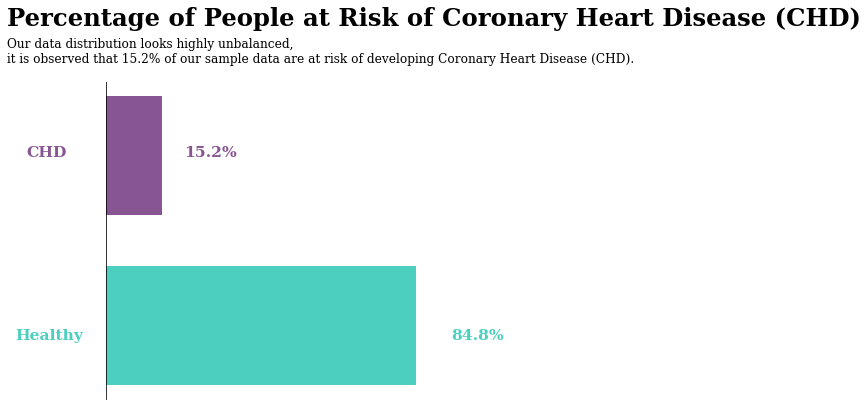

In [523]:
# let us overview the distribution of the target of our data
x = pd.DataFrame(df.groupby(['tenYearCHD'])['tenYearCHD'].count())

# Plot
fig, ax = plt.subplots(figsize=(6, 6), dpi=70)
ax.barh([1], x.tenYearCHD[1], height=0.7, color='#875692')
plt.text(-1050, -0.08, 'Healthy', {'font': 'Serif', 'weight': 'bold', 'size': '16', 'style': 'normal', 'color': '#4ccfbe'})
plt.text(4000, -0.08, '84.8%', {'font': 'Serif', 'weight': 'bold', 'size': '16', 'color': '#4ccfbe'})
ax.barh([0], x.tenYearCHD[0], height=0.7, color='#4ccfbe')
plt.text(-930, 1, 'CHD', {'font': 'Serif', 'weight': 'bold', 'size': '16', 'style': 'normal', 'color': '#875692'})
plt.text(900, 1, '15.2%', {'font': 'Serif', 'weight': 'bold', 'size': '16', 'color': '#875692'})

fig.patch.set_facecolor('white')
ax.set_facecolor('white')

plt.text(-1150, 1.77, 'Percentage of People at Risk of Coronary Heart Disease (CHD)', {'font': 'Serif', 'size': '25', 'weight': 'bold', 'color': 'black'})
plt.text(-1150, 1.55, 'Our data distribution looks highly unbalanced,\nit is observed that 15.2% of our sample data are at risk of developing Coronary Heart Disease (CHD).',
         {'font': 'Serif', 'size': '12.5', 'color': 'black'})

ax.axes.get_xaxis().set_visible(False)
ax.axes.get_yaxis().set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(True)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

plt.show()

From distribution it is clear that **only every 15 people out of 100 people have develpoed CHD from our sampling data**. So this this appears as a highly **unbalanced data distribution**, and null accuracy score of this distribution it self is 85%, whcih imploys any dump model should randomly predictions of CHD could reach accuracy of 85%. So, while modeling and training data, **over sampling and under sampling** have to be done to obtain good and reliable results.

# <a id="2"></a>
<h1 style="background-color:#c5f6ef;font-family:newtimeroman;font-size:250%;text-align:center;border-radius: 15px 50px;"> Dealing with null values</h1>

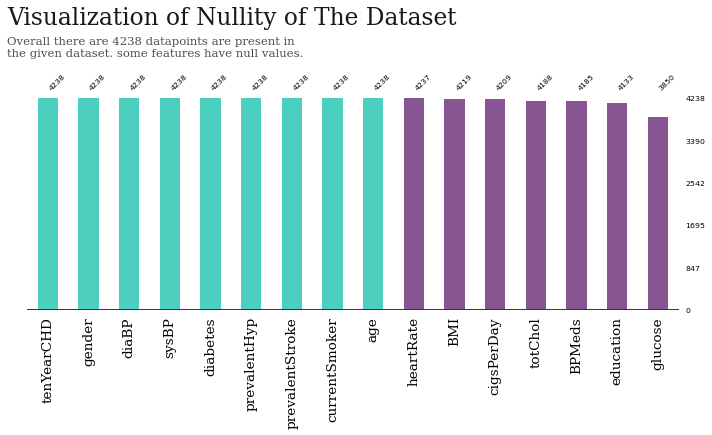

In [524]:
import missingno as msno

color = ['#4ccfbe','#4ccfbe','#4ccfbe','#4ccfbe','#4ccfbe','#4ccfbe','#4ccfbe','#4ccfbe','#4ccfbe','#875692','#875692','#875692', '#875692', '#875692', '#875692', '#875692' , '#875692']
fig, ax = plt.subplots(figsize = (12,4), dpi = 70)
fig.patch.set_facecolor('white')
ax.set_facecolor('white')

msno.bar(df, sort = 'descending', 
         color = color, 
         ax = ax, fontsize =8,
         labels = 'off', filter = 'top')

ax.text(-1,1.35,'Visualization of Nullity of The Dataset',{'font': 'serif', 'size': 24,  'color':'black'},alpha = 0.9)
ax.text(-1,1.2,'Overall there are 4238 datapoints are present in \nthe given dataset. some features have null values.',{'font': 'serif', 'size': 12,  'color':'black'}, alpha = 0.7)

ax.set_xticklabels(ax.get_xticklabels(),rotation = 90, 
                   ha = 'center', **{'font': 'serif', 'size': 14,'weight':'normal','color':'black'}, alpha = 1)
ax.set_yticklabels('')
ax.spines['bottom'].set_visible(True)

plt.show()

**How can we deal with blanks in our data?**

There are many ways. One can simply drop these records, fill the blanks with the mean, the median, or even simply the record before or after the missing value.


# <a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Education</h3>

In [525]:
df['education'].mode()[0]

'High School'

In [526]:
df.loc[df.education.isnull(),'education'] = df['education'].mode()[0]

# <a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">CigsPerDay</h3>

In [527]:
df['cigsPerDay'].median()

0.0

In [528]:
df.loc[df.cigsPerDay.isnull(), 'cigsPerDay'] = df['cigsPerDay'].median()

# <a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">BPMeds</h3>

In [529]:
df['BPMeds'].mode()[0]

0.0

In [530]:
df.loc[df.BPMeds.isnull() ,'BPMeds'] = df['BPMeds'].mode()[0]

# <a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">TotChol</h3>

In [531]:
df['totChol'].median()

234.0

In [532]:
df.loc[df.totChol.isnull(), 'totChol'] = df['totChol'].median()

# <a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">BMI</h3>

In [533]:
df['BMI'].median()

25.4

In [534]:
df.loc[df.BMI.isnull(),'BMI'] = df.BMI.median()

# <a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">HeartRate</h3>

In [535]:
df['heartRate'].median()

75.0

In [536]:
df.loc[df.heartRate.isnull(),'heartRate'] = df.heartRate.median()

# <a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Glucose</h3>

In [537]:
df = df.dropna(subset=['glucose'])

 **All null values have been filled** 

In [538]:
df.isnull().sum()

age                0
education          0
currentSmoker      0
cigsPerDay         0
BPMeds             0
prevalentStroke    0
prevalentHyp       0
diabetes           0
totChol            0
sysBP              0
diaBP              0
BMI                0
heartRate          0
glucose            0
gender             0
tenYearCHD         0
dtype: int64

In [539]:
df.to_csv("updated_CHD.csv")

# <a id="2.1"></a>
<h3 style="background-color:#c5f6ef;font-family:newtimeroman;font-size:250%;text-align:center;border-radius: 15px 50px;">Data Visualization Functions</h3>

There are many different types of graphs, each with its own unique properties and applications. 

We will use :

   1- **Pie plot** : for **Categorical data**
   
   2- **KDE plot** (kernel density estimation plot) : for **Numerical data**
   
   3- **Box Plot** : for **definition of outliers in numerical data**
   
   4- **Histogram** : for **distribution of numerical data**

# <a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Catigorical data</h3>

In [540]:
def pie_plot(df, group_feature, overall_title, colors):
    # Calculate percentage of each category in the group feature
    grouped = df[group_feature].value_counts(normalize=True).rename('percentage').mul(100).reset_index()

    with plt.style.context('fivethirtyeight'):
        fig, ax = plt.subplots(figsize=(8, 6))

        wedges, texts, autotexts = ax.pie(grouped['percentage'], labels=grouped['index'],
                                           autopct='%1.1f%%', colors=colors)
        ax.set_title(f'Distribution of {overall_title}')  # Set the title to be the group feature
        plt.setp(autotexts, size=16, color="w")

        plt.tight_layout()
        plt.show()

In [541]:
def pie_with_target(df, group_feature, overall_title):
    # Calculate percentage of people who developed CHD for each group
    grouped = df.groupby(group_feature)['tenYearCHD'].value_counts(normalize=True).rename('percentage').mul(100).reset_index()

    # Define custom color palette
    custom_palette = {0: '#4ccfbe', 1: '#875692'}
    # Define custom legend labels
    legend_labels = {0: 'Healthy', 1: 'CHD'}

    unique_groups = grouped[group_feature].unique()
    num_unique_groups = len(unique_groups)

    # Ensure all CHD statuses are in custom_palette and legend_labels
    assert set(grouped['tenYearCHD'].unique()).issubset(custom_palette.keys()), "All CHD statuses must be keys in custom_palette"
    assert set(grouped['tenYearCHD'].unique()).issubset(legend_labels.keys()), "All CHD statuses must be keys in legend_labels"

    with plt.style.context('fivethirtyeight'):
        fig, axs = plt.subplots(1, num_unique_groups, figsize=(15, 6))

        if num_unique_groups == 1:
            axs = [axs]  # To handle the case where there is only 1 group

        for i, group_status in enumerate(unique_groups):
            data = grouped[grouped[group_feature]== group_status ]
            labels = data['tenYearCHD'].map(legend_labels).tolist() # map stroke status to labels
            colors = data['tenYearCHD'].map(custom_palette).tolist() # map stroke status to colors
            wedges, texts, autotexts = axs[i].pie(data['percentage'], labels=labels, colors=colors, autopct='%1.1f%%')

            axs[i].set_title(f'{group_status}')  # Set the title to be the group feature and status
            plt.setp(autotexts, size=16, color="w")
        
        
        fig.suptitle(f'Percentage of people who developed CHD grouped by {overall_title} status', fontsize=18)
        plt.tight_layout()
        plt.show()

# <a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Continuous data</h3>

In [542]:
def plot_distribution(df, feature, plot_title):
    with plt.style.context('fivethirtyeight'):
        fig, ax = plt.subplots(1, 2, figsize=(20, 5))

        # Histogram
        sns.histplot(x=feature,
                     data=df, 
                     ax=ax[0],
                     linewidth=0.8,
                     color='#4ccfbe',
                     bins=20).set_title(f"Distribution of {plot_title}")
        ax[0].set_xlabel(plot_title)

        # Box plot for the entire distribution
        sns.boxplot(x=feature,
                    data=df,
                    linewidth=1.5,
                    width=0.5,
                    color='#4ccfbe',
                    ax=ax[1]).set_title(f"Box Plot of {plot_title}")
        ax[1].set_xlabel(plot_title)

        plt.show()

In [543]:
df['TenYearCHD_statue'] = df['tenYearCHD'].map({1: 'CHD', 0: 'Healthy'})
def plot_CHD_vs_Healthy(feature, plot_title, df = df):
    box_plots_colors = {'Healthy': '#4ccfbe', 'CHD':'#875692'}
    
    with plt.style.context('fivethirtyeight'):
        fig, ax = plt.subplots(1, 2, figsize=(20, 5))

        # KDE plot for CHD vs Healthy
        sns.kdeplot(data=df[df['TenYearCHD_statue']=='CHD'], x=feature, color='#875692', fill=True, linewidth=1.5, ec='black', alpha=0.8, zorder=3, ax=ax[0])
        sns.kdeplot(data=df[df['TenYearCHD_statue']=='Healthy'], x=feature, color='#4ccfbe', fill=True, linewidth=1.5, ec='black', alpha=0.8, zorder=3, ax=ax[0])

        ax[0].set_title(f"KDE Plot of {plot_title} by CHD")
        ax[0].set_xlabel(plot_title)
        ax[0].set_ylabel('Density')

        # Box plot for CHD vs Healthy
        sns.boxplot(x=feature,
                    data=df,
                    y="TenYearCHD_statue",
                    linewidth=1.5,
                    palette=box_plots_colors,
                    ax=ax[1]).set_title(f"Distribution of {plot_title} by CHD")
        ax[1].set_xlabel(plot_title)
        ax[1].set_ylabel('10 years CHD Status')

        plt.show()

# <a id="2.2"></a>
<h3 style="background-color:#c5f6ef;font-family:newtimeroman;font-size:250%;text-align:center;border-radius: 15px 50px;">Feature Statistics Functions</h3>

# <a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Catigorical data</h3>

In [544]:
def explore_categorical_variable(feature, data = df):
    # Extract the column from the dataset
    column = data[feature]
    
    # Data type
    data_type = column.dtype
    
    # Count of each category
    count = column.count()
    
    # Mode (most frequent category)
    mode = column.mode().iloc[0]
    
    unique_values = column.nunique()
    
    # Create a DataFrame to store the results
    results_df = pd.DataFrame({
        'Statistics': ['Data Type', 'Count', 'Mode', 'Num of Possible values'],
        'Values': [data_type, count,  mode , unique_values ]
    })
    
    # Remove the index column
    results_df = results_df.reset_index(drop=True)
    
    return results_df

In [545]:
def explore_categories(feature_name, category_names, data=df):
    
    # Extract the column from the dataset
    column = data[feature_name]

    # Data type
    data_type = str(column.dtype)

    # Count of each category
    category_counts = column.value_counts()

    # Percentage of each category
    category_percentages = {category: count / column.count() * 100 for category, count in category_counts.items()}

    # Create a DataFrame for count, percentage, data type, and mode
    result_df = pd.DataFrame({
        f'{feature_name}': category_counts.index,
        'Count': category_counts.values,
        'Percentage': [category_percentages.get(category, 0) for category in category_counts.index],
    })

    # Formatting for Percentage column
    result_df['Percentage'] = result_df['Percentage'].round(2)

    return result_df

# <a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Continuous data</h3>

In [546]:
def explore_continuous_variable(feature, data=df):
    # Extract the column from the dataset
    column = data[feature]
    
    # Data type
    data_type = column.dtype
    
    # Basic statistics
    minimum = int(column.min())
    maximum = int(column.max())
    data_range = maximum - minimum
    mean = round(column.mean())
    median = int(column.median())
    q3 = int(column.quantile(0.75))
    q1 = int(column.quantile(0.25))
    iqr = q3 - q1
    variance = round(column.var(), 2)
    std_deviation = round(column.std(), 2)
    coefficient_of_variation = round(np.sqrt(variance) / mean, 2)
    skewness = round(column.skew(), 2)
    
    # Percentiles
    percentiles = column.describe(percentiles=[0.1, 0.25, 0.5, 0.75, 0.9])
    
    # Number of null values
    num_null_values = column.isnull().sum()
    
    # Calculate outliers based on IQR
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    outliers_percentage = round(((column < lower_bound) | (column > upper_bound)).mean() * 100, 2)
    
    # Create a DataFrame to store the results
    results_df = pd.DataFrame({
        'Statistics': ['Feature', 'Data Type', 'Minimum Value', 'Maximum Value', 'Range', 'Mean', 'Median', 'Q3', 'Q1',
                       'IQR', 'Outliers Percentage', 'Variance', 'Standard Deviation', 'Coefficient of Variation', 'Skewness',
                       '10th Percentile', '25th Percentile', '50th Percentile', '75th Percentile', '90th Percentile',
                       'Number of Null Values','Lower Band' , 'Upper Band'],
        'Values': [feature, data_type, minimum, maximum, data_range, mean, median, q3, q1, iqr, outliers_percentage, variance, std_deviation,
                   coefficient_of_variation, skewness, int(percentiles['10%']), int(percentiles['25%']),
                   int(percentiles['50%']), int(percentiles['75%']), int(percentiles['90%']), num_null_values , lower_bound , upper_bound  
                   ]
    })
    
    results_df = results_df.reset_index(drop=True)
    
    # Create a Styler object
    styled_df = results_df.style.set_properties(**{'text-align': 'center'})
    
    return styled_df

In [547]:
def compare_feature_statistics(feature, data=df):
    # Extract the column for CHD and Healthy individuals
    CHD_column = data[data['tenYearCHD'] == 1][feature]
    healthy_column = data[data['tenYearCHD'] == 0][feature]

    # Basic statistics for CHD
    CHD_mean = int(CHD_column.mean())
    CHD_median = int(CHD_column.median())
    CHD_std_deviation = round(CHD_column.std(), 2)
    CHD_min = int(CHD_column.min())
    CHD_max = int(CHD_column.max())
    CHD_iqr = int(CHD_column.quantile(0.75) - CHD_column.quantile(0.25))

    # Basic statistics for Healthy
    healthy_mean = int(healthy_column.mean())
    healthy_median = int(healthy_column.median())
    healthy_std_deviation = round(healthy_column.std(), 2)
    healthy_min = int(healthy_column.min())
    healthy_max = int(healthy_column.max())
    healthy_iqr = int(healthy_column.quantile(0.75) - healthy_column.quantile(0.25))

    # Create a DataFrame to store the results
    results_df = pd.DataFrame({
        'Statistics': ['Mean', 'Median', 'Std Deviation', 'Min', 'Max', 'IQR'],
        'CHD': [CHD_mean, CHD_median, CHD_std_deviation, CHD_min, CHD_max, CHD_iqr],
        'Healthy': [healthy_mean, healthy_median, healthy_std_deviation, healthy_min, healthy_max, healthy_iqr]
    })

    results_df = results_df.set_index('Statistics')
    
    results_df = results_df.astype(int)

    # Create a Styler object
    styled_df = results_df.style.set_properties(**{'text-align': 'center'})

    return styled_df

# <a id="2.1"></a>
<h3 style="background-color:#c5f6ef;font-family:newtimeroman;font-size:250%;text-align:center;border-radius: 15px 50px;">Features</h3>

# <a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Gender</h3>

**Male or Female**

In [548]:
explore_categorical_variable('gender')

,Statistics,Values
0,Data Type,object
1,Count,3850
2,Mode,female
3,Num of Possible values,2


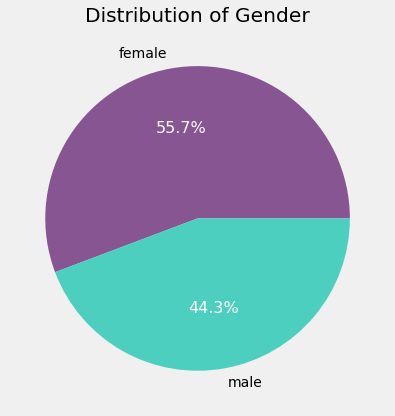

In [549]:
pie_plot(df, 'gender', 'Gender', colors=['#875692','#4ccfbe'])

In [550]:
explore_categories('gender',['male','female'])

,gender,Count,Percentage
0,female,2146,55.74
1,male,1704,44.26


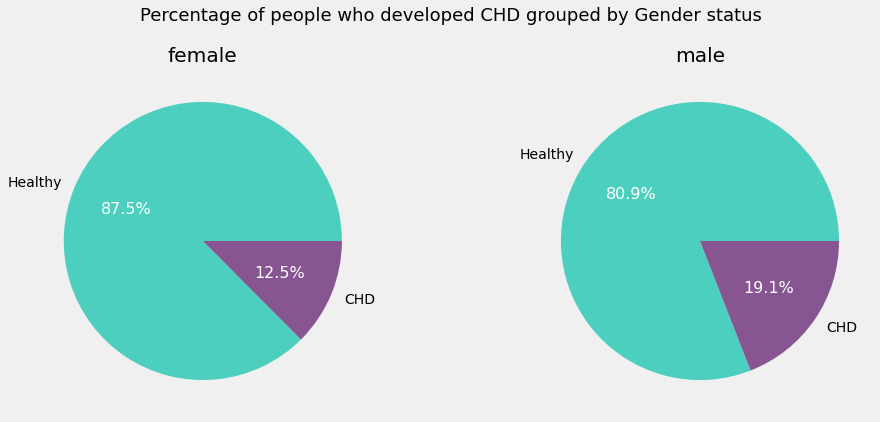

In [551]:
pie_with_target(df, 'gender', 'Gender')

# <a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Age</h3>

**Age of the patient**

In [552]:
explore_continuous_variable('age')

,Statistics,Values
0,Feature,age
1,Data Type,int64
2,Minimum Value,32
3,Maximum Value,70
4,Range,38
5,Mean,50
6,Median,49
7,Q3,57
8,Q1,42
9,IQR,15


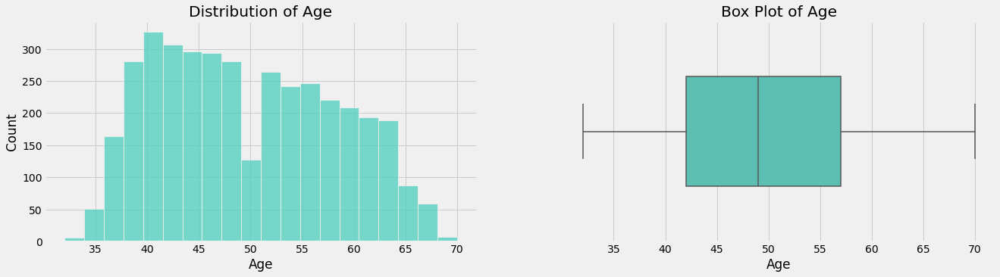

In [553]:
plot_distribution(df, 'age', 'Age')

In [554]:
compare_feature_statistics('age')

,CHD,Healthy
Statistics,,
Mean,54,48
Median,55,48
Std Deviation,8,8
Min,35,32
Max,70,70
IQR,12,13


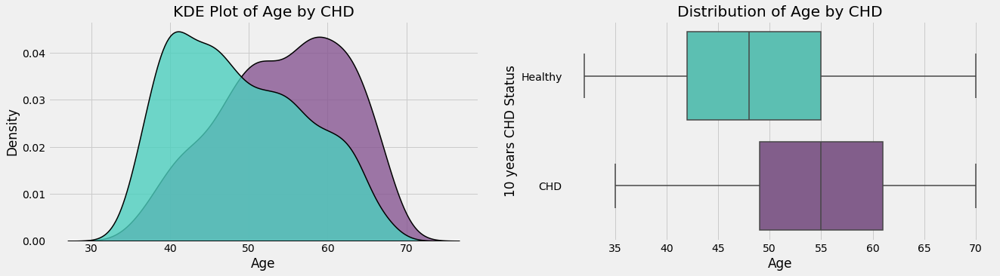

In [555]:
plot_CHD_vs_Healthy("age", "Age")

# <a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Education</h3>

**Education level of the patient**

In [556]:
explore_categorical_variable('education')

,Statistics,Values
0,Data Type,object
1,Count,3850
2,Mode,High School
3,Num of Possible values,4


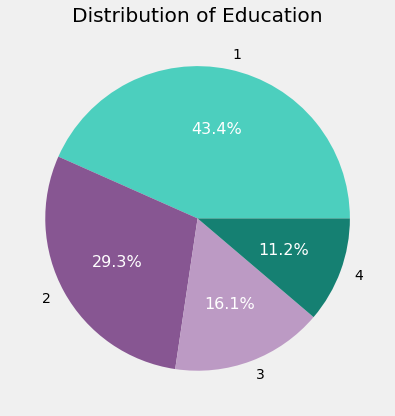

In [697]:
pie_plot(df, 'education', 'Education', colors=['#4ccfbe','#875692','#bc9ac4','#158072'])

In [558]:
explore_categories('education',['High School' , 'High School Diplome/GED' , 'College' , 'Higher Degree'])

,education,Count,Percentage
0,High School,1669,43.35
1,High School Diploma/GED,1128,29.30
2,College,621,16.13
3,Higher Degree,432,11.22


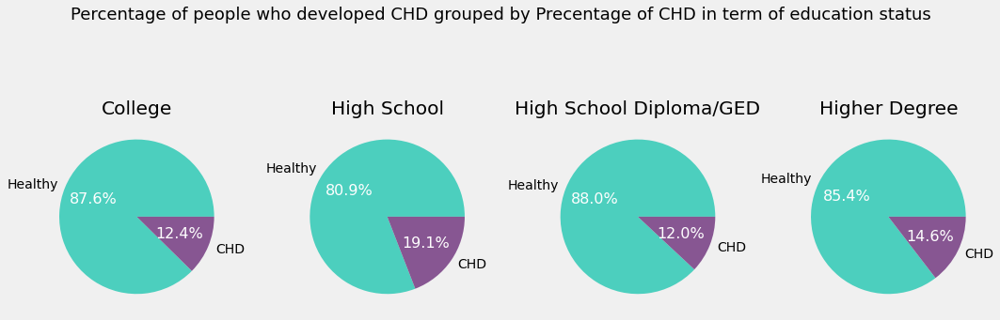

In [559]:
pie_with_target(df,"education","Precentage of CHD in term of education")

# <a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">CurrentSmoker</h3>

**Whether or not the patient is a current smoker**

In [560]:
explore_categorical_variable('currentSmoker')

,Statistics,Values
0,Data Type,int64
1,Count,3850
2,Mode,0
3,Num of Possible values,2


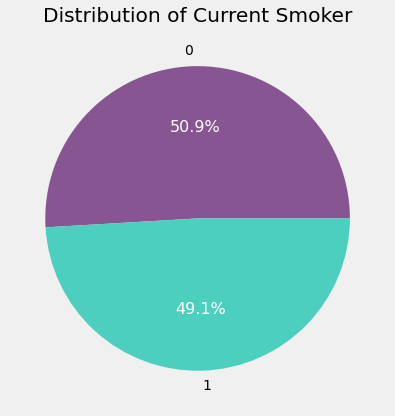

In [561]:
pie_plot(df, 'currentSmoker', 'Current Smoker', colors=['#875692','#4ccfbe'])

In [562]:
explore_categories('currentSmoker',[0,1])

,currentSmoker,Count,Percentage
0,0,1961,50.94
1,1,1889,49.06


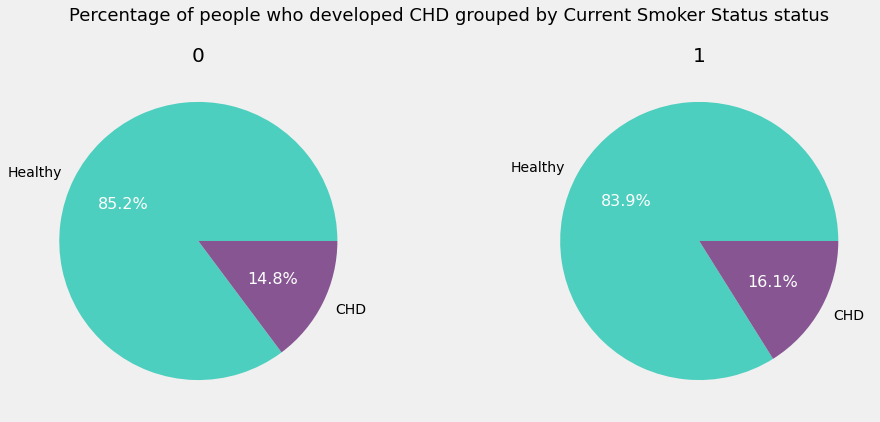

In [563]:
pie_with_target(df, 'currentSmoker', 'Current Smoker Status')

# <a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">CigsPerDay</h3>

**The number of cigarettes that the person smoked on average in one day**

In [564]:
explore_continuous_variable('cigsPerDay')

,Statistics,Values
0,Feature,cigsPerDay
1,Data Type,float64
2,Minimum Value,0
3,Maximum Value,70
4,Range,70
5,Mean,9
6,Median,0
7,Q3,20
8,Q1,0
9,IQR,20


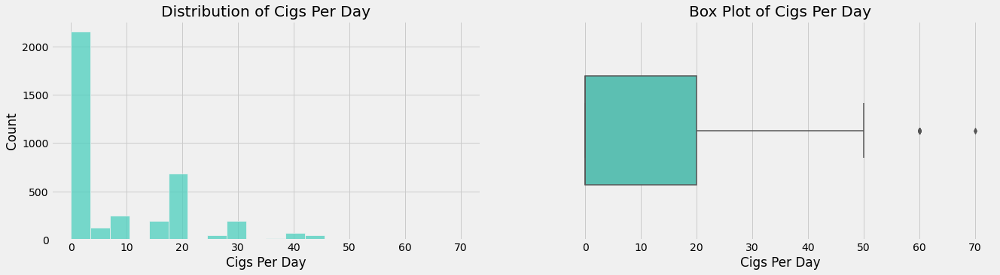

In [565]:
plot_distribution(df, 'cigsPerDay', 'Cigs Per Day')

In [566]:
compare_feature_statistics('cigsPerDay')

,CHD,Healthy
Statistics,,
Mean,10,8
Median,1,0
Std Deviation,12,11
Min,0,0
Max,60,70
IQR,20,20


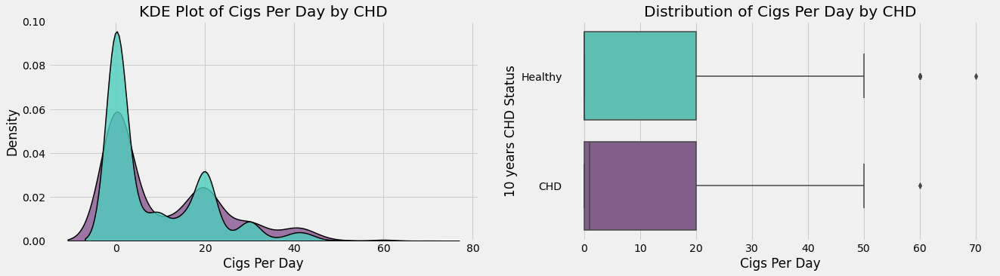

In [567]:
plot_CHD_vs_Healthy("cigsPerDay", "Cigs Per Day")

# <a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">BPMeds</h3>

**Whether or not the patient was on blood pressure medication**

In [568]:
explore_categorical_variable('BPMeds')

,Statistics,Values
0,Data Type,float64
1,Count,3850
2,Mode,0.0
3,Num of Possible values,2


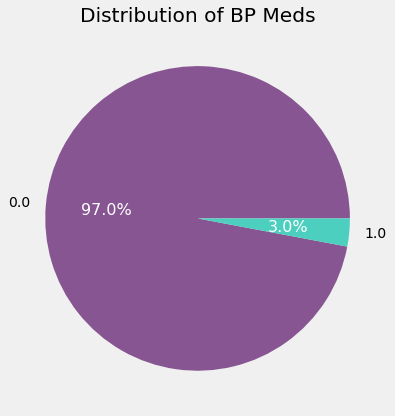

In [569]:
pie_plot(df, 'BPMeds', 'BP Meds', colors=['#875692','#4ccfbe'])

In [570]:
explore_categories('BPMeds',[0,1])

,BPMeds,Count,Percentage
0,0.0,3736,97.04
1,1.0,114,2.96


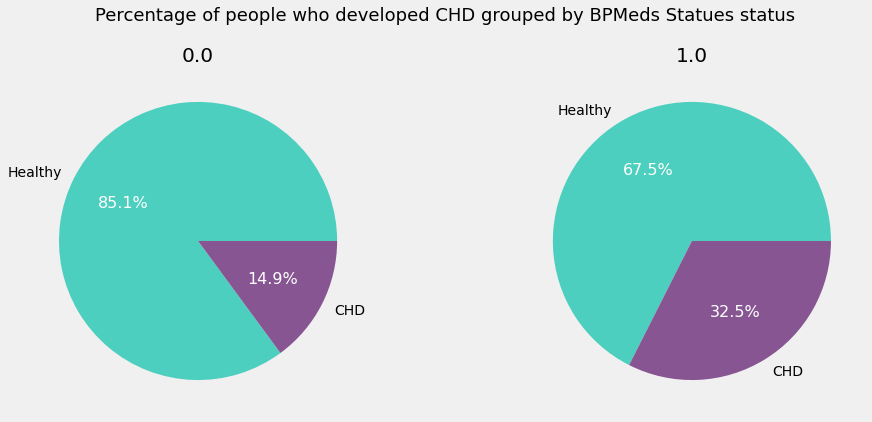

In [571]:
pie_with_target(df, 'BPMeds', 'BPMeds Statues')

# <a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">PrevalentStroke</h3>

**Whether or not the patient had previously had a stroke**

In [572]:
explore_categorical_variable('prevalentStroke')

,Statistics,Values
0,Data Type,int64
1,Count,3850
2,Mode,0
3,Num of Possible values,2


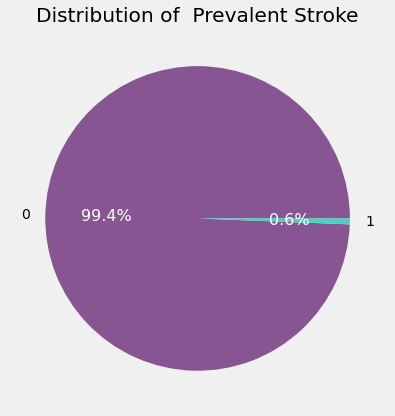

In [573]:
pie_plot(df, 'prevalentStroke', ' Prevalent Stroke', colors=['#875692','#4ccfbe'])

In [574]:
explore_categories('prevalentStroke',[0,1])

,prevalentStroke,Count,Percentage
0,0,3826,99.38
1,1,24,0.62


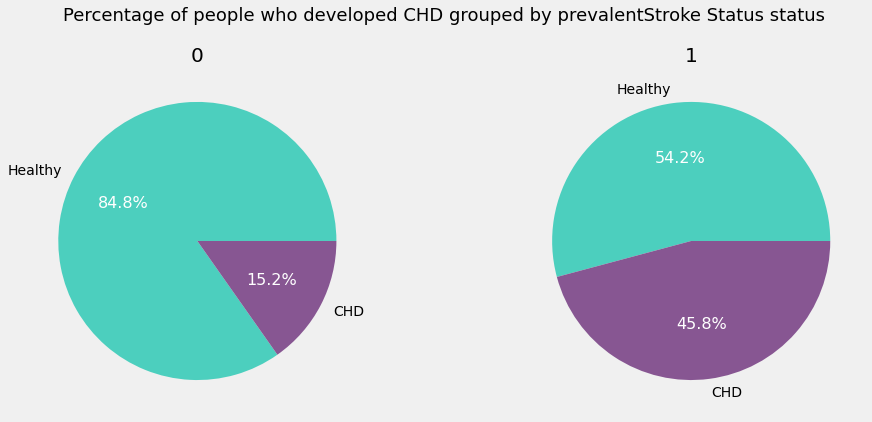

In [575]:
pie_with_target(df, 'prevalentStroke', 'prevalentStroke Status')

# <a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">PrevalentHyp</h3>

**Whether or not the patient was hypertensive**

In [576]:
explore_categorical_variable('prevalentHyp')

,Statistics,Values
0,Data Type,int64
1,Count,3850
2,Mode,0
3,Num of Possible values,2


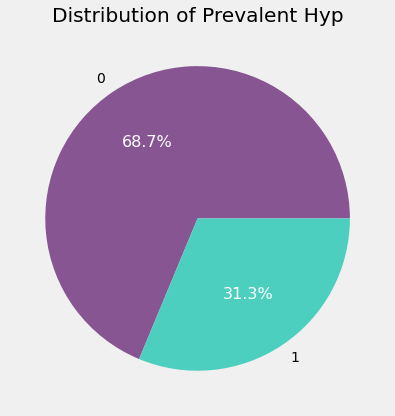

In [577]:
pie_plot(df, 'prevalentHyp', 'Prevalent Hyp', colors=['#875692','#4ccfbe'])

In [578]:
explore_categories('prevalentHyp',[0,1])

,prevalentHyp,Count,Percentage
0,0,2646,68.73
1,1,1204,31.27


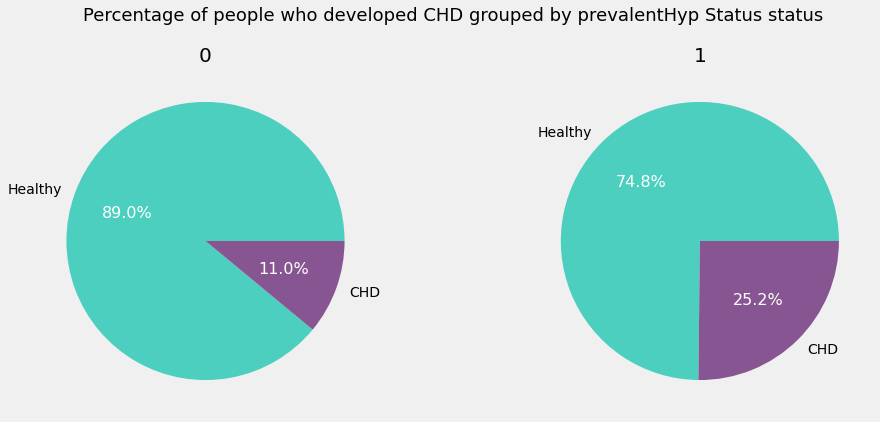

In [579]:
pie_with_target(df, 'prevalentHyp', 'prevalentHyp Status')

# <a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Diabetes</h3>

**Whether or not the patient had diabetes**

In [580]:
explore_categorical_variable('diabetes')

,Statistics,Values
0,Data Type,int64
1,Count,3850
2,Mode,0
3,Num of Possible values,2


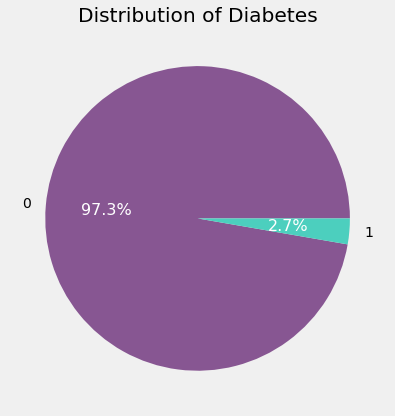

In [581]:
pie_plot(df, 'diabetes', 'Diabetes', colors=['#875692','#4ccfbe'])

In [582]:
explore_categories('diabetes',[0,1])

,diabetes,Count,Percentage
0,0,3745,97.27
1,1,105,2.73


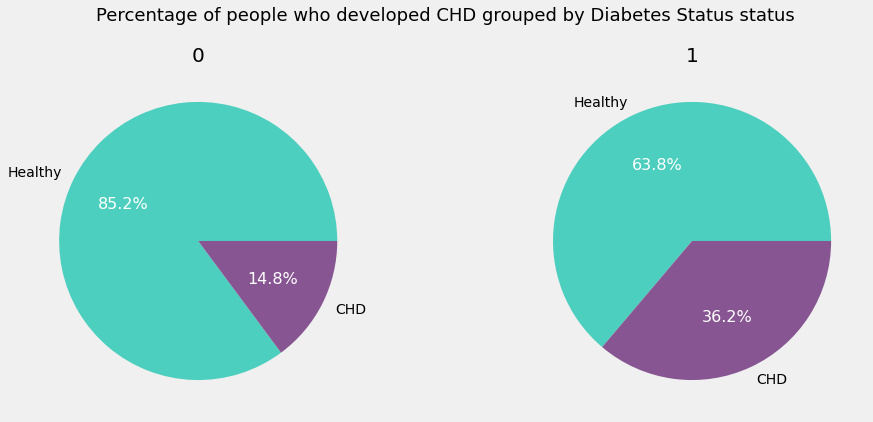

In [583]:
pie_with_target(df, 'diabetes', 'Diabetes Status')

# <a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">TotChol</h3>

**Total cholesterol level**

In [584]:
explore_continuous_variable('totChol')

,Statistics,Values
0,Feature,totChol
1,Data Type,float64
2,Minimum Value,107
3,Maximum Value,696
4,Range,589
5,Mean,237
6,Median,234
7,Q3,264
8,Q1,206
9,IQR,58


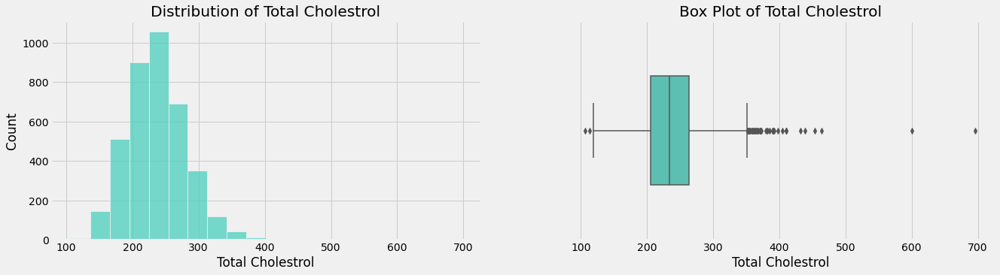

In [585]:
plot_distribution(df, 'totChol', 'Total Cholestrol')

In [586]:
compare_feature_statistics('totChol')

,CHD,Healthy
Statistics,,
Mean,246,235
Median,242,232
Std Deviation,48,43
Min,107,113
Max,600,696
IQR,58,56


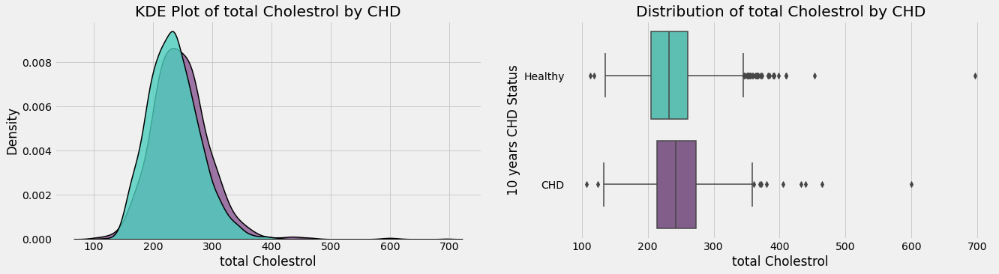

In [587]:
plot_CHD_vs_Healthy("totChol", "total Cholestrol")

# <a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">SysBP</h3>

**Systolic blood pressure**

In [588]:
explore_continuous_variable('sysBP')

,Statistics,Values
0,Feature,sysBP
1,Data Type,float64
2,Minimum Value,83
3,Maximum Value,295
4,Range,212
5,Mean,132
6,Median,128
7,Q3,144
8,Q1,117
9,IQR,27


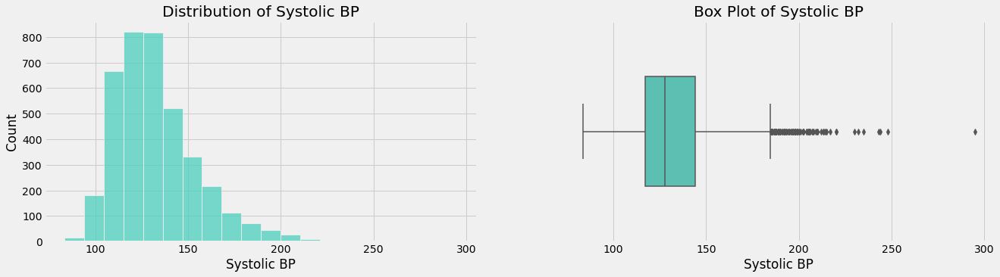

In [589]:
plot_distribution(df, 'sysBP', 'Systolic BP')

In [590]:
compare_feature_statistics('sysBP')

,CHD,Healthy
Statistics,,
Mean,143,130
Median,139,127
Std Deviation,27,20
Min,83,83
Max,295,243
IQR,33,25


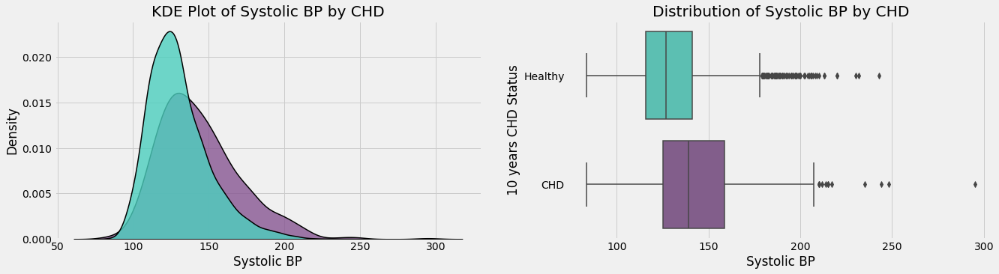

In [591]:
plot_CHD_vs_Healthy("sysBP", "Systolic BP")

# <a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">DiaBP</h3>

**Diastolic blood pressure**

In [592]:
explore_continuous_variable('diaBP')

,Statistics,Values
0,Feature,diaBP
1,Data Type,float64
2,Minimum Value,48
3,Maximum Value,142
4,Range,94
5,Mean,83
6,Median,82
7,Q3,90
8,Q1,75
9,IQR,15


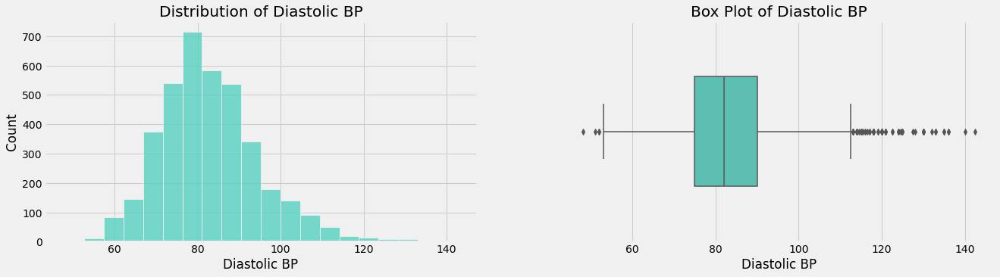

In [593]:
plot_distribution(df, 'diaBP', 'Diastolic BP')

In [594]:
compare_feature_statistics('diaBP')

,CHD,Healthy
Statistics,,
Mean,87,82
Median,85,81
Std Deviation,14,11
Min,48,52
Max,140,142
IQR,17,14


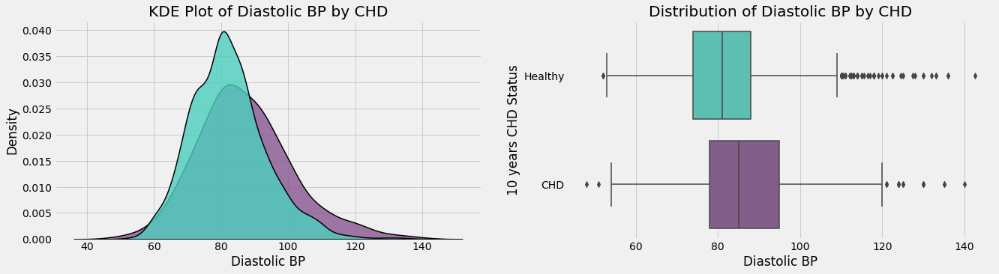

In [595]:
plot_CHD_vs_Healthy("diaBP", "Diastolic BP")

# <a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">BMI</h3>

 **Body Mass Index**

In [596]:
explore_continuous_variable('BMI')

,Statistics,Values
0,Feature,BMI
1,Data Type,float64
2,Minimum Value,15
3,Maximum Value,56
4,Range,41
5,Mean,26
6,Median,25
7,Q3,28
8,Q1,23
9,IQR,5


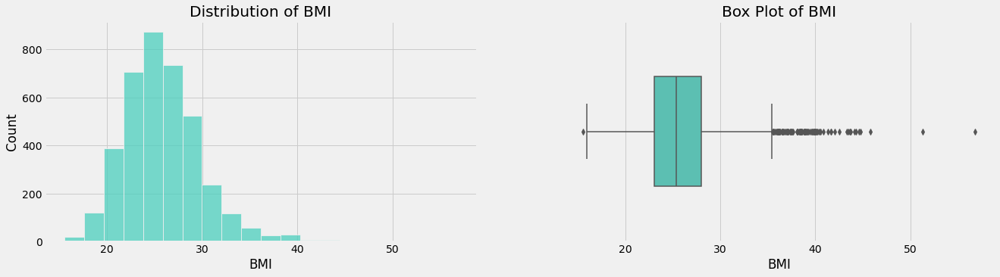

In [597]:
plot_distribution(df, 'BMI', 'BMI')

In [598]:
compare_feature_statistics('BMI')

,CHD,Healthy
Statistics,,
Mean,26,25
Median,26,25
Std Deviation,4,3
Min,15,15
Max,56,51
IQR,5,4


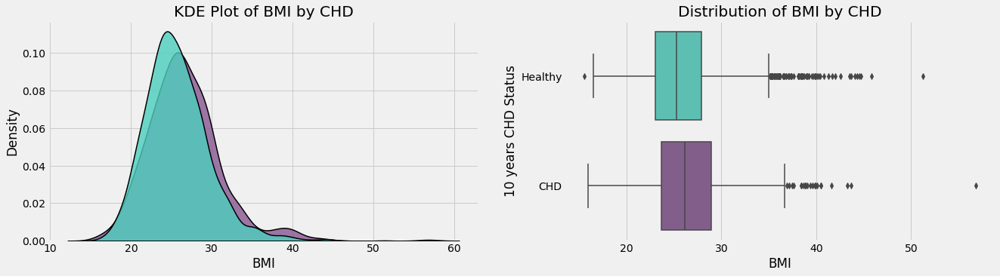

In [599]:
plot_CHD_vs_Healthy("BMI", "BMI")

# <a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">HeartRate</h3>

**Patient's Heart Rate**

In [600]:
explore_continuous_variable('heartRate')

,Statistics,Values
0,Feature,heartRate
1,Data Type,float64
2,Minimum Value,44
3,Maximum Value,143
4,Range,99
5,Mean,76
6,Median,75
7,Q3,82
8,Q1,68
9,IQR,14


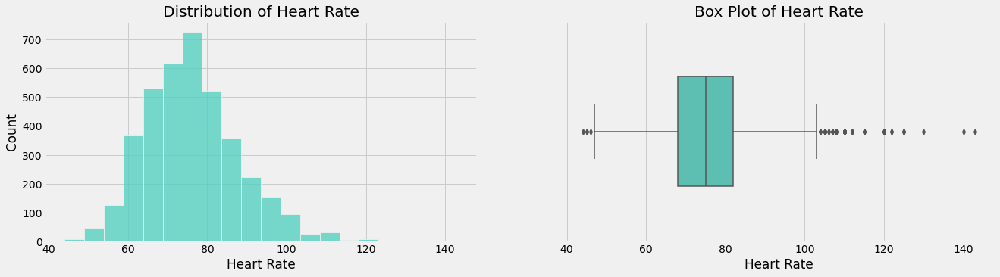

In [601]:
plot_distribution(df, 'heartRate', 'Heart Rate')

In [602]:
compare_feature_statistics('heartRate')

,CHD,Healthy
Statistics,,
Mean,76,75
Median,75,75
Std Deviation,12,11
Min,50,44
Max,120,143
IQR,16,14


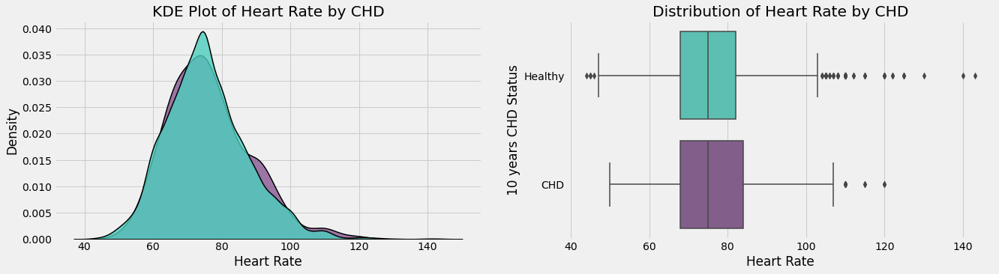

In [603]:
plot_CHD_vs_Healthy("heartRate", "Heart Rate")

# <a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Glucose</h3>

**Glucose level**

In [604]:
explore_continuous_variable('glucose')

,Statistics,Values
0,Feature,glucose
1,Data Type,float64
2,Minimum Value,40
3,Maximum Value,394
4,Range,354
5,Mean,82
6,Median,78
7,Q3,87
8,Q1,71
9,IQR,16


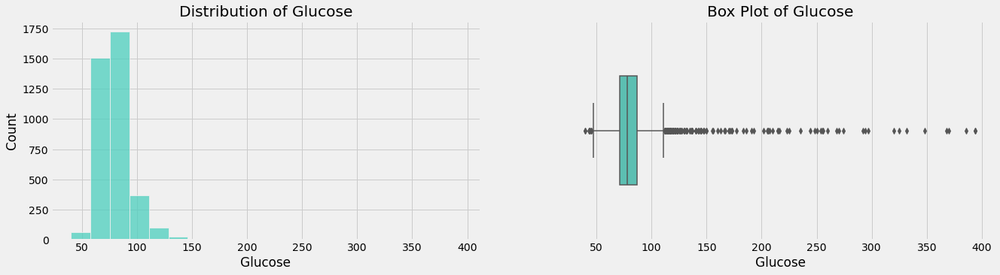

In [605]:
plot_distribution(df, 'glucose', 'Glucose')

In [606]:
compare_feature_statistics('glucose')

,CHD,Healthy
Statistics,,
Mean,89,80
Median,79,78
Std Deviation,41,18
Min,40,40
Max,394,386
IQR,18,15


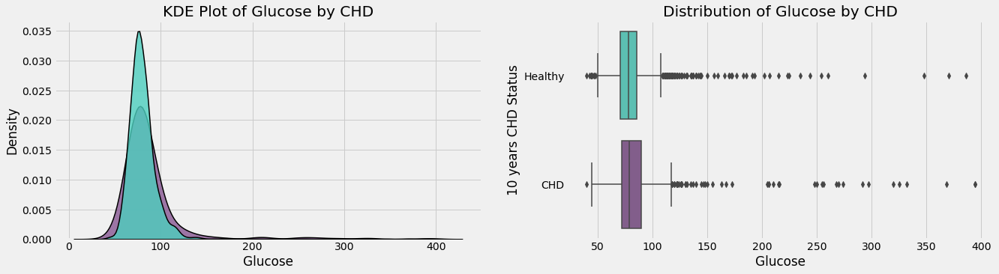

In [607]:
plot_CHD_vs_Healthy("glucose", "Glucose")

# <a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Target</h3>

 **whether the patient has a 10-year risk of coronary heart disease (CHD)**

In [608]:
explore_categorical_variable('tenYearCHD')

,Statistics,Values
0,Data Type,int64
1,Count,3850
2,Mode,0
3,Num of Possible values,2


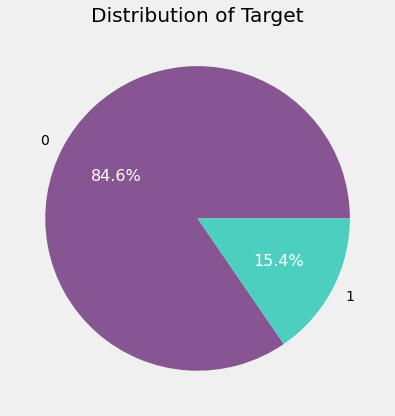

In [609]:
pie_plot(df, 'tenYearCHD', 'Target', colors=['#875692','#4ccfbe'])

In [610]:
explore_categories('tenYearCHD',[0,1])

,tenYearCHD,Count,Percentage
0,0,3256,84.57
1,1,594,15.43


# <a id="2.1"></a>
<h3 style="background-color:#c5f6ef;font-family:newtimeroman;font-size:250%;text-align:center;border-radius: 15px 50px;">Multivariate Analysis</h3>

The primary goal of this multivariate analysis is to gain deeper insights into the complex interplay of factors contributing to not only the risk of coronary heart disease, but also other risk factors and diseases. By examining the relationships between various features in the dataset, we aim to identify key risk factors and potential recommendations for cardiovascular health.

# <a id="2.1"></a>
<h3 style="background-color:#e7fbf8;font-family:newtimeroman;font-size:210%;text-align:center;border-radius: 15px 50px;">Defining Functions</h3>

In [611]:
df2 = df.copy()

In [612]:
df2['diabetes'] = df2['diabetes'].map({1: 'Patient', 0: 'Healthy'})
df2['prevalentHyp'] = df2['prevalentHyp'].map({1: 'Patient', 0: 'Healthy'})
df2['prevalentStroke'] = df2['prevalentStroke'].map({1: 'Patient', 0: 'Healthy'})
df2['currentSmoker'] = df2['currentSmoker'].map({1: 'Patient', 0: 'Healthy'})
df2['BPMeds'] = df2['BPMeds'].map({1: 'Patient', 0: 'Healthy'})

In [613]:
def plot_continuous_vs_categorical_features(feature, categorical_feature, plot_title, df=df2):
    box_plots_colors = {'Healthy': '#4ccfbe', 'Patient':'#875692'}
    
    with plt.style.context('fivethirtyeight'):
        fig, ax = plt.subplots(1, 2, figsize=(20, 5))

        # KDE plot for the continuous feature
        sns.kdeplot(data=df[df[categorical_feature]=='Patient'], x=feature, color='#875692', fill=True, linewidth=1.5, ec='black', alpha=0.8, zorder=3, ax=ax[0])
        sns.kdeplot(data=df[df[categorical_feature]=='Healthy'], x=feature, color='#4ccfbe', fill=True, linewidth=1.5, ec='black', alpha=0.8, zorder=3, ax=ax[0])

        ax[0].set_title(f"KDE Plot of {plot_title}")
        ax[0].set_xlabel(feature)
        ax[0].set_ylabel('Density')

        # Box plot for the continuous feature
        sns.boxplot(x=feature,
                    data=df,
                    y=categorical_feature,
                    linewidth=1.5,
                    palette=box_plots_colors,
                    ax=ax[1]).set_title(f"Distribution of {plot_title}")
        ax[1].set_xlabel(feature)
        ax[1].set_ylabel(categorical_feature)

        plt.show()

In [614]:
label_mapping = {0: 'Healthy', 1: 'CHD'}
def dual_scatter_plot(df, x_feature, y_feature, hue_feature='tenYearCHD', palette={0: '#4ccfbe', 1: '#875692'}, title1='Scatter Plot', title2='Scatter Plot with Target'):
    with plt.style.context('fivethirtyeight'):
        # Create a figure with two subplots
        fig, axes = plt.subplots(1, 2, figsize=(12, 6))

        # Plot the scatter plot on the first subplot
        scatterplot1 = sns.scatterplot(x=x_feature, y=y_feature, data=df, color='#512b58', ax=axes[0])
        axes[0].set_title(title1)

        # Plot the scatter plot on the second subplot
        scatterplot2 = sns.scatterplot(x=x_feature, y=y_feature, data=df, hue=hue_feature, palette=palette, ax=axes[1])

        handles, labels = scatterplot2.get_legend_handles_labels()
        labels = [label_mapping[int(label)] for label in labels]
        scatterplot2.legend(handles, labels)
        axes[1].set_title(title2)

        # Adjust layout
        plt.tight_layout()
        plt.show()

In [615]:
def compare_categorical_percentage(df, group_feature, grouped_by, title1, title2, overall_title):
    # Calculate percentage of people who developed CHD for each group
    grouped = df.groupby(group_feature)[grouped_by].value_counts(normalize=True).rename('percentage').mul(100).reset_index()

    # Define custom color palette
    custom_palette = {0: '#4ccfbe', 1: '#875692'}
    # Define custom x-axis labels
    x_labels = {0: f'Non-{group_feature.capitalize()}', 1: group_feature.capitalize()}
    # Define custom legend labels
    legend_labels = {0: f'Not {grouped_by}', 1: grouped_by}

    with plt.style.context('fivethirtyeight'):
        fig, ax = plt.subplots(1, 2, figsize=(15, 6))

        for i, group_status in enumerate(grouped[group_feature].unique()):
            data = grouped[grouped[group_feature] == group_status]
            wedges, texts, autotexts = ax[i].pie(data['percentage'], labels=[legend_labels[status] for status in data[grouped_by]],
                                                 colors=[custom_palette[status] for status in data[grouped_by]],
                                                 autopct='%1.1f%%')
            ax[i].set_title(title2 if i == 1 else title1)  # Use custom titles for each pie chart
            plt.setp(autotexts, size=16, color="w")
        fig.legend(wedges, legend_labels.values(),loc="center right")
        
        fig.suptitle(f'Percentage of people who are {grouped_by} based on {overall_title} statues')

In [616]:
def compare_feature_statistics2(feature, group_by, data=df):
    # Extract the column for CHD and Healthy individuals
    Group_by_column_1 = data[data[group_by] == 1][feature]
    Group_by_column_0 = data[data[group_by] == 0][feature]

    # Basic statistics for the presence og group by feature
    feature_mean = int(Group_by_column_1.mean())
    feature_median = int(Group_by_column_1.median())
    feature_min = int(Group_by_column_1.min())
    feature_max = int(Group_by_column_1.max())
    feature_std_deviation = round(Group_by_column_1.std(), 2)
    feature_iqr = int(Group_by_column_1.quantile(0.75) - Group_by_column_1.quantile(0.25))

    # Basic statistics for the absence of group by feature
    no_feature_mean = int(Group_by_column_0.mean())
    no_feature_median = int(Group_by_column_0.median())
    no_feature_min = int(Group_by_column_0.min())
    no_feature_max = int(Group_by_column_0.max())
    no_feature_std_deviation = round(Group_by_column_0.std(), 2)
    no_feature_iqr = int(Group_by_column_0.quantile(0.75) - Group_by_column_0.quantile(0.25))

    # Create a DataFrame to store the results
    results_df = pd.DataFrame({
        f'{feature} Statistics': ['Mean', 'Median', 'Min', 'Max', 'Std Deviation', 'IQR'],
        f'{group_by}': [feature_mean, feature_median, feature_min, feature_max, feature_std_deviation, feature_iqr],
        f'Not {group_by}': [no_feature_mean, no_feature_median, no_feature_min, no_feature_max, no_feature_std_deviation, no_feature_iqr]
    })

    results_df = results_df.set_index(f'{feature} Statistics')
    
    results_df = results_df.astype(int)

    # Create a Styler object
    styled_df = results_df.style.set_properties(**{'text-align': 'center'})

    return styled_df

# <a id="2.1"></a>
<h3 style="background-color:#e7fbf8;font-family:newtimeroman;font-size:210%;text-align:center;border-radius: 15px 50px;">Age & Risk Factors Development</h3>

# <a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Age & Diabetes</h3>

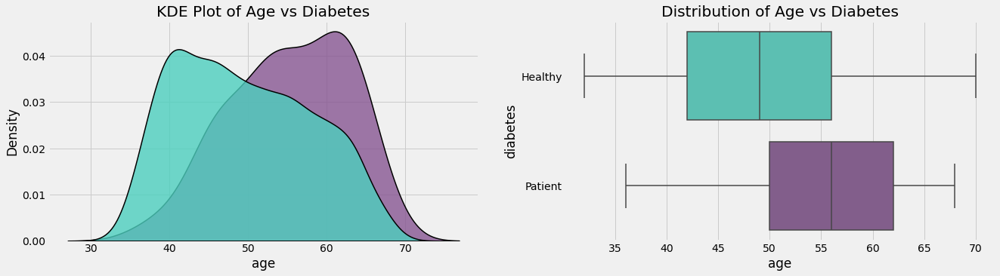

In [617]:
plot_continuous_vs_categorical_features('age', 'diabetes', 'Age vs Diabetes')

In [618]:
compare_feature_statistics2('age', 'diabetes')

,diabetes,Not diabetes
age Statistics,,
Mean,55,49
Median,56,49
Min,36,32
Max,68,70
Std Deviation,7,8
IQR,12,14


# <a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Age & Hypertension</h3>

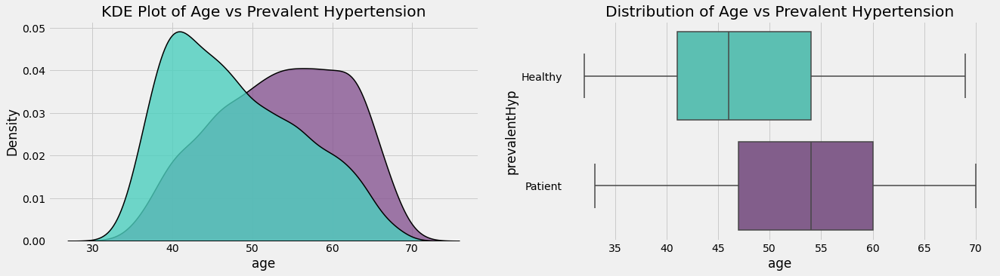

In [619]:
plot_continuous_vs_categorical_features('age', 'prevalentHyp',  'Age vs Prevalent Hypertension')

In [620]:
compare_feature_statistics2('age', 'prevalentHyp')

,prevalentHyp,Not prevalentHyp
age Statistics,,
Mean,53,47
Median,54,46
Min,33,32
Max,70,69
Std Deviation,8,8
IQR,13,13


# <a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Age & Stroke</h3>

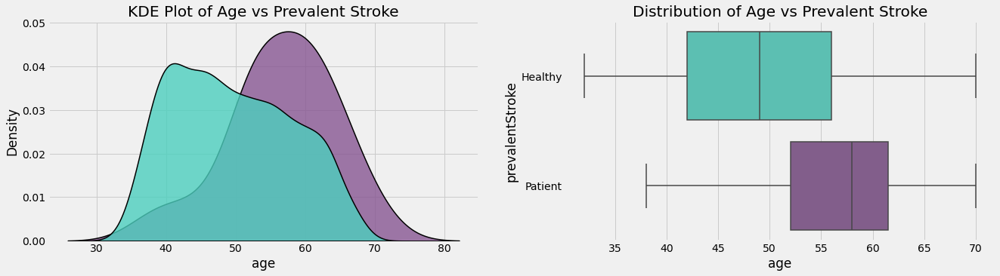

In [664]:
plot_continuous_vs_categorical_features('age', 'prevalentStroke', 'Age vs Prevalent Stroke')

In [622]:
compare_feature_statistics2('age', 'prevalentStroke')

,prevalentStroke,Not prevalentStroke
age Statistics,,
Mean,56,49
Median,58,49
Min,38,32
Max,70,70
Std Deviation,7,8
IQR,9,14


# <a id="2.1"></a>
<h3 style="background-color:#e7fbf8;font-family:newtimeroman;font-size:210%;text-align:center;border-radius: 15px 50px;">Blood Pressure, Cholesterol, Hypertension & Medications</h3

# <a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Systolic Pressure & Hypertension</h3>

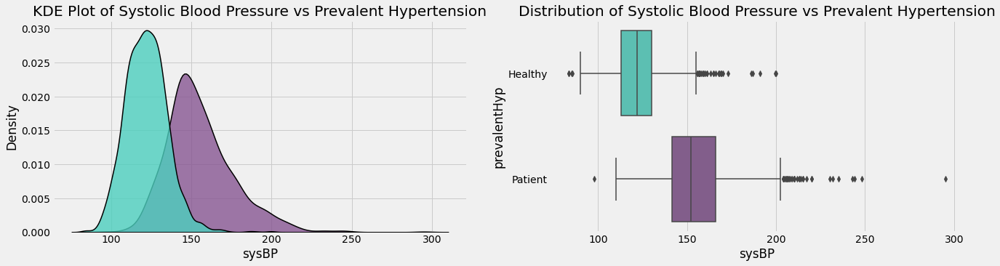

In [623]:
plot_continuous_vs_categorical_features('sysBP', 'prevalentHyp',  'Systolic Blood Pressure vs Prevalent Hypertension')

In [624]:
compare_feature_statistics2('sysBP', 'prevalentHyp')

,prevalentHyp,Not prevalentHyp
sysBP Statistics,,
Mean,155,122
Median,152,122
Min,98,83
Max,295,200
Std Deviation,20,12
IQR,24,17


# <a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Diastolic Pressure & Hypertension</h3>

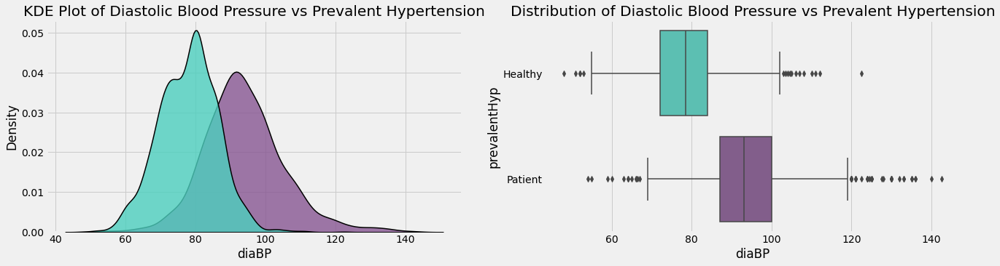

In [625]:
plot_continuous_vs_categorical_features('diaBP', 'prevalentHyp',  'Diastolic Blood Pressure vs Prevalent Hypertension')

In [626]:
compare_feature_statistics2('diaBP', 'prevalentHyp')

,prevalentHyp,Not prevalentHyp
diaBP Statistics,,
Mean,93,77
Median,93,78
Min,54,48
Max,142,122
Std Deviation,11,8
IQR,13,12


# <a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Total Cholesterol & Hypertension</h3>

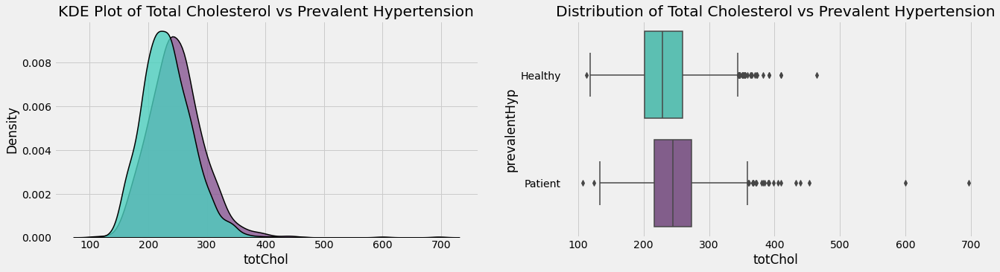

In [627]:
plot_continuous_vs_categorical_features('totChol', 'prevalentHyp',  'Total Cholesterol vs Prevalent Hypertension')

In [628]:
compare_feature_statistics2('totChol', 'prevalentHyp')

,prevalentHyp,Not prevalentHyp
totChol Statistics,,
Mean,247,232
Median,245,229
Min,107,113
Max,696,464
Std Deviation,47,42
IQR,57,57


# <a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Systolic Pressure & Blood Pressure Medications</h3>

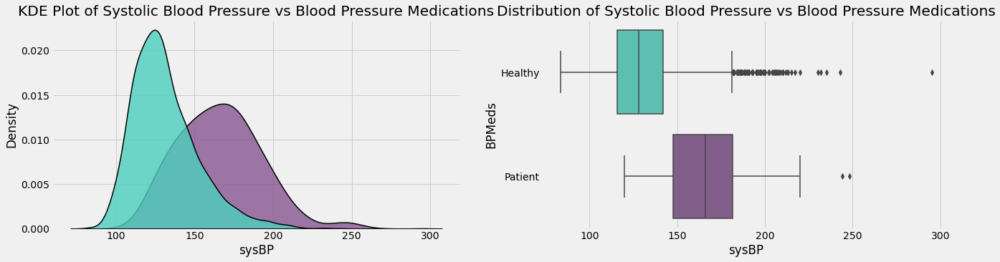

In [629]:
plot_continuous_vs_categorical_features('sysBP', 'BPMeds',  'Systolic Blood Pressure vs Blood Pressure Medications')

In [630]:
compare_feature_statistics2('sysBP', 'BPMeds')

,BPMeds,Not BPMeds
sysBP Statistics,,
Mean,165,131
Median,166,128
Min,120,83
Max,248,295
Std Deviation,25,21
IQR,34,26


# <a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Diastolic Pressure & Blood Pressure Medications</h3>

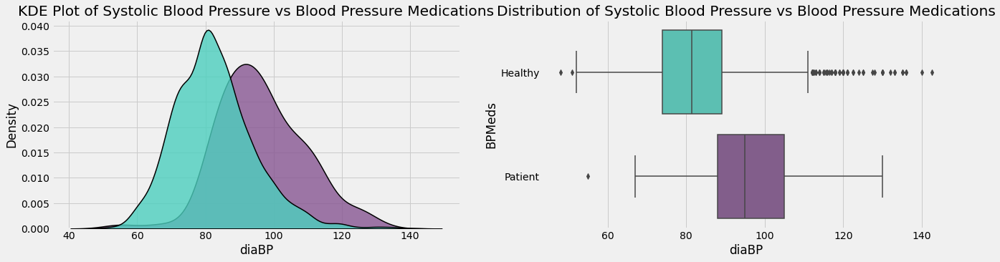

In [631]:
plot_continuous_vs_categorical_features('diaBP', 'BPMeds', 'Systolic Blood Pressure vs Blood Pressure Medications')

In [632]:
compare_feature_statistics2('diaBP', 'BPMeds')

,BPMeds,Not BPMeds
diaBP Statistics,,
Mean,96,82
Median,95,81
Min,55,48
Max,130,142
Std Deviation,12,11
IQR,17,15


# <a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Total Cholesterol & Blood Pressure Medications</h3>

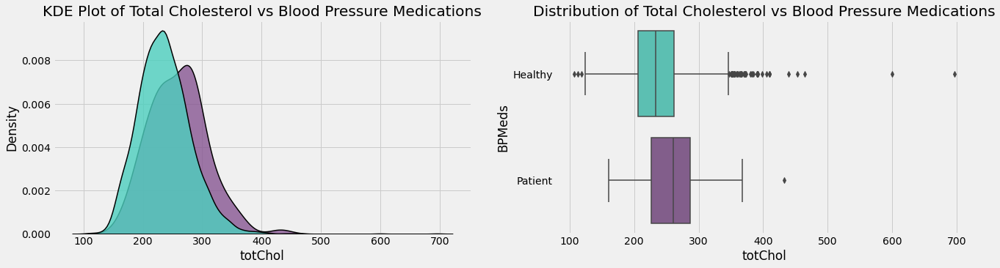

In [633]:
plot_continuous_vs_categorical_features('totChol', 'BPMeds',  'Total Cholesterol vs Blood Pressure Medications')

In [634]:
compare_feature_statistics2('totChol', 'BPMeds')

,BPMeds,Not BPMeds
totChol Statistics,,
Mean,259,236
Median,260,233
Min,161,107
Max,432,696
Std Deviation,47,44
IQR,60,56


# <a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Diastolic Pressure & Systolic Pressure</h3>

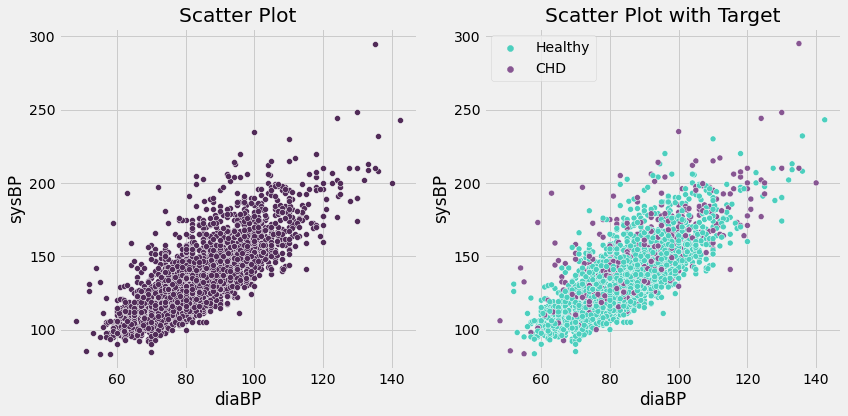

In [635]:
dual_scatter_plot(df, 'diaBP', 'sysBP')

# <a id="2.1"></a>
<h3 style="background-color:#e7fbf8;font-family:newtimeroman;font-size:210%;text-align:center;border-radius: 15px 50px;">Glucose levels & Diabetes</h3>

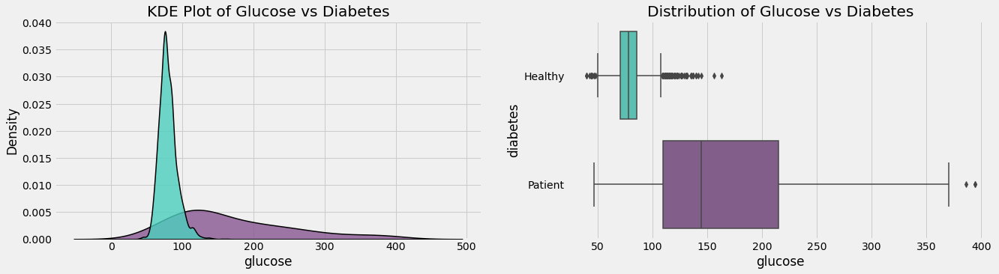

In [636]:
plot_continuous_vs_categorical_features('glucose', 'diabetes', 'Glucose vs Diabetes')

In [637]:
compare_feature_statistics2('glucose', 'diabetes')

,diabetes,Not diabetes
glucose Statistics,,
Mean,170,79
Median,145,78
Min,47,40
Max,394,163
Std Deviation,84,12
IQR,105,15


# <a id="2.1"></a>
<h3 style="background-color:#e7fbf8;font-family:newtimeroman;font-size:210%;text-align:center;border-radius: 15px 50px;">BMI & Risk Factors Development</h3>

# <a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">BMI & Diabetes</h3>

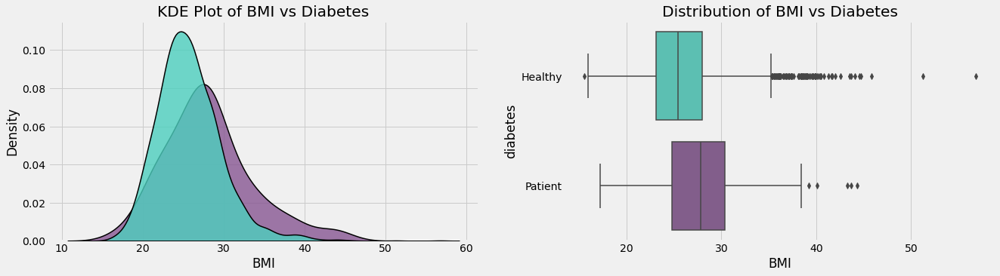

In [638]:
plot_continuous_vs_categorical_features('BMI', 'diabetes', 'BMI vs Diabetes')

In [639]:
compare_feature_statistics2('BMI', 'diabetes')

,diabetes,Not diabetes
BMI Statistics,,
Mean,28,25
Median,27,25
Min,17,15
Max,44,56
Std Deviation,5,3
IQR,5,4


# <a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">BMI & Hypertension</h3>

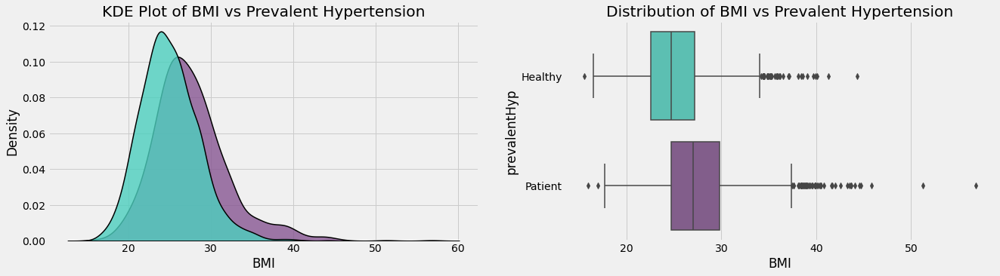

In [640]:
plot_continuous_vs_categorical_features('BMI', 'prevalentHyp',  'BMI vs Prevalent Hypertension')

In [641]:
compare_feature_statistics2('BMI', 'prevalentHyp')

,prevalentHyp,Not prevalentHyp
BMI Statistics,,
Mean,27,24
Median,27,24
Min,15,15
Max,56,44
Std Deviation,4,3
IQR,5,4


# </a>
<h3 style="background-color:#e7fbf8;font-family:newtimeroman;font-size:210%;text-align:center;border-radius: 15px 50px;">Smoking & Risk Factors Development</h3>

# <a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Smoking & Diabetes</h3>

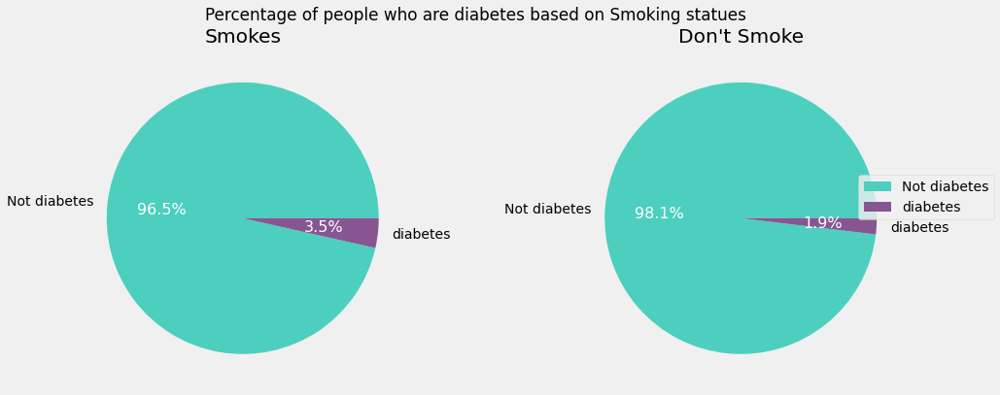

In [642]:
compare_categorical_percentage(df, 'currentSmoker', 'diabetes', 'Smokes', "Don't Smoke", 'Smoking')

# <a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Smoking & Hypertension</h3>

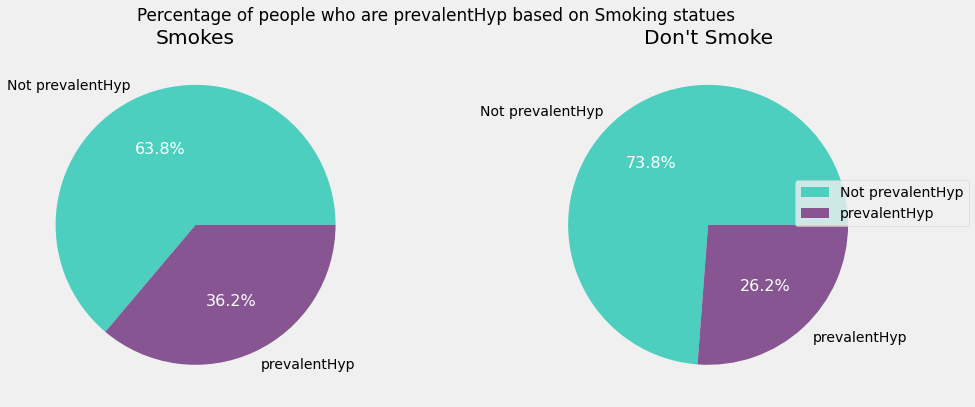

In [643]:
compare_categorical_percentage(df, 'currentSmoker', 'prevalentHyp', 'Smokes', "Don't Smoke", 'Smoking')

<a id="2.1"></a>
<h3 style="background-color:#c5f6ef;font-family:newtimeroman;font-size:250%;text-align:center;border-radius: 15px 50px;">Data Correlation</h3>

In [ ]:
df_copy = df
df_copy['gender'] = df_cop['gender'].map({'male' : 1 , 'female' : 0})
df_copy['education'] = df_cop['education'].map({'High School' : 1 , 'High School Diploma/GED' : 2 ,
                                       'College' : 3     , 'Higher Degree' : 4}) 

In [ ]:
plt.figure(figsize=(17,13))
sns.heatmap(df_copy.corr(), annot=True, annot_kws={"size": 13},cmap='Purples')
plt.show()

# <a id="2.1"></a>
<h3 style="background-color:#c5f6ef;font-family:newtimeroman;font-size:250%;text-align:center;border-radius: 15px 50px;">Statistical & Hypothesis Tests</h3>

# </a>
<h3 style="background-color:#e7fbf8;font-family:newtimeroman;font-size:210%;text-align:center;border-radius: 15px 50px;">Anova Test</h3>

The ANOVA test is used to analyze whether there are significant differences in means between groups. In our case, we are comparing the means of the continuous features such as : age, BMI, blood pressure ...etc across different groups defined by the categorical features such as : CHD. Diabetes, hypertension ...etc

The results of anova test involve :
- F-Statistic: It measures the ratio of the between-group variability to the within-group variability. Higher values of the F-statistic indicate larger differences between the group means.
- p-value: It represents the probability of observing the F-statistic or a more extreme value if the null hypothesis (no difference between group means) is true. A small p-value (typically less than 0.05) suggests strong evidence against the null hypothesis.

In [644]:
column = list(df.columns)
categorical_features = []
continuous_features = []
for i in column:
    if len(df[i].unique()) > 6:
        continuous_features.append(i)
    else:
        categorical_features.append(i)

print('Categorical Features :',*categorical_features)
print('continuous Features :',*continuous_features)

Categorical Features : education currentSmoker BPMeds prevalentStroke prevalentHyp diabetes gender tenYearCHD TenYearCHD_statue
continuous Features : age cigsPerDay totChol sysBP diaBP BMI heartRate glucose


In [645]:
def perform_anova_test(df, categorical_feature):

    # Perform ANOVA for each continuous feature
    anova_results = []
    for continuous_feature in continuous_features:
        groups = []
        for group_name, group_data in df.groupby(categorical_feature):
            groups.append(group_data[continuous_feature].values)
        
        anova_result = stats.f_oneway(*groups)
        anova_results.append((continuous_feature, round(anova_result.statistic,2), anova_result.pvalue))
    
    # Create a DataFrame from the ANOVA results
    anova_results_df = pd.DataFrame(anova_results, columns=['Continuous Feature', 'F-Statistic', 'p-value'])
    
    # Set the Continuous Feature column as the index
    anova_results_df.set_index('Continuous Feature', inplace=True)
    
    # Sort the DataFrame by p-value in ascending order
    anova_results_df = anova_results_df.sort_values('p-value')
    
    return anova_results_df

# <a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">CHD</h3>

In [646]:
perform_anova_test(df, 'tenYearCHD')

,F-Statistic,p-value
Continuous Feature,,
age,225.35,1.514600e-49
sysBP,200.05,2.584417e-44
diaBP,84.32,6.691729e-20
glucose,61.62,5.357519e-15
totChol,32.52,1.267375e-08
BMI,27.29,1.845857e-07
cigsPerDay,11.49,7.065533e-04
heartRate,1.68,1.950502e-01


# <a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Hypertension</h3>

In [647]:
perform_anova_test(df, 'prevalentHyp')

,F-Statistic,p-value
Continuous Feature,,
sysBP,3695.09,0.000000e+00
diaBP,2359.19,0.000000e+00
age,408.72,1.853037e-86
BMI,384.01,1.399159e-81
totChol,107.77,6.429750e-25
heartRate,78.73,1.071332e-18
glucose,29.23,6.800887e-08
cigsPerDay,18.20,2.032478e-05


# <a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Diabetes</h3>

In [648]:
perform_anova_test(df, 'diabetes')

,F-Statistic,p-value
Continuous Feature,,
glucose,2373.14,0.000000e+00
sysBP,49.26,2.632272e-12
age,46.73,9.424730e-12
BMI,35.47,2.818358e-09
heartRate,13.67,2.206471e-04
diaBP,10.58,1.153162e-03
totChol,7.14,7.561014e-03
cigsPerDay,6.43,1.126616e-02


# </a>
<h3 style="background-color:#e7fbf8;font-family:newtimeroman;font-size:210%;text-align:center;border-radius: 15px 50px;">Chi squared Test</h3>

The chi-square test is a statistical test used to determine if there is a significant association between two categorical variables. It helps us understand whether the observed frequencies of categories in the variables differ significantly from what we would expect by chance.

The chi-square test allows us to examine relationships between categorical variables and identify any patterns or dependencies. It helps answer questions such as:

- Are two categorical variables related or independent?
- Are there any significant associations between categories in the variables?

Higher chi-square values indicate a greater deviation from the expected frequencies, suggesting a stronger association between the categorical feature and the target feature.

In [649]:
def perform_chi_square_test(target_feature, categorical_features=categorical_features, df=df):
    categorical_features = [feature for feature in categorical_features if feature != target_feature]

    chi_square_results = []
    for feature in categorical_features:
        contingency_table = pd.crosstab(df[feature], df[target_feature])
        chi2, _, _, expected = chi2_contingency(contingency_table, correction=False)
        chi_square_results.append((feature, round(chi2, 2), expected))

    chi_square_results_df = pd.DataFrame(chi_square_results, columns=['Categorical Feature', 'Chi-Square', 'Expected Frequencies'])
    chi_square_results_df.set_index('Categorical Feature', inplace=True)
    chi_square_results_df = chi_square_results_df.sort_values('Chi-Square', ascending=False)

    return chi_square_results_df

# <a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">CHD</h3>

In [650]:
perform_chi_square_test('tenYearCHD')

,Chi-Square,Expected Frequencies
Categorical Feature,,
TenYearCHD_statue,3850.00,"[[502.3542857142857, 91.64571428571429], [2753..."
prevalentHyp,127.31,"[[2237.76, 408.24], [1018.24, 185.76]]"
diabetes,35.66,"[[3167.2, 577.8], [88.8, 16.2]]"
education,32.32,"[[525.1885714285714, 95.81142857142858], [1411..."
gender,31.11,"[[1814.902857142857, 331.09714285714284], [144..."
BPMeds,26.10,"[[3159.5885714285714, 576.4114285714286], [96...."
prevalentStroke,17.11,"[[3235.7028571428573, 590.2971428571428], [20...."
currentSmoker,1.26,"[[1658.4457142857143, 302.5542857142857], [159..."


# <a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Hypertension</h3>

In [651]:
perform_chi_square_test('prevalentHyp')

,Chi-Square,Expected Frequencies
Categorical Feature,,
BPMeds,258.18,"[[2567.650909090909, 1168.3490909090908], [78...."
tenYearCHD,127.31,"[[2237.76, 1018.24], [408.24, 185.76]]"
TenYearCHD_statue,127.31,"[[408.24, 185.76], [2237.76, 1018.24]]"
currentSmoker,44.33,"[[1347.7418181818182, 613.2581818181818], [129..."
education,32.28,"[[426.79636363636365, 194.20363636363638], [11..."
diabetes,26.60,"[[2573.836363636364, 1171.1636363636364], [72...."
prevalentStroke,21.49,"[[2629.5054545454545, 1196.4945454545455], [16..."
gender,0.00,"[[1474.8872727272728, 671.1127272727273], [117..."


# <a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Diabetes</h3>

In [652]:
perform_chi_square_test('diabetes')

,Chi-Square,Expected Frequencies
Categorical Feature,,
tenYearCHD,35.66,"[[3167.2, 88.8], [577.8, 16.2]]"
TenYearCHD_statue,35.66,"[[577.8, 16.2], [3167.2, 88.8]]"
prevalentHyp,26.60,"[[2573.836363636364, 72.16363636363636], [1171..."
BPMeds,11.82,"[[3634.109090909091, 101.89090909090909], [110..."
education,10.86,"[[604.0636363636364, 16.936363636363637], [162..."
currentSmoker,9.43,"[[1907.5181818181818, 53.481818181818184], [18..."
gender,0.81,"[[2087.4727272727273, 58.527272727272724], [16..."
prevalentStroke,0.19,"[[3721.6545454545453, 104.34545454545454], [23..."


# <a id="2.1"></a>
<h3 style="background-color:#c5f6ef;font-family:newtimeroman;font-size:250%;text-align:center;border-radius: 15px 50px;">Outliers handling discussion</h3>

During our examination of the dataset, we observed the presence of outliers in various features, as indicated by statistical measures such as box plots and histograms we have built before. These outliers were defined as values that **exceeded the range of Q3 + 1.5 IQR (interquartile range) or were below Q1 - 1.5 IQR**. However, we subsequently engaged in discussions with domain experts in the medical field to gain a deeper understanding of these outliers.

The insights provided by **medical domain experts** played a crucial role in our decision-making process. We learned that the outliers we initially identified actually represent valid and plausible data points that **can exist in the real world. These values are not errors or noise but rather reflect extreme occurrences** that can contribute to a comprehensive understanding of the factors associated with CHD.

Based on these discussions and the validation of the outliers, we have made the **informed decision to retain them in our analysis**.

By doing so, we aim to **capture the full range of real-world scenarios and avoid introducing bias into our findings**.

<a id="2.1"></a>
<h3 style="background-color:#c5f6ef;font-family:newtimeroman;font-size:250%;text-align:center;border-radius: 15px 50px;">Modeling</h3>

# <a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Importing Libraries</h3>

In [2]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.preprocessing import label_binarize
from imblearn.over_sampling import SMOTE, ADASYN
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.model_selection import train_test_split, GridSearchCV
import joblib
from sklearn.compose import ColumnTransformer
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_curve, auc, precision_recall_curve
from sklearn.metrics import classification_report, confusion_matrix, matthews_corrcoef, cohen_kappa_score, make_scorer

In [25]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from sklearn.ensemble import VotingClassifier, StackingClassifier,GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB, MultinomialNB, BernoulliNB
import lightgbm as lgb

In [4]:
df = pd.read_csv(r"C:\Users\user\Downloads\updated_CHD (1).csv")

In [5]:
df.head(3)

,age,education,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,gender,tenYearCHD
0,39,Higher Degree,0,0,0,0,0,0,195,106.0,70.0,26.97,80,77,male,0
1,46,High School Diploma/GED,0,0,0,0,0,0,250,121.0,81.0,28.73,95,76,female,0
2,48,High School,1,20,0,0,0,0,245,127.5,80.0,25.34,75,70,male,0


In [6]:
# dropping education column since it's less correlated with our target
df = df.drop('education', axis=1)

In [7]:
df['gender'] = df['gender'].map({'male':1, 'female':0})

<a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Data Balancing & Train-Test Split</h3>

We split our dataset into **70% for training and 30% for testing .**
we use shuffle = True to ensure the data is shuffled before splitting. 
We use a seed to ensure reproducibility in results.

Given that the dataset exhibits a significant **class imbalance**, with approximately six negative cases for every positive case, there is **a risk of developing a classifier that is biased toward the negative class. Such a classifier may yield high accuracy but poor precision and recall. To mitigate this issue, we will balance the dataset using the Synthetic Minority Oversampling Technique (SMOTE).**

This technique involves generating synthetic samples for the minority class to achieve a more balanced distribution, which can improve the performance and fairness of our predictive model.

SMOTE (Synthetic Minority Oversampling Technique) follows a specific procedure to address class imbalance:

SMOTE begins by randomly selecting a minority class instance 'a' and identifies its 'k' nearest neighbors, which are also in the minority class.

A synthetic instance is then created by randomly choosing one of these 'k' nearest neighbors, denoted as 'b,' and connecting 'a' and 'b' to form a line segment within the feature space.

The synthetic instances are generated as a convex combination of the two chosen instances, 'a' and 'b.'

This process is repeated to create synthetic examples for the minority class, effectively oversampling it.

In [8]:
df.columns

Index(['age', 'currentSmoker', 'cigsPerDay', 'BPMeds', 'prevalentStroke',
       'prevalentHyp', 'diabetes', 'totChol', 'sysBP', 'diaBP', 'BMI',
       'heartRate', 'glucose', 'gender', 'tenYearCHD'],
      dtype='object')

In [9]:
X = df[['age', 'currentSmoker', 'cigsPerDay', 'BPMeds', 'prevalentStroke',
       'prevalentHyp', 'diabetes', 'totChol', 'sysBP', 'diaBP', 'BMI',
       'heartRate', 'glucose', 'gender']]      # Features

Y = df['tenYearCHD']                    # Target

# Balancing data distribution 
balancing = SMOTE(sampling_strategy='minority')
X, Y = balancing.fit_resample(X, Y)

x_train , x_test , y_train , y_test = train_test_split(X, Y, test_size=0.3, random_state=42, shuffle = True, stratify=Y)

<a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Data Scaling</h3>

Since Machine learning model does not understand the units of the values of the features. It treats the input just as a simple number but does not understand the true meaning of that value. Thus, it becomes necessary to scale the data.

We have 2 options for data scaling :

1) Normalization

2) Standardization.

As most of the algorithms assume the data to be normally (Gaussian) distributed, Normalization is done for features whose data does not display normal distribution and standardization is carried out for features that are normally distributed but the range of values is huge or small as compared to other features.

From the above transformation, we fit the data on the training data and transform the test data from information based on the training data. If we check the formulas of the Normalization & Standardization, we use mean, standard deviation, min & max values.

**Let's use standard scaler for our dataset for the numeric features.**
StandardScaler() will normalize the features i.e. each column of X, INDIVIDUALLY, so that each column/feature/variable will have μ = 0 and σ=1.


1. **Calculation of Mean (μ):**
   For a given feature $X$, the mean ($\mu$) is calculated as the average value of all samples in $X$.
   $$ \mu = \frac{1}{N} \sum_{i=1}^{N} x_i $$
   where $N$ is the number of samples, and $x_i$ is each individual sample value.

2. **Calculation of Standard Deviation (σ):**
   The standard deviation (σ) measures the amount of variation or dispersion in the feature $X$.
   $$ \sigma = \sqrt{\frac{1}{N} \sum_{i=1}^{N} (x_i - \mu)^2} $$

3. **Standardization (Z-score Normalization):**
   Each sample value $x_i$ in the feature $X$ is standardized (scaled) using the mean ($\mu$) and standard deviation ($\sigma$) calculated above.
   $$ z_i = \frac{x_i - \mu}{\sigma} $$
   The resulting value $z_i$ represents how many standard deviations the original value $x_i$ is away from the mean.

After applying the Standard Scaler, the feature $X$ will have a mean of 0 and a standard deviation of 1. This transformation does not distort the shape of the distribution of the feature and is especially useful for algorithms that assume features to be normally distributed.

The figure below represents different techniques of scaling inclunding standardscaler()

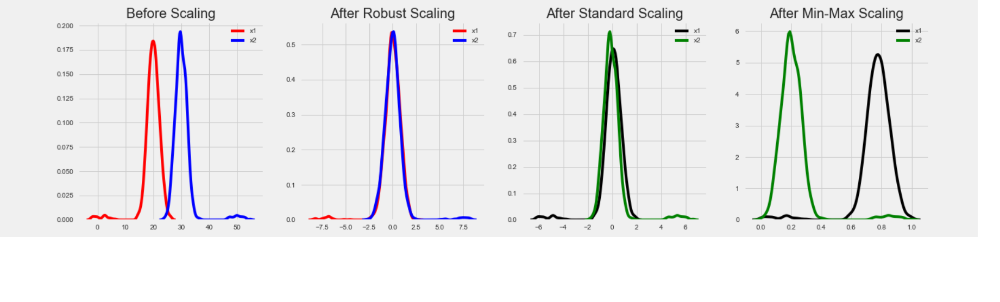

**We will use also one hot encoding for categorical features. This encoding is needed for feeding categorical data to many scikit-learn estimators**!

In [10]:
# Categorical features
cat_feats = [col for col in df.columns if df[col].dtype == "O"]
cat_feats

[]

In [11]:
# Numeric Features
num_feats = [col for col in df.columns if df[col].dtype != "O" and col != 'tenYearCHD']
num_feats

['age',
 'currentSmoker',
 'cigsPerDay',
 'BPMeds',
 'prevalentStroke',
 'prevalentHyp',
 'diabetes',
 'totChol',
 'sysBP',
 'diaBP',
 'BMI',
 'heartRate',
 'glucose',
 'gender']

In [12]:
# Building the transformation pipeline
pipeline = ColumnTransformer([
    ("scaler", StandardScaler(), num_feats)
])

In [13]:
# Saving the pipeline
joblib.dump(pipeline, "pipeline.joblib")

['pipeline.joblib']

In [14]:
pipeline

ColumnTransformer(transformers=[('scaler', StandardScaler(),
                                 ['age', 'currentSmoker', 'cigsPerDay',
                                  'BPMeds', 'prevalentStroke', 'prevalentHyp',
                                  'diabetes', 'totChol', 'sysBP', 'diaBP',
                                  'BMI', 'heartRate', 'glucose', 'gender'])])

In [15]:
x_train = pipeline.fit_transform(x_train)
x_test = pipeline.transform(x_test) 

In [16]:
# Since we only have numerical features, we use num_feats for column names
x_train = pd.DataFrame(x_train, columns=num_feats)
x_test = pd.DataFrame(x_test, columns=num_feats)

In [17]:
# Checking first 3 records of x_train
x_train[0:3]

,age,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,gender
0,1.156466,-0.907304,-0.790299,-0.14668,-0.059352,-0.721351,-0.18447,-0.134226,-0.920340,-1.988560,-0.166546,0.008590,0.468038,-0.822031
1,1.277016,-0.907304,-0.790299,-0.14668,-0.059352,1.386288,-0.18447,0.802169,2.018132,0.844667,0.013658,0.356630,0.818740,-0.822031
2,0.071515,-0.907304,-0.790299,-0.14668,-0.059352,-0.721351,-0.18447,0.712989,-1.025286,-0.733845,-0.879745,1.226729,-0.042073,-0.822031


In [18]:
# Checking first 3 records of x_test
x_test[0:3]

,age,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,gender
0,-1.133985,-0.907304,-0.790299,-0.14668,-0.059352,-0.721351,-0.18447,-1.828654,-0.395613,0.439920,1.419751,3.837028,0.244864,-0.822031
1,0.071515,-0.907304,-0.790299,-0.14668,-0.059352,1.386288,-0.18447,-0.312586,1.111563,1.990648,0.147621,-1.122539,0.372392,1.216499
2,1.156466,1.102167,0.903331,-0.14668,-0.059352,-0.721351,-0.18447,-0.022750,-0.094009,-1.396397,-1.317696,-1.296559,0.149219,-0.822031


In [19]:
# Checking first 3 records of y_train
y_train[0:3]

1712    0
3243    1
1445    0
Name: tenYearCHD, dtype: int64

In [20]:
# Checking first 3 records of y_test
y_test[0:3]

2417    0
4648    1
6334    1
Name: tenYearCHD, dtype: int64

<a id="2.1"></a>
<h3 style="background-color:#c5f6ef;font-family:newtimeroman;font-size:200%;text-align:center;border-radius: 15px 50px;">Models Development</h3>

<a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Optimizing Model Parameters with GridSearchCV</h3>

**While model parameters are learned during the training process, hyperparameters are not. They need to be preset, and their correct configuration can significantly affect the learning process and model’s performance.**

**Model hyperparameters control the learning process of the model and are set before the learning process begins.**

Hyperparameters might include the number of leaves or depth in a decision tree, the number of neighbors in a KNN, the learning rate ...etc among others. Tuning these parameters accurately can dramatically improve your model’s accuracy and performance.

We will employ **GridSearchCV** in our defined function, a powerful tool from Scikit-Learn, to optimize the hyperparameters of various machine learning models. This method systematically works through multiple combinations of parameter tunes, cross-validating as it goes to determine which tune gives the best performance.

The following describes the involved process :
1. **Define Parameter Grid:** For each model, a parameter grid is specified. This grid lists the parameters and the range of values to test.
2. **Initialize the Model**
3. **GridSearchCV Setup:** GridSearchCV is configured with the model, parameter grid, and the number of folds for cross-validation.
4. **Model Fitting and Searching:** The combination of GridSearchCV and the model is fitted to the training data. GridSearchCV runs the model on different parameter combinations and computes the performance for each.
5. **Evaluate and Select Best Parameters:** After fitting, the best parameter combination is chosen based on the performance scores.

<a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Performance Metrics & Evaluation Criteria</h3>

When developing our models, we aim to evaluate their performance using various metrics to gain a comprehensive understanding of their strengths and weaknesses. Given that some of our datasets are imbalanced as we have worked before with the Framingham heart study and stroke prediction datasets and some like this ECG data we that we are dealing with is considered a multi-classification problem with four classes (Normal, MI, History of MI,Abnormal beat) , it is crucial to consider metrics that can account for this class distribution. Here are the performance metrics we will utilize and their formulas:

- **Accuracy**: Accuracy measures the overall correctness of our model's predictions. It calculates the ratio of correctly predicted instances to the total number of instances.

    ![Accuracy = (TP + TN) / (TP + TN + FP + FN)](https://latex.codecogs.com/png.latex?Accuracy%20%3D%20%5Cfrac%7BTP%20%2B%20TN%7D%7BTP%20%2B%20TN%20%2B%20FP%20%2B%20FN%7D)

- **Precision**: Precision measures the proportion of correctly predicted instances for a specific class out of all instances predicted as that class. It focuses on the model's ability to avoid false positives.

    ![Precision = TP / (TP + FP)](https://latex.codecogs.com/png.latex?Precision%20%3D%20%5Cfrac%7BTP%7D%7BTP%20%2B%20FP%7D)

- **Recall (Sensitivity)**: Recall calculates the proportion of correctly predicted instances for a specific class out of all actual instances of that class. It focuses on the model's ability to identify all positive instances, minimizing false negatives.

    ![Recall = TP / (TP + FN)](https://latex.codecogs.com/png.latex?Recall%20%3D%20%5Cfrac%7BTP%7D%7BTP%20%2B%20FN%7D)

- **F1 Score**: The F1 score is the harmonic mean of precision and recall. It provides a balanced measure of the model's performance, considering both false positives and false negatives.

    ![F1 Score = 2 * (Precision * Recall) / (Precision + Recall)](https://latex.codecogs.com/png.latex?F1%20Score%20%3D%202%20%2A%20%5Cfrac%7BPrecision%20%2A%20Recall%7D%7BPrecision%20%2B%20Recall%7D)

- **Confusion Matrix**: A confusion matrix is a table that summarizes the performance of a classification model. It provides a detailed breakdown of true positives (TP), true negatives (TN), false positives (FP), and false negatives (FN) for each class. the figure below shows an example of confusion matrix for a multiclass classification

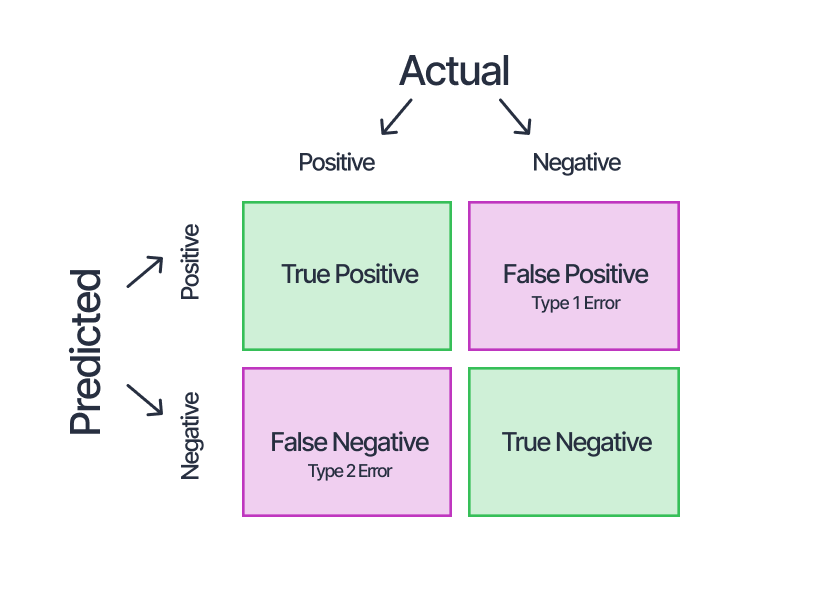

- **ROC & AUC Curve**: The Receiver Operating Characteristic (ROC) curve plots the true positive rate (sensitivity) against the false positive rate (1-specificity) at various classification thresholds. The Area Under the Curve (AUC) summarizes the overall performance of the model across all possible thresholds.

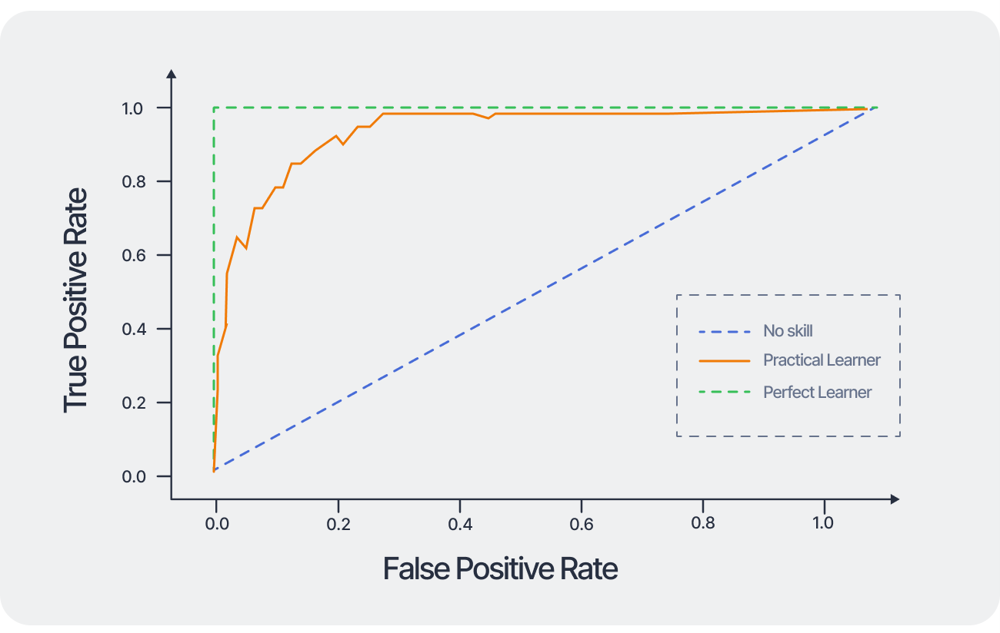

- **Precision-Recall Curve**: The precision-recall curve plots precision against recall at various classification thresholds. It provides insights into the trade-off between precision and recall for different thresholds.

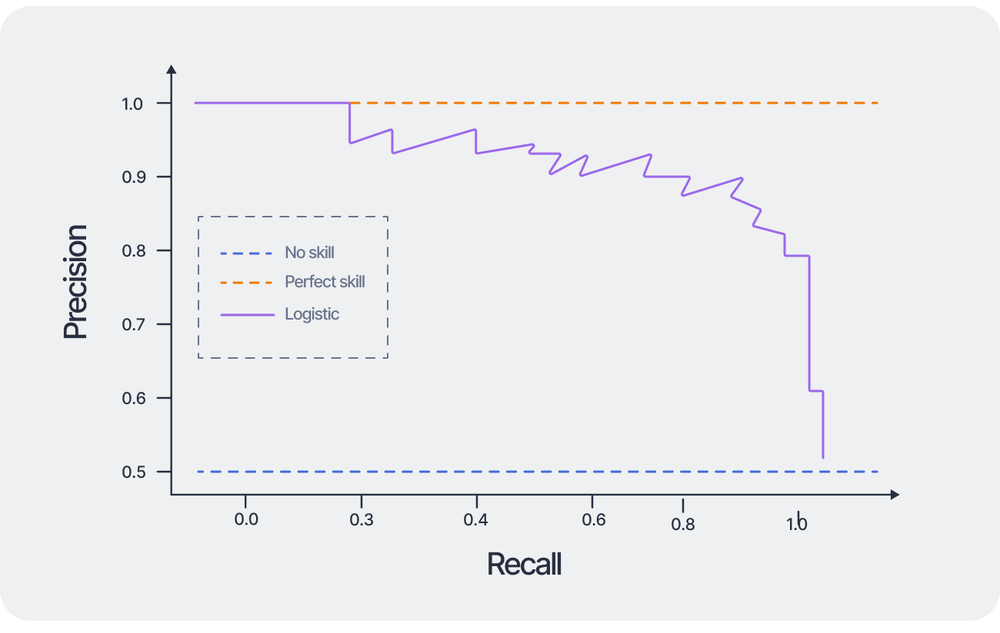

- **Kappa**: Cohen's kappa coefficient measures the agreement between the predicted and actual classes, considering the possibility of the agreement occurring by chance.

- **MCC (Matthews Correlation Coefficient)**: The MCC takes into account true and false positives and negatives and provides a balanced measure of the model's performance. It ranges from -1 to 1, where 1 indicates perfect predictions, 0 represents random predictions, and -1 indicates complete disagreement between predictions and actuals.


By utilizing these different performance metrics, we can gain a more comprehensive understanding of our model's performance. Each metric provides a unique perspective, allowing us to make informed decisions and refine our approach. Considering the imbalanced nature of some of our datasets and the multi-classification problem with four classes, these metrics will help us evaluate our model's performance accurately and guide further improvements.

In [21]:
def evaluate_classifier(name, classifier, params, X_train=x_train, y_train=y_train, X_test=x_test, y_test=y_test):
    # Perform grid search with cross-validation
    cv = GridSearchCV(classifier, params, cv=3)
    cv.fit(X_train, y_train)

    # Predict the target variable for the test set
    y_pred = cv.predict(X_test)

    # Compute and print metrics
    accuracy = cv.score(X_test, y_test)
    print(f'Classifier: {name}')
    print(f'Best Parameters: {cv.best_params_}')
    print(f'Accuracy: {round(accuracy, 2)}')

    # Compute additional performance metrics
    classes = np.unique(y_test)
    cm = confusion_matrix(y_test, y_pred)
    f1 = f1_score(y_test, y_pred, average='weighted')
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    kappa = cohen_kappa_score(y_test, y_pred)
    mcc = matthews_corrcoef(y_test, y_pred)


    class_labels = {0: 'Healthy', 1: '10 Years CHD'}

    print(f'F1 Score: {round(f1, 2)}')
    print(f'Precision: {round(precision, 2)}')
    print(f'Recall: {round(recall, 2)}')
    print(f'Kappa: {round(kappa, 2)}')
    print(f'MCC: {round(mcc, 2)}')
    print(classification_report(y_test, y_pred, target_names=[class_labels[label] for label in classes]))
    
    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Purples)
    plt.title('Confusion Matrix')
    plt.colorbar()
    plt.xticks(np.arange(len(classes)), [class_labels[label] for label in classes], rotation=45)
    plt.yticks(np.arange(len(classes)), [class_labels[label] for label in classes])
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')

    # Add numbers to the confusion matrix
    for i in range(len(classes)):
        for j in range(len(classes)):
            plt.text(j, i, str(cm[i, j]), horizontalalignment='center', verticalalignment='center')
    plt.show()

    # Plot normalized confusion matrix
    cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    plt.figure(figsize=(8, 6))
    plt.imshow(cm_normalized, interpolation='nearest', cmap=plt.cm.Purples)
    plt.title('Normalized Confusion Matrix')
    plt.colorbar()
    plt.xticks(np.arange(len(classes)), [class_labels[label] for label in classes], rotation=45)
    plt.yticks(np.arange(len(classes)), [class_labels[label] for label in classes])
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')

    # Add numbers to the normalized confusion matrix
    for i in range(len(classes)):
        for j in range(len(classes)):
            plt.text(j, i, f'{cm_normalized[i, j]:.2f}', horizontalalignment='center', verticalalignment='center')
    plt.show()


    # Plot ROC curve
    y_prob = cv.predict_proba(X_test)
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(len(classes)):
        fpr[i], tpr[i], _ = roc_curve(y_test, y_prob[:, i], pos_label=i)
        roc_auc[i] = auc(fpr[i], tpr[i])

    plt.figure(figsize=(8, 6))
    for i in range(len(classes)):
        plt.plot(fpr[i], tpr[i], label=f'Class {class_labels[i]} (AUC = {roc_auc[i]:.2f})')
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc='lower right')
    plt.show()

    # Plot Precision-Recall curve for each class
    precision_2 = dict()
    recall_2 = dict()
    for i in range(len(classes)):
        precision_2[i], recall_2[i], _ = precision_recall_curve(y_test == i, y_prob[:, i])

    plt.figure(figsize=(8, 6))
    for i in range(len(classes)):
        plt.plot(recall_2[i], precision_2[i], label=f'Class {class_labels[i]}')

    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.ylim([0.0, 1.05])
    plt.xlim([0.0, 1.0])
    plt.title('Precision-Recall Curve')
    plt.legend(loc='lower right')
    plt.show()

<a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Logistic Regression</h3>

Classifier: Logistic Regression
Best Parameters: {'C': 0.1, 'penalty': 'l2'}
Accuracy: 0.68
F1 Score: 0.68
Precision: 0.68
Recall: 0.68
Kappa: 0.37
MCC: 0.37
              precision    recall  f1-score   support

     Healthy       0.69      0.68      0.68       977
10 Years CHD       0.68      0.69      0.69       977

    accuracy                           0.68      1954
   macro avg       0.68      0.68      0.68      1954
weighted avg       0.68      0.68      0.68      1954



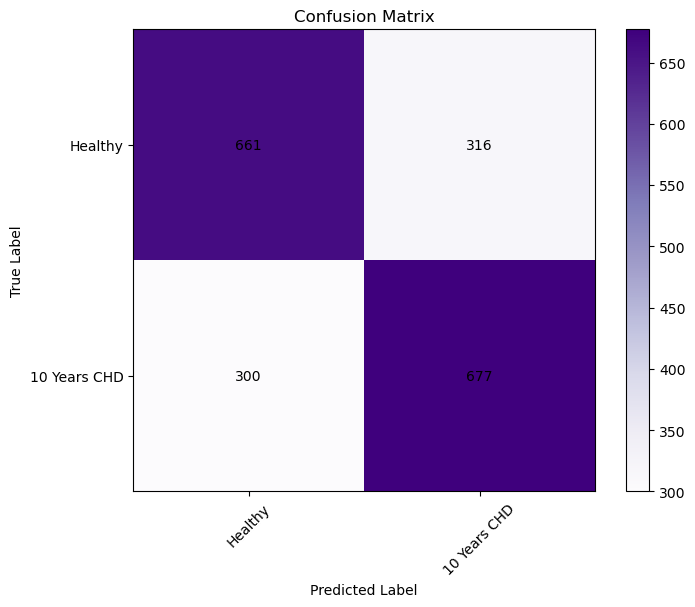

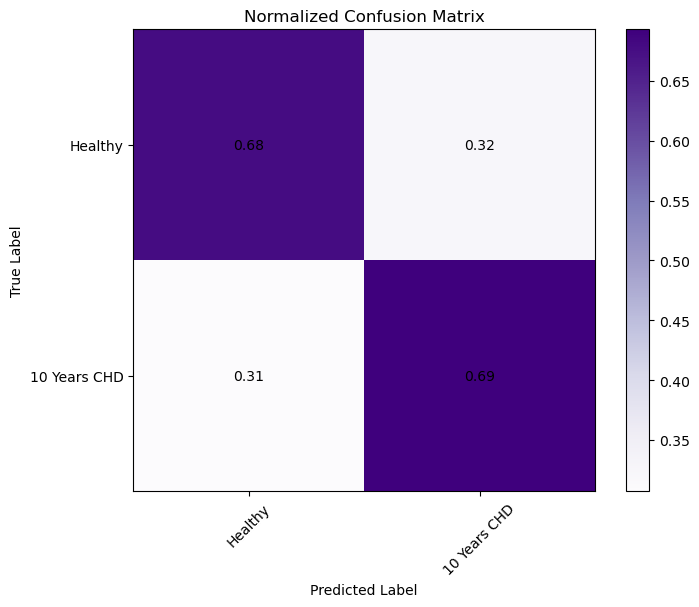

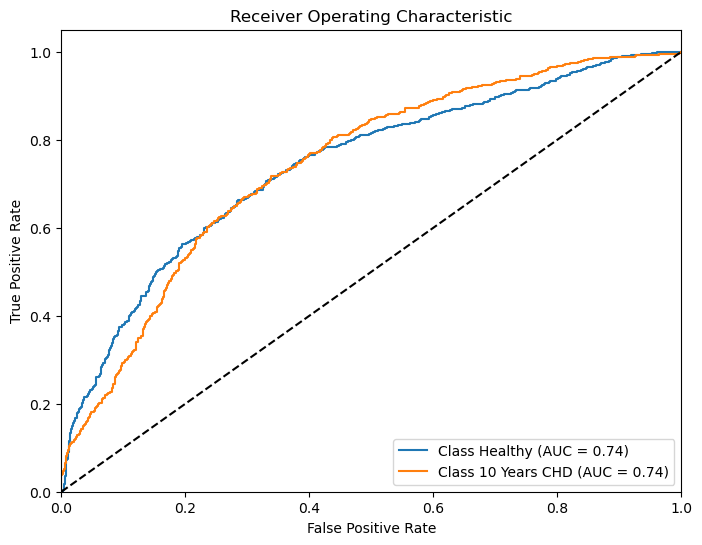

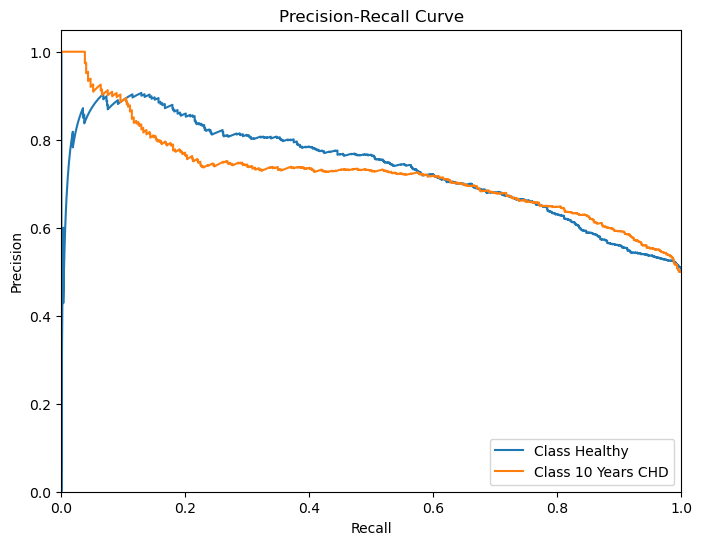

In [22]:
# Define the logistic regression classifier with its corresponding hyperparameters
logistic_regression_params = {
    'C': [0.01, 0.1, 1, 10],
    'penalty': ['l2'],
}

logistic_regression_classifier = LogisticRegression()

# Use the evaluate_classifier function to evaluate the logistic regression classifier
evaluate_classifier('Logistic Regression', logistic_regression_classifier, logistic_regression_params)

<a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">KNN</h3>

Classifier: KNN
Best Parameters: {'leaf_size': 20, 'n_neighbors': 1, 'p': 1, 'weights': 'uniform'}
Accuracy: 0.83
F1 Score: 0.83
Precision: 0.84
Recall: 0.83
Kappa: 0.66
MCC: 0.67
              precision    recall  f1-score   support

     Healthy       0.91      0.74      0.81       977
10 Years CHD       0.78      0.92      0.84       977

    accuracy                           0.83      1954
   macro avg       0.84      0.83      0.83      1954
weighted avg       0.84      0.83      0.83      1954



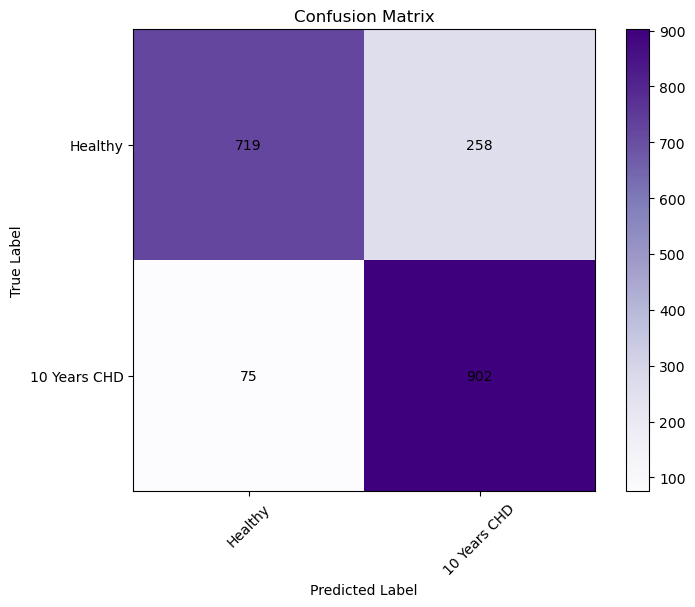

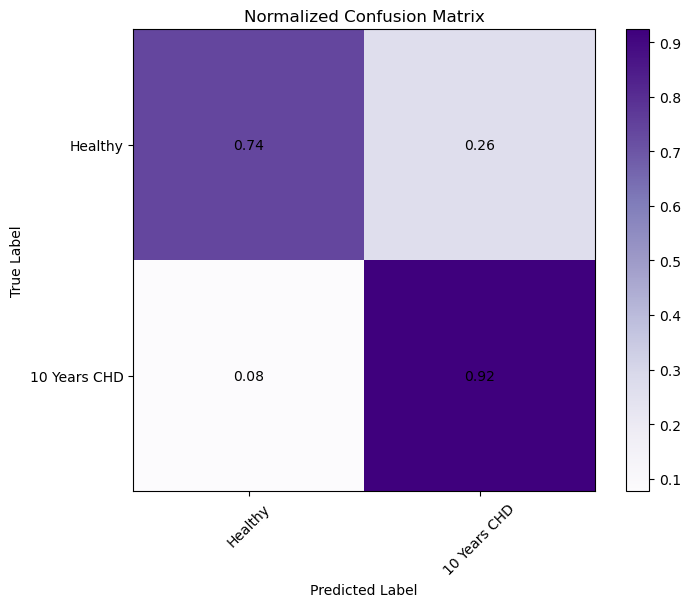

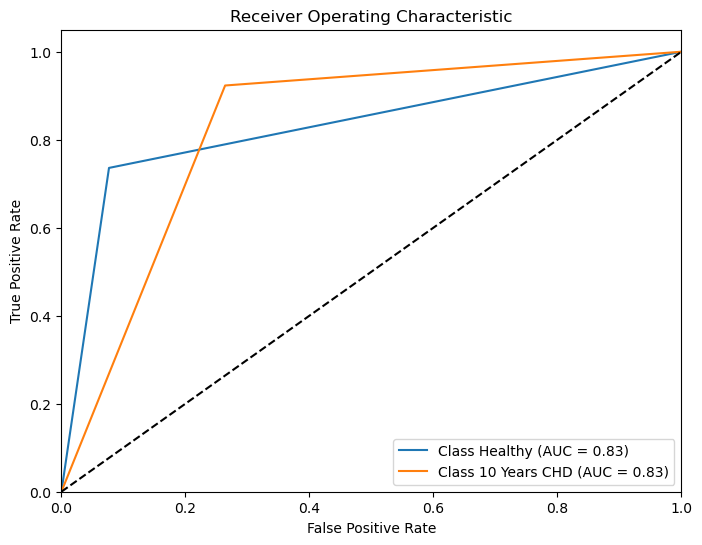

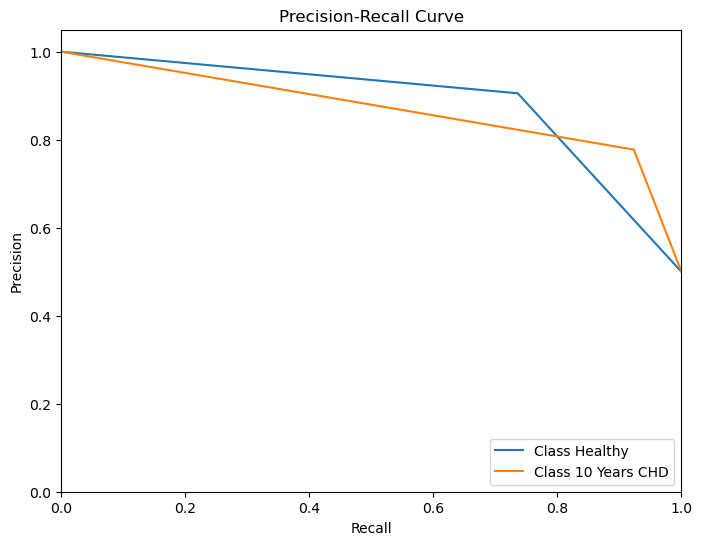

In [24]:
knn_params = {
    'n_neighbors': [1, 2, 3, 4, 5, 7, 9],
    'weights': ['uniform', 'distance'],
    'p': [1, 2],  # 1 for Manhattan, 2 for Euclidean distance
    'leaf_size': [20, 30, 40]
}

knn_classifier = KNeighborsClassifier()

# Use the evaluate_classifier function to evaluate the KNN classifier
evaluate_classifier('KNN', knn_classifier, knn_params)

<a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Naive Bayes</h3>

Classifier: Bernoulli Naive Bayes
Best Parameters: {'alpha': 0.01, 'binarize': 0.1}
Accuracy: 0.62
F1 Score: 0.62
Precision: 0.63
Recall: 0.62
Kappa: 0.25
MCC: 0.25
              precision    recall  f1-score   support

     Healthy       0.61      0.69      0.65       814
10 Years CHD       0.64      0.55      0.60       814

    accuracy                           0.62      1628
   macro avg       0.63      0.62      0.62      1628
weighted avg       0.63      0.62      0.62      1628



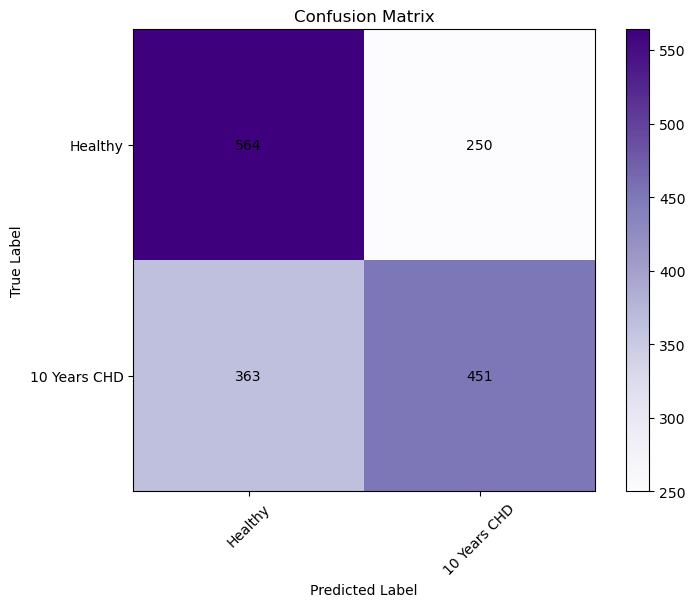

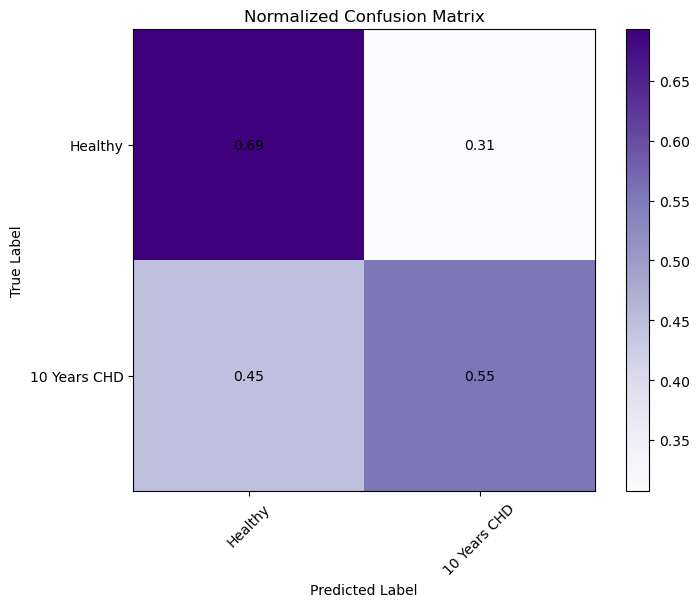

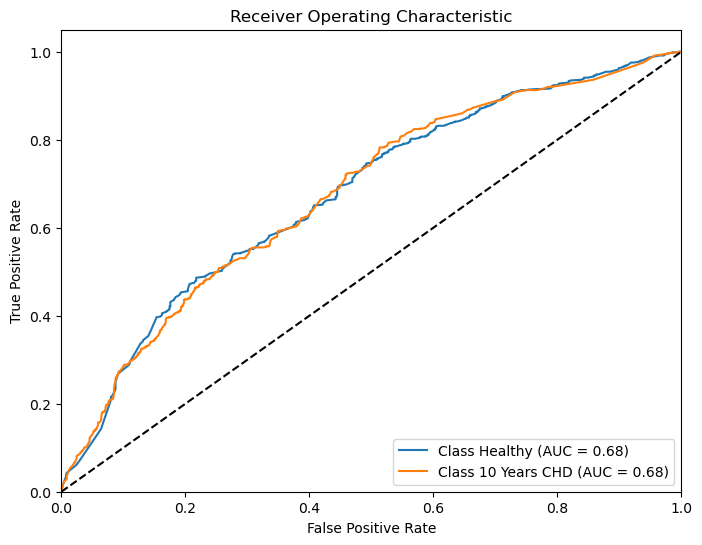

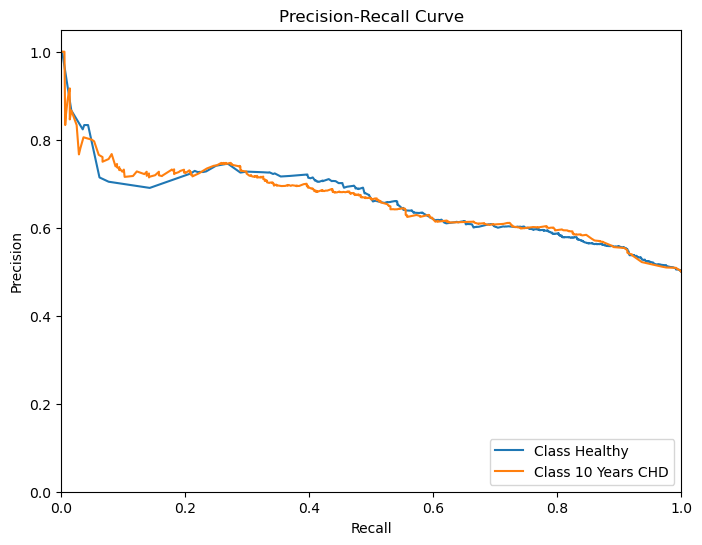

In [104]:
# Define the Bernoulli Naive Bayes classifier with hyperparameters to tune
bnb_params = {
    'alpha': [0.01, 0.1, 0.5, 1, 10],
    'binarize': [0.0, 0.1, 0.2, 0.3]  # Threshold for binarizing of the input features
}

bnb_classifier = BernoulliNB()

# Use the evaluate_classifier function to evaluate the Bernoulli Naive Bayes classifier
evaluate_classifier('Bernoulli Naive Bayes', bnb_classifier, bnb_params)


Classifier: Gaussian Naive Bayes
Best Parameters: {'var_smoothing': 1e-09}
Accuracy: 0.62
F1 Score: 0.61
Precision: 0.63
Recall: 0.62
Kappa: 0.23
MCC: 0.25
              precision    recall  f1-score   support

     Healthy       0.59      0.78      0.67       814
10 Years CHD       0.67      0.45      0.54       814

    accuracy                           0.62      1628
   macro avg       0.63      0.62      0.61      1628
weighted avg       0.63      0.62      0.61      1628



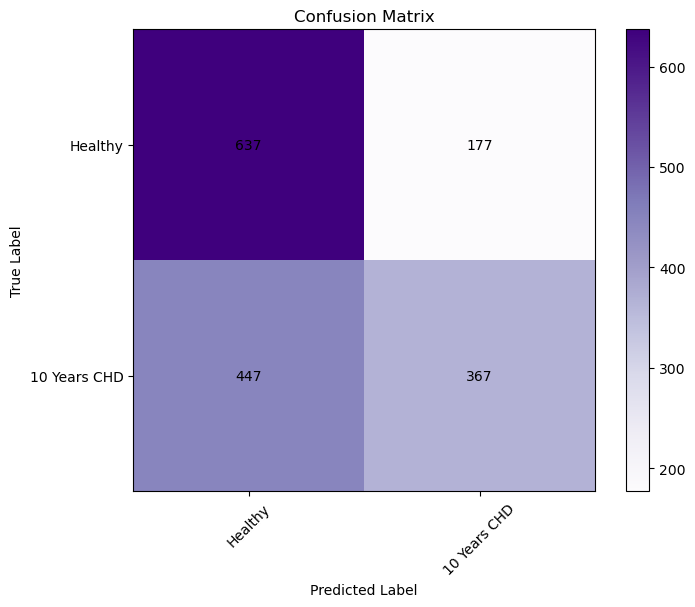

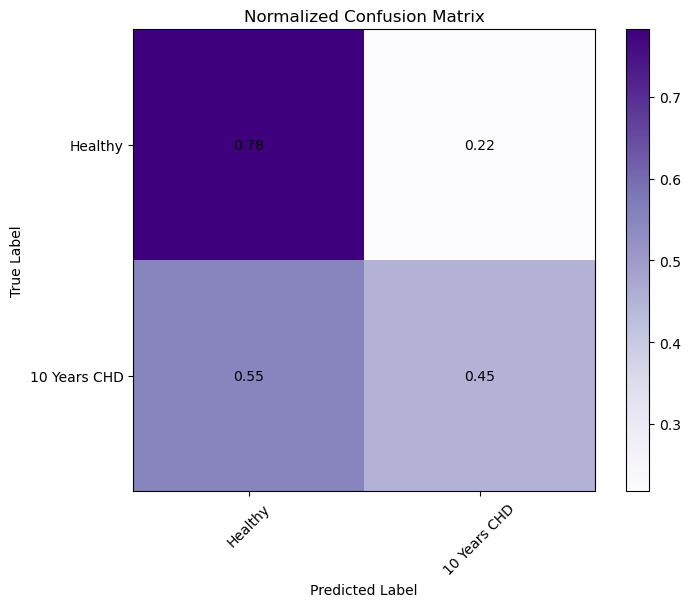

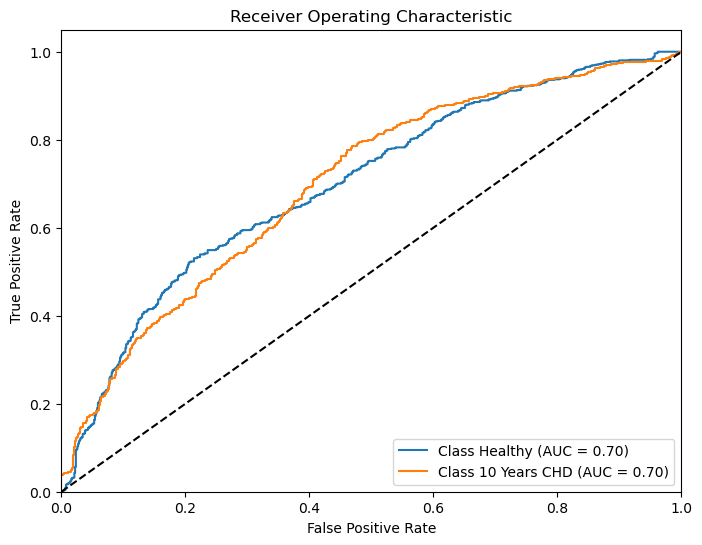

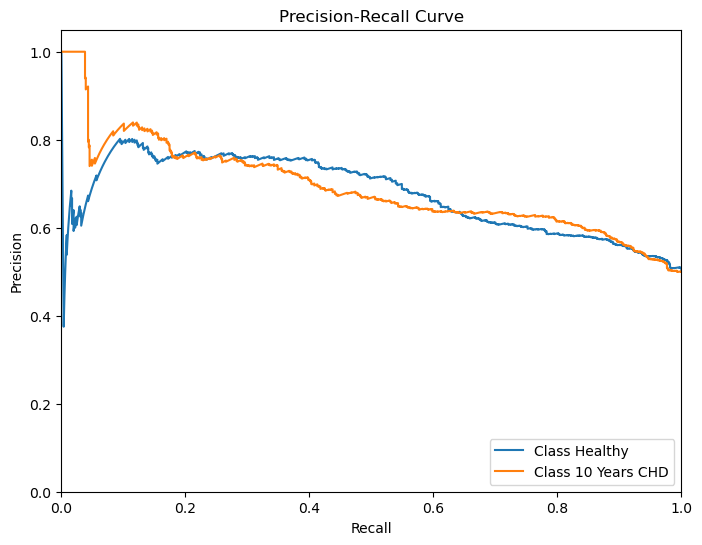

In [105]:
# Define the Gaussian Naive Bayes classifier with possible var_smoothing values
gnb_params = {
    'var_smoothing': [1e-9, 1e-8, 1e-7, 1e-6, 1e-5]
}

gnb_classifier = GaussianNB()

# Use the evaluate_classifier function to evaluate the Gaussian Naive Bayes classifier
evaluate_classifier('Gaussian Naive Bayes', gnb_classifier, gnb_params)

<a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">SVM</h3>

Classifier: SVM
Best Parameters: {'C': 10, 'gamma': 0.1, 'kernel': 'rbf'}
Accuracy: 0.78
F1 Score: 0.78
Precision: 0.78
Recall: 0.78
Kappa: 0.56
MCC: 0.56
              precision    recall  f1-score   support

     Healthy       0.79      0.76      0.77       814
10 Years CHD       0.77      0.79      0.78       814

    accuracy                           0.78      1628
   macro avg       0.78      0.78      0.78      1628
weighted avg       0.78      0.78      0.78      1628



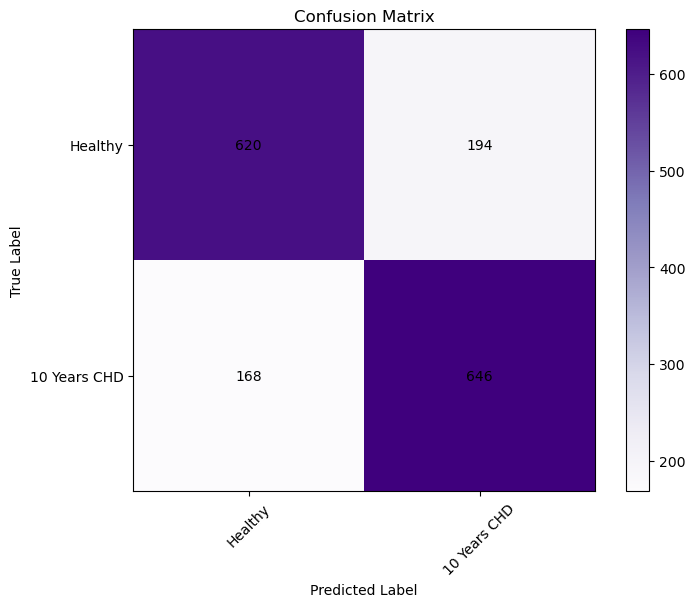

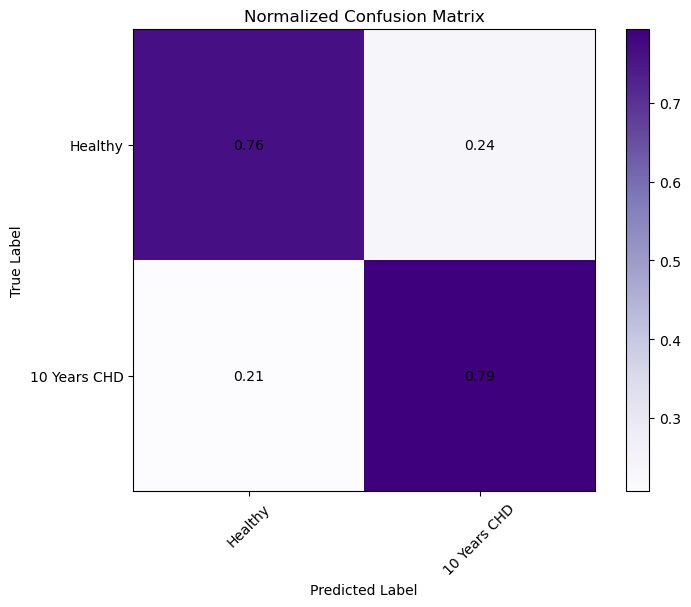

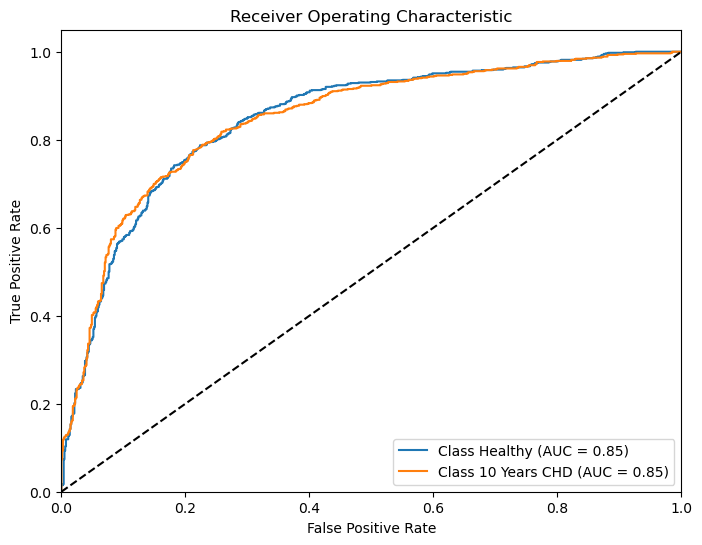

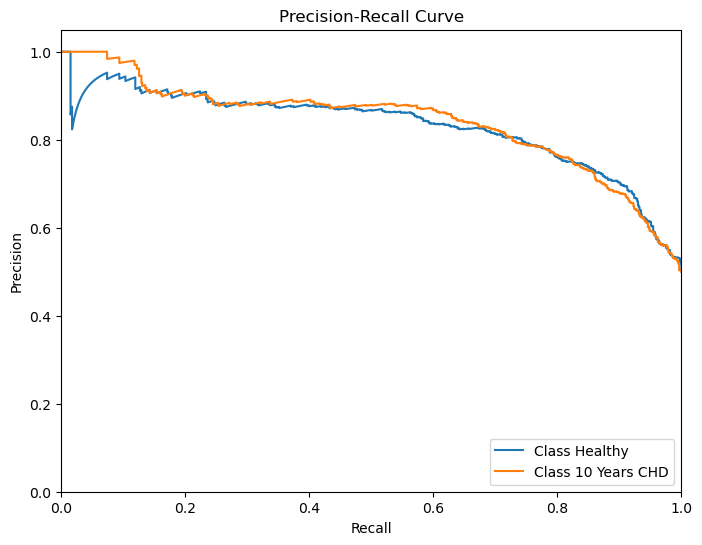

In [101]:
# Define the SVM classifier with its corresponding hyperparameters
svm_params = {
    'C': [0.1, 1, 10],
    'gamma': [0.1, 0.01, 0.001],
    'kernel': ['linear', 'rbf', 'poly']
}

svm_classifier = SVC(probability=True)

# Use the evaluate_classifier function to evaluate the SVM classifier
evaluate_classifier('SVM', svm_classifier, svm_params)

<a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Decision Tree</h3>

Classifier: Decision Tree
Best Parameters: {'max_depth': 20, 'min_samples_leaf': 1, 'min_samples_split': 2}
Accuracy: 0.76
F1 Score: 0.76
Precision: 0.76
Recall: 0.76
Kappa: 0.51
MCC: 0.51
              precision    recall  f1-score   support

     Healthy       0.77      0.73      0.75       977
10 Years CHD       0.74      0.78      0.76       977

    accuracy                           0.76      1954
   macro avg       0.76      0.76      0.76      1954
weighted avg       0.76      0.76      0.76      1954



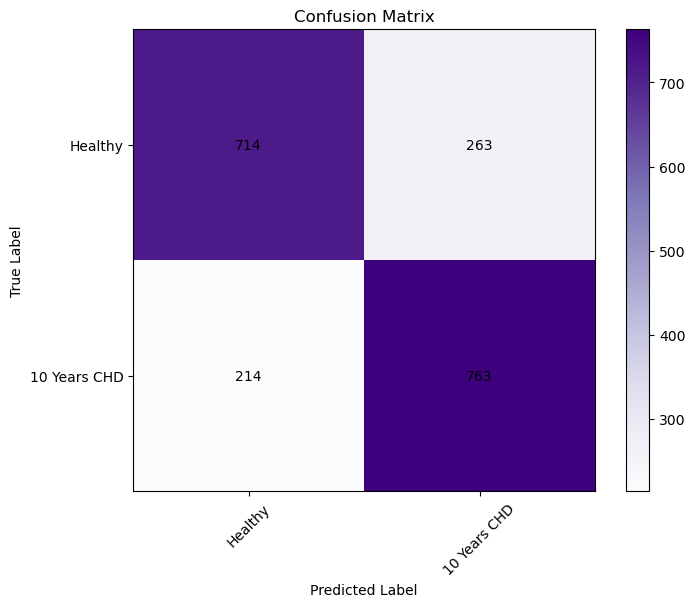

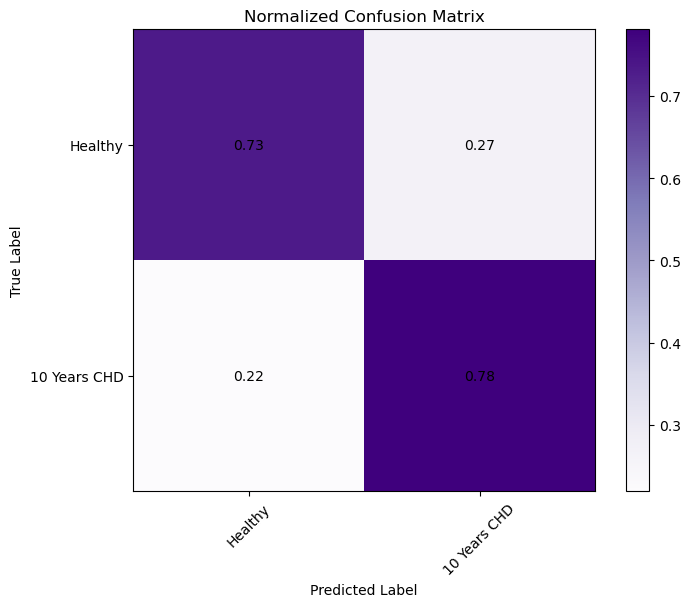

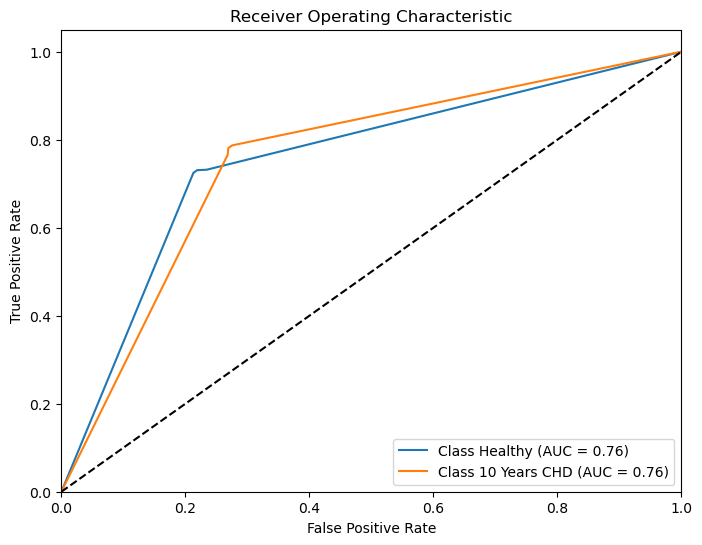

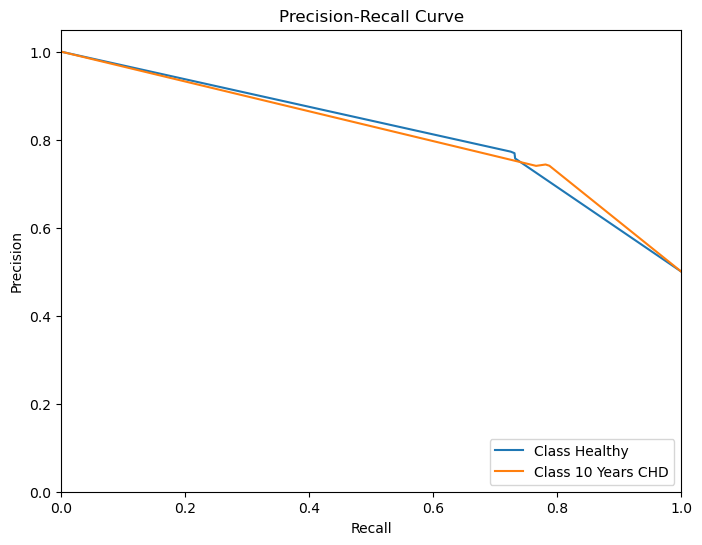

In [112]:
# Define the Decision Tree classifier with its corresponding hyperparameters
decision_tree_params = {
    'max_depth': [None, 5, 10, 20, 30],
    'min_samples_split': [2, 5, 10, 15],
    'min_samples_leaf': [1, 2, 4, 6],
}

decision_tree_classifier = DecisionTreeClassifier()

# Use the evaluate_classifier function to evaluate the Decision Tree classifier
evaluate_classifier('Decision Tree', decision_tree_classifier, decision_tree_params)

<a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Random Forest</h3>

Classifier: Random Forest
Best Parameters: {'max_depth': 20, 'min_samples_split': 2, 'n_estimators': 200}
Accuracy: 0.87
F1 Score: 0.87
Precision: 0.87
Recall: 0.87
Kappa: 0.74
MCC: 0.74
              precision    recall  f1-score   support

     Healthy       0.90      0.84      0.87       977
10 Years CHD       0.85      0.90      0.88       977

    accuracy                           0.87      1954
   macro avg       0.87      0.87      0.87      1954
weighted avg       0.87      0.87      0.87      1954



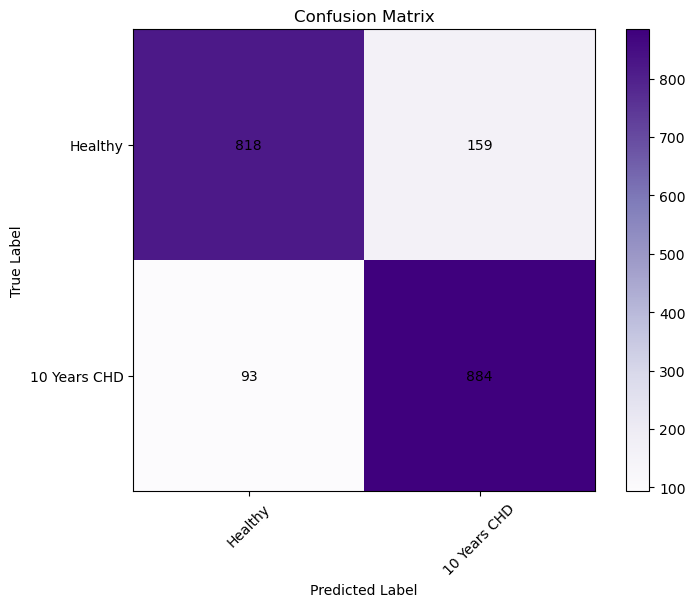

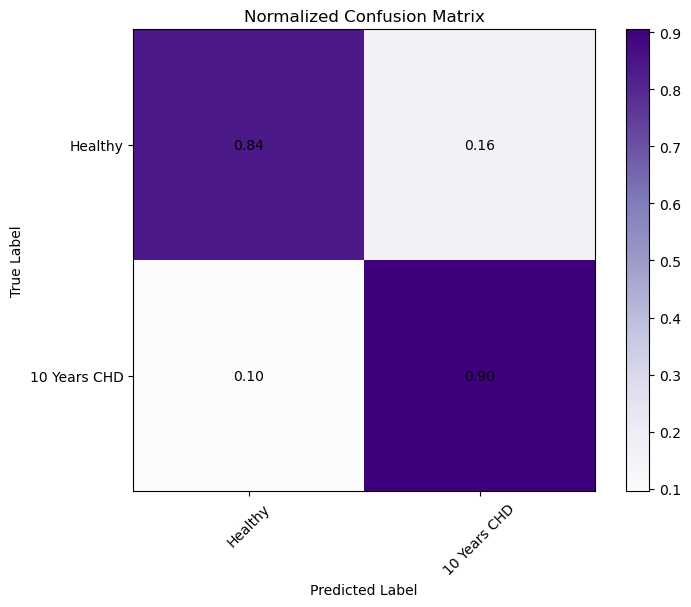

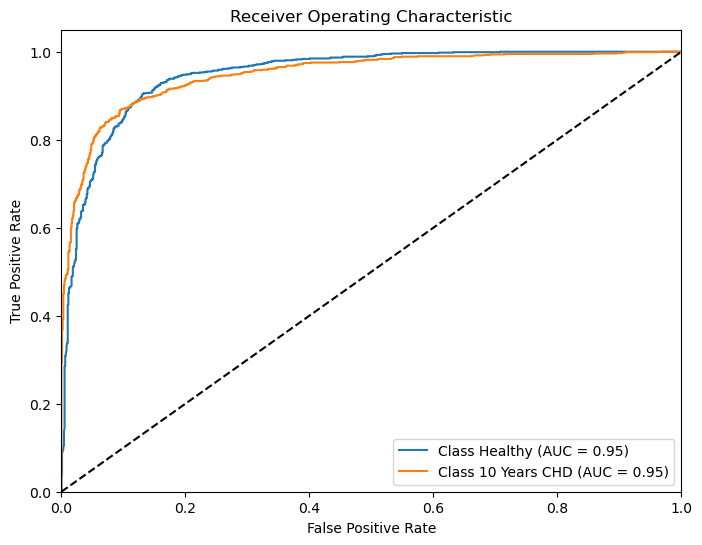

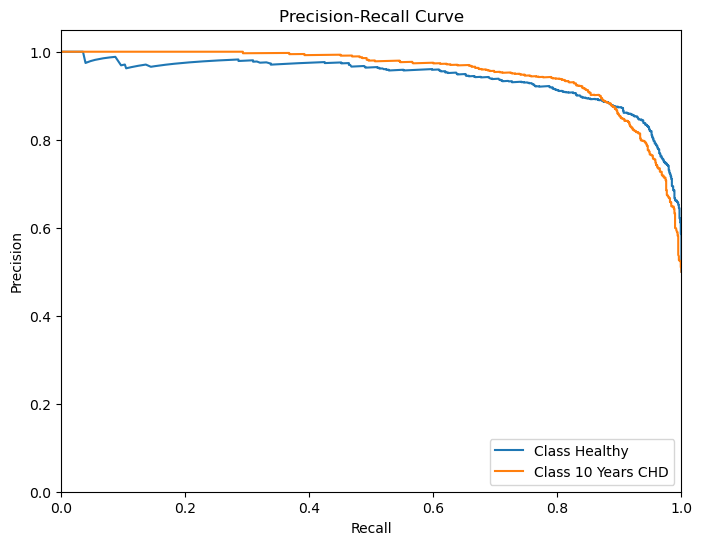

In [41]:
# Define the Random Forest classifier with its corresponding hyperparameters
random_forest_params = {
    'n_estimators': [50, 100, 200, 300],
    'max_depth': [None, 5, 10, 20, 30],
    'min_samples_split': [2, 5]
}

random_forest_classifier = RandomForestClassifier()

# Use the evaluate_classifier function to evaluate the Random Forest classifier
evaluate_classifier('Random Forest', random_forest_classifier, random_forest_params)

<a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Extra Tree Classifier</h3>

Classifier: Extra Trees
Best Parameters: {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 100}
Accuracy: 0.88
F1 Score: 0.88
Precision: 0.88
Recall: 0.88
Kappa: 0.76
MCC: 0.76
              precision    recall  f1-score   support

     Healthy       0.89      0.87      0.88       977
10 Years CHD       0.87      0.89      0.88       977

    accuracy                           0.88      1954
   macro avg       0.88      0.88      0.88      1954
weighted avg       0.88      0.88      0.88      1954



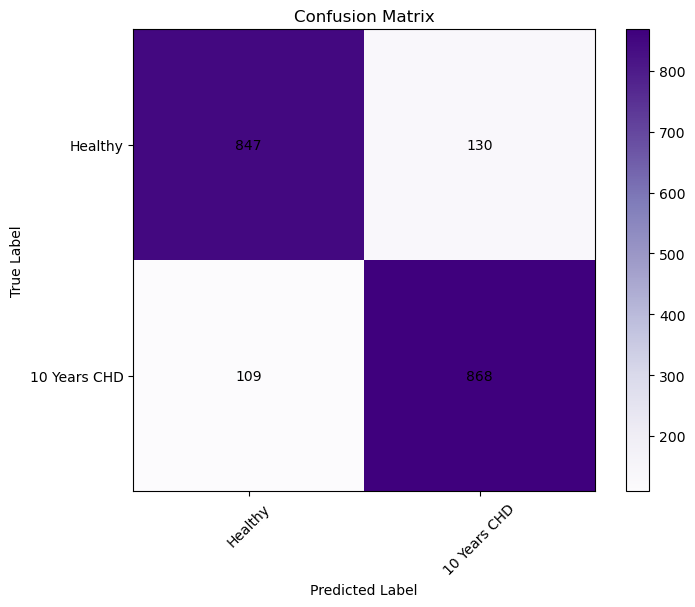

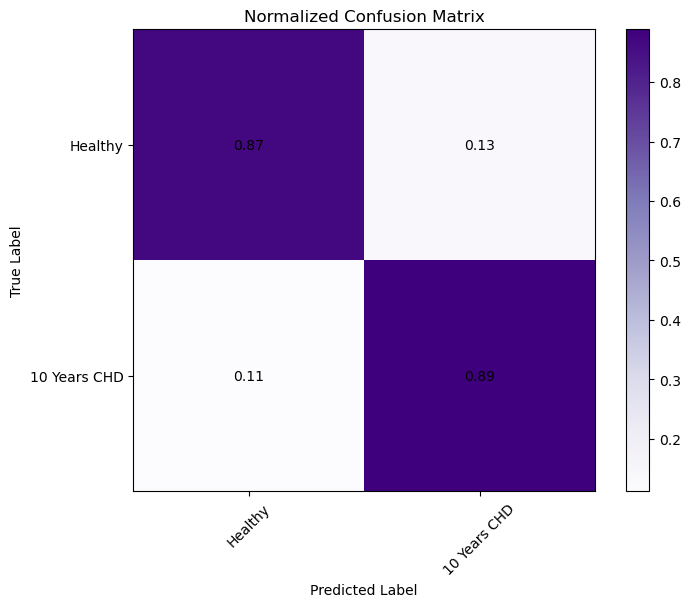

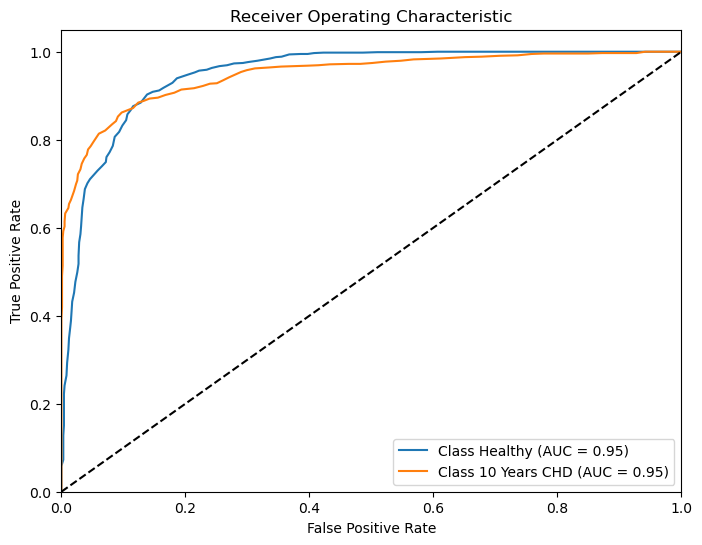

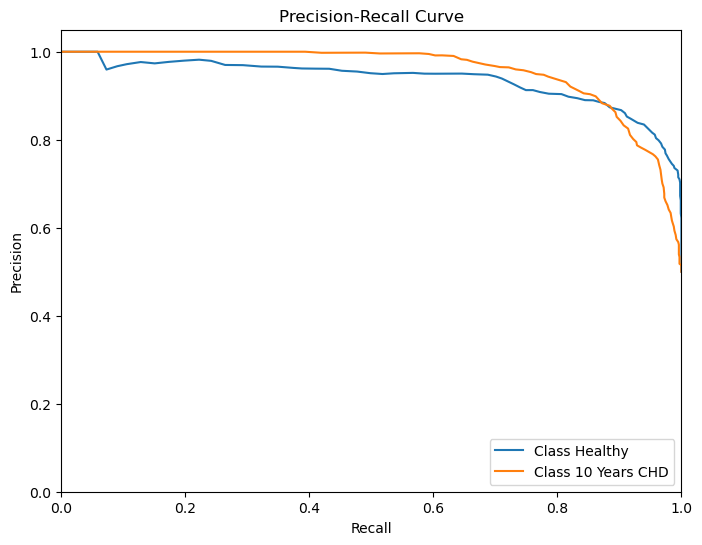

In [42]:
# Define the Extra tree classifier with its corresponding hyperparameters
extra_trees_params = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 5, 10],
    'min_samples_split': [2, 5, 10]
}

extra_trees_classifier = ExtraTreesClassifier()

# Use the evaluate_classifier function to evaluate the Extra tree classifier
evaluate_classifier('Extra Trees', extra_trees_classifier, extra_trees_params)

<a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">XGBoost</h3>

Classifier: XGBoost
Best Parameters: {'gamma': 0.1, 'learning_rate': 0.2, 'max_depth': 10, 'min_child_weight': 1, 'n_estimators': 200, 'subsample': 0.8}
Accuracy: 0.89
F1 Score: 0.89
Precision: 0.89
Recall: 0.89
Kappa: 0.78
MCC: 0.78
              precision    recall  f1-score   support

     Healthy       0.91      0.87      0.89       977
10 Years CHD       0.87      0.91      0.89       977

    accuracy                           0.89      1954
   macro avg       0.89      0.89      0.89      1954
weighted avg       0.89      0.89      0.89      1954



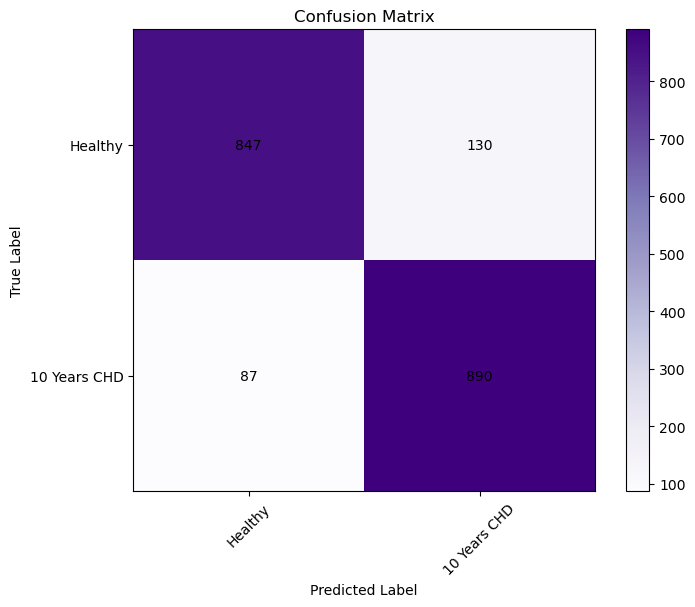

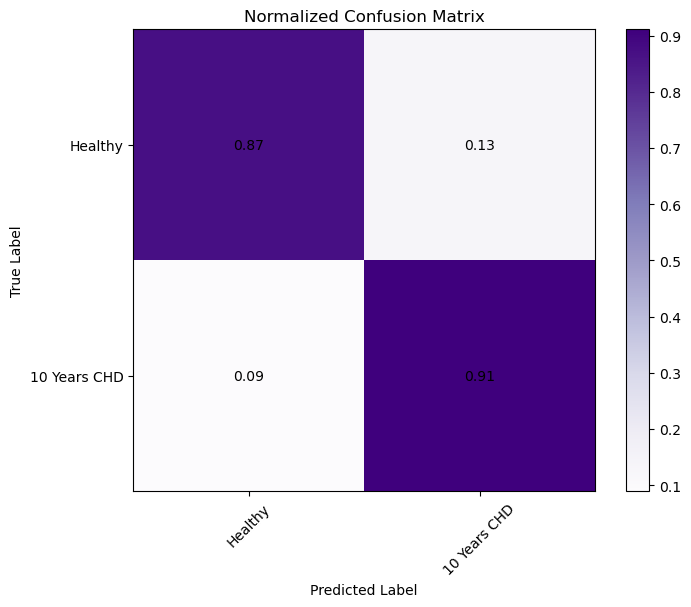

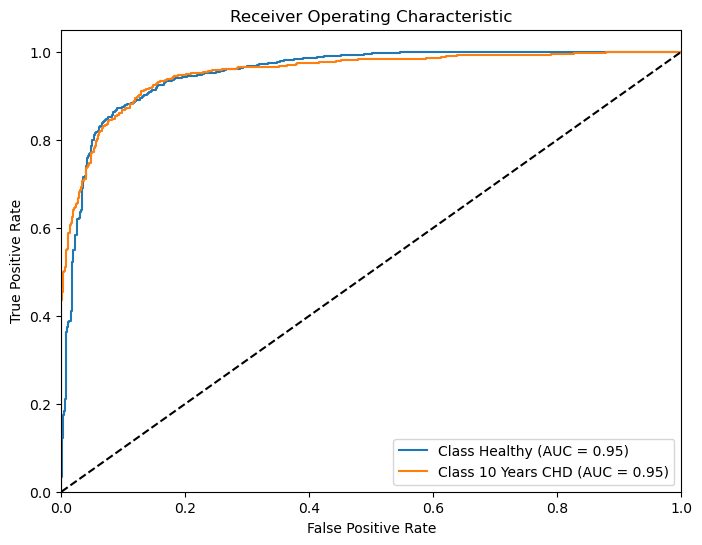

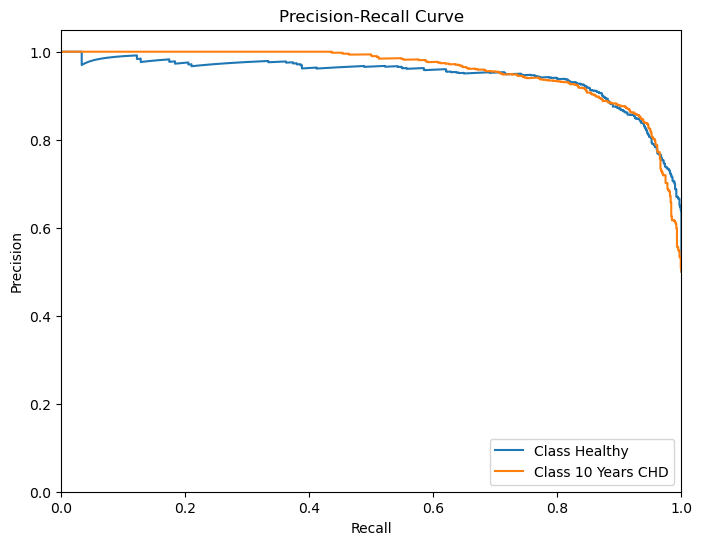

In [39]:
# Define the XGBoost classifier with its corresponding hyperparameters
xgboost_params = {
    'n_estimators': [50, 100, 200, 500],
    'max_depth': [3, 5, 7, 10],
    'learning_rate': [0.01, 0.1, 0.2],
    'min_child_weight': [1, 3],
    'subsample': [0.7, 0.8, 1],
    'gamma': [0.1, 0.2]
}

xgboost_classifier = XGBClassifier()

# Use the evaluate_classifier function to evaluate the XGBoost classifier
evaluate_classifier('XGBoost', xgboost_classifier, xgboost_params)

<a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Catboost</h3>

Classifier: CatBoost
Best Parameters: {'depth': 8, 'iterations': 300, 'learning_rate': 0.2}
Accuracy: 0.89
F1 Score: 0.89
Precision: 0.89
Recall: 0.89
Kappa: 0.77
MCC: 0.77
              precision    recall  f1-score   support

     Healthy       0.89      0.88      0.89       977
10 Years CHD       0.88      0.89      0.89       977

    accuracy                           0.89      1954
   macro avg       0.89      0.89      0.89      1954
weighted avg       0.89      0.89      0.89      1954



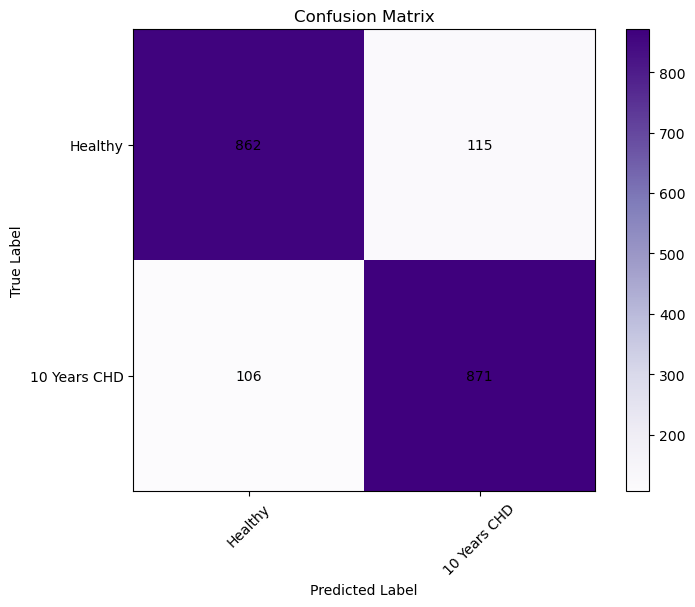

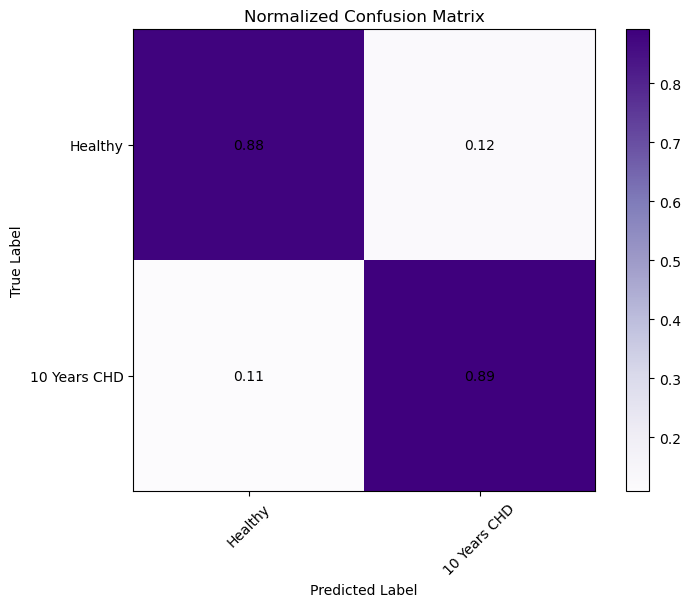

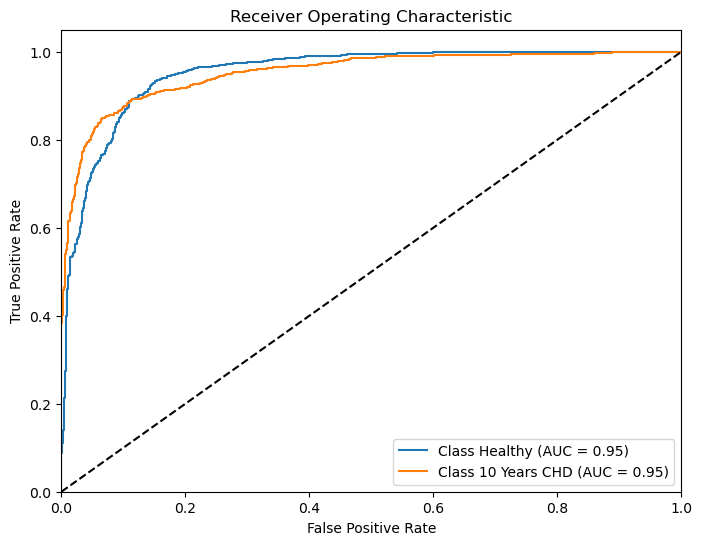

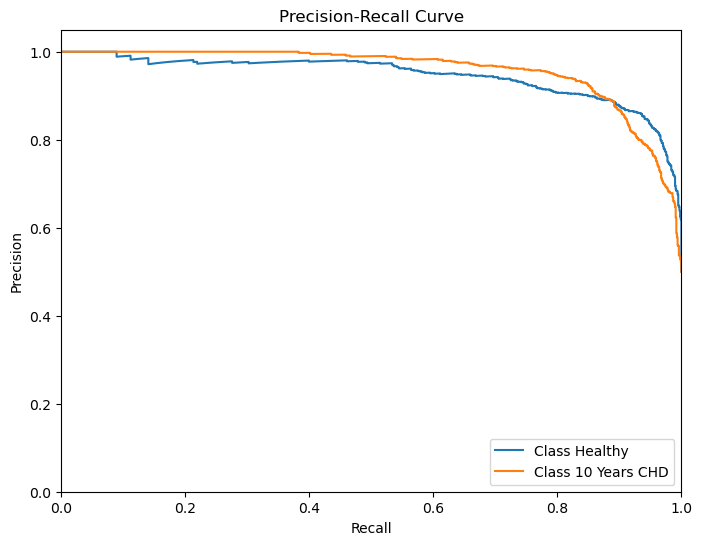

In [23]:
from catboost import CatBoostClassifier

# Define CatBoost hyperparameters
catboost_params = {
    'iterations': [100, 200, 300],
    'depth': [4, 6, 8],
    'learning_rate': [0.01, 0.1, 0.2]
}

catboost_classifier = CatBoostClassifier(verbose=0)  # Set verbose to 0 to avoid lengthy output

# Evaluate the CatBoost classifier
evaluate_classifier('CatBoost', catboost_classifier, catboost_params)

<a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Gradient Boosting</h3>

Classifier: Gradient Boosting
Best Parameters: {'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 300}
Accuracy: 0.88
F1 Score: 0.88
Precision: 0.88
Recall: 0.88
Kappa: 0.76
MCC: 0.76
              precision    recall  f1-score   support

     Healthy       0.88      0.89      0.88       977
10 Years CHD       0.89      0.88      0.88       977

    accuracy                           0.88      1954
   macro avg       0.88      0.88      0.88      1954
weighted avg       0.88      0.88      0.88      1954



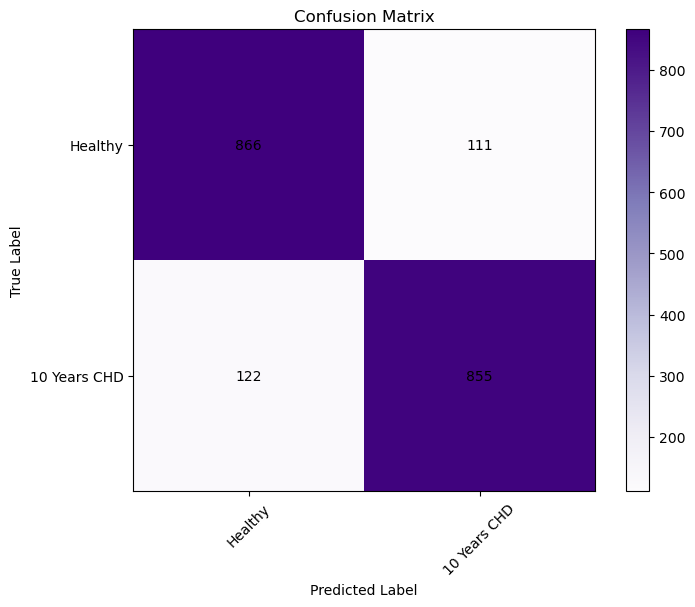

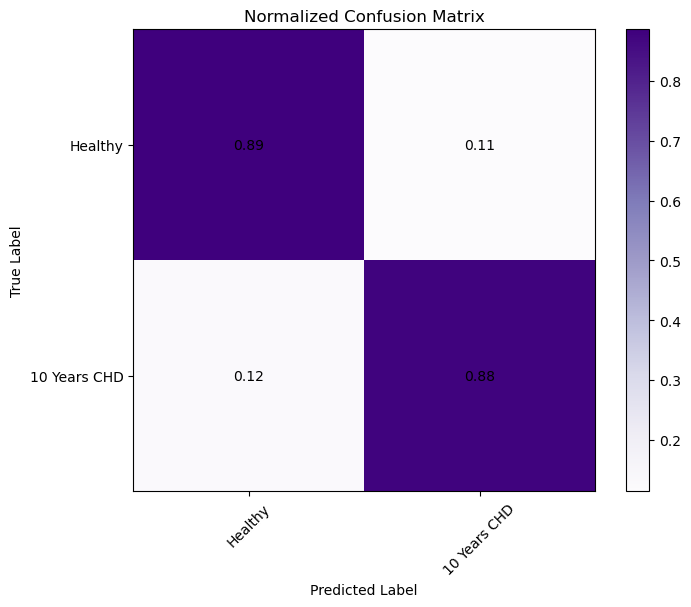

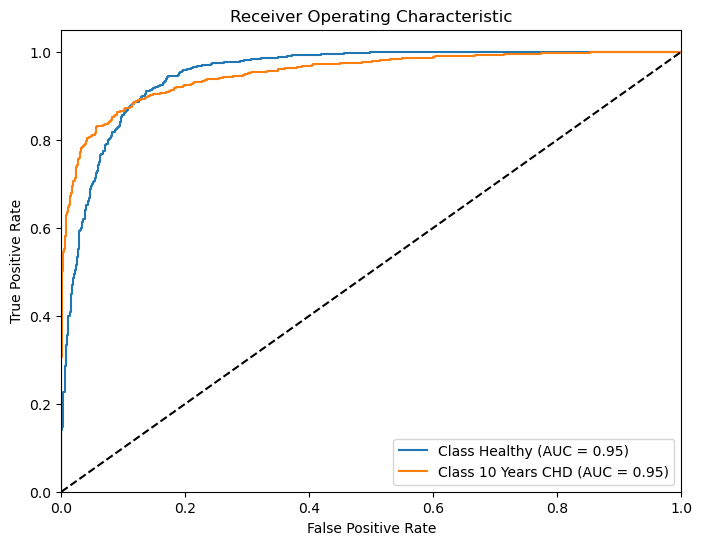

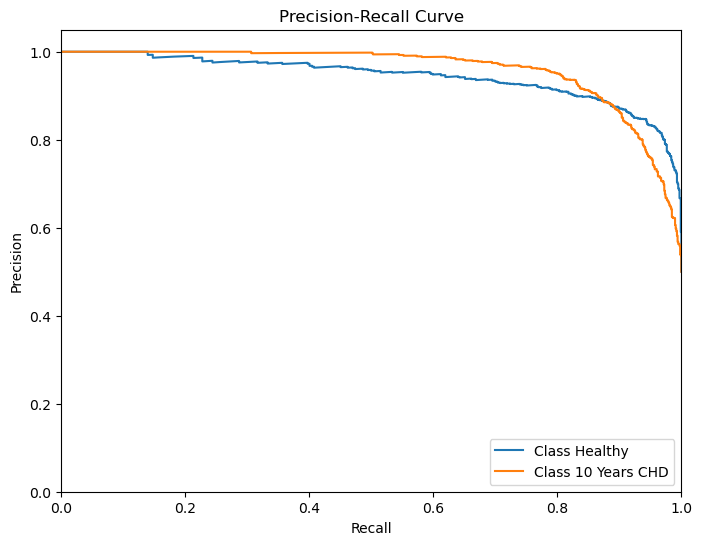

In [26]:
# Gradient Boosting hyperparameters
gb_params = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7]
}
gb_classifier = GradientBoostingClassifier()

# Evaluate Gradient Boosting Classifier
evaluate_classifier('Gradient Boosting', gb_classifier, gb_params)

<a id="2.1"></a>
<h3 style="background-color:#c5f6ef;font-family:newtimeroman;font-size:200%;text-align:center;border-radius: 15px 50px;">Models Explainers & Interpretation</h3>

The motivation of this section coming from that machine learning models are becoming increasingly complex, powerful, and able to make accurate predictions. However, as these models become "black boxes," it's even harder to understand how they arrived at those predictions. This has led to a growing focus on machine learning interpretability and explainability.

As We always say, the models we create need to be sold to business stakeholders. And if business stakeholders don't understand what we're creating, they may be less likely to back the project.

We'll use some valuable tools which help to uncover the supposed "Black Box" of our best tuned classifiers including :
- Visualizing a sample tree
- Features Importance
- SHAP
- LIME
- Permutation Importance

In [27]:
# Installing shap and lime
!pip install shap
!pip install lime
!pip install eli5

In [28]:
# Importing shap and lime
import shap
import lime
import lime.lime_tabular

<a id="2.1"></a>
<h3 style="background-color:#c5f6ef; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Tuned Random Forest Interpretation</h3>

In [29]:
# Here is our best random forest model with its Best parameters from your grid search
best_rf_params = {'max_depth': None,
                  'min_samples_split': 2,
                  'n_estimators': 100}

best_rf_model = RandomForestClassifier(**best_rf_params)
best_rf_model.fit(x_train, y_train)

RandomForestClassifier()

<a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Visualizing a sample tree</h3>

Since visualizing individual trees can be complex in ensemble models like Random Forest and Extra Trees because they consist of many trees. However, examining a few trees can give us some insights into the decision-making process.

Let's startby visualizing some layers from a sample tree

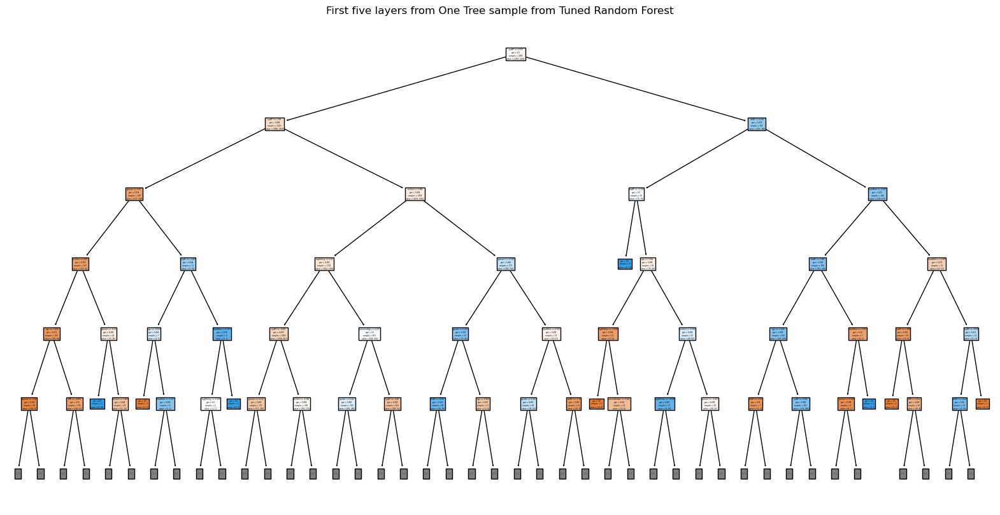

In [38]:
from sklearn.tree import plot_tree

# Random Forest: Visualize one tree
rf_single_tree = best_rf_model.estimators_[0]

# Convert column names to a list
feature_names_list = x_train.columns.tolist()

plt.figure(figsize=(20, 10))
plot_tree(rf_single_tree, filled=True, feature_names=feature_names_list, max_depth=5)
plt.title('First five layers from One Tree sample from Tuned Random Forest')
plt.show()

<a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Features Importance</h3>

Feature importance refers to techniques that calculate a score for all the input features for a given model. 

**The scores represent the “importance” of each feature. A higher score means that the specific feature will have a larger effect on the model that is being used to predict a certain variable.**

In [30]:
def rf_feat_importance(m, df):
    return pd.DataFrame({'Feature':df.columns, 'Importance':m.feature_importances_}).sort_values('Importance', ascending=False)


fi = rf_feat_importance(best_rf_model, x_train)
fi[:8].style.background_gradient(cmap='Purples')

,Feature,Importance
0,age,0.155036
8,sysBP,0.147792
9,diaBP,0.119515
7,totChol,0.118230
10,BMI,0.112575
12,glucose,0.103151
11,heartRate,0.100414
2,cigsPerDay,0.079403


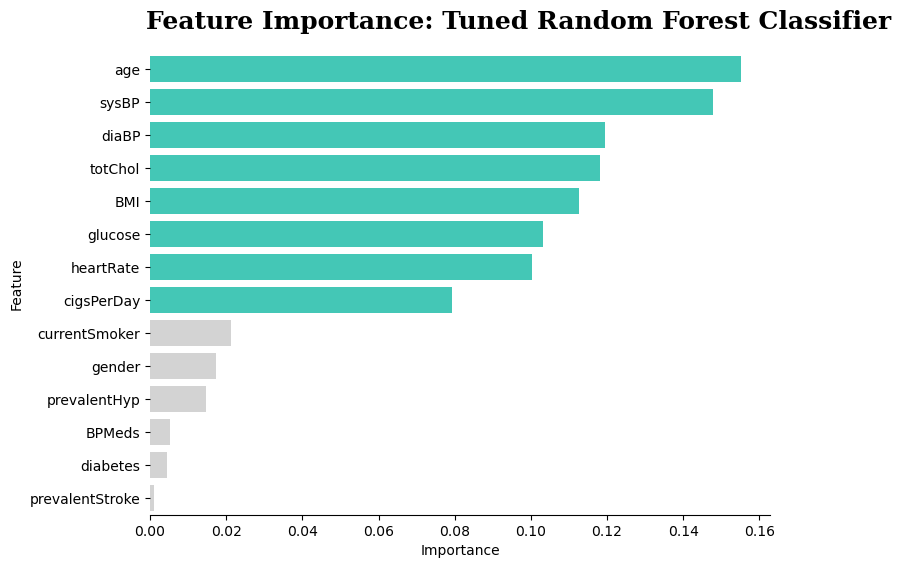

In [31]:
fig, ax = plt.subplots(1,1, figsize=(8, 6))

color_map = ['lightgray' for _ in range(14)]
color_map[0] = color_map[1] = color_map[2] = color_map[3] = color_map[4] = color_map[5] = color_map[6] = color_map[7] = '#2eddc6' # color highlight

sns.barplot(data=fi,x='Importance',y='Feature',ax=ax,palette=color_map)

for s in ['top', 'left', 'right']:
    ax.spines[s].set_visible(False)
    
fig.text(0.12,0.92,"Feature Importance: Tuned Random Forest Classifier", fontsize=18, fontweight='bold', fontfamily='serif')

plt.show()

It is always interesting to view what features a predictive model utilises the most, that is, what features are the most important. 

This not only helps understand how the model works, but importantly can help us to explain the model results.

In this case, we see that Age, Systolic and Diastolic Blood Pressure, Serum Total Cholesterol, Casual serum Glucose Level,
BMI, Heart rate and Cigarettes per day are the most important factors for our model.

<a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">SHAP</h3>

SHAP Values (SHapley Additive exPlanations) break down a prediction to show the impact of each feature.

It interprets the impact of having a certain value for a given feature in comparison to the prediction we'd make if that feature took some baseline value (e.g. zero).

SHAP values show how each feature affects each final prediction, the significance of each feature compared to others, and the model's reliance on the interaction between features.

They are based on game theory and assign an importance value to each feature in a model. Features with positive SHAP values positively impact the prediction, while those with negative values have a negative impact. The magnitude is a measure of how strong the effect is.

SHAP values are model-agnostic, meaning they can be used to interpret any machine learning model, including:
- Linear regression
- Decision trees
- Random forests
- Gradient boosting models...etc

In [28]:
explainer = shap.TreeExplainer(best_rf_model)

# calculate shap values. This is what we will plot.
shap_values = explainer.shap_values(x_test)

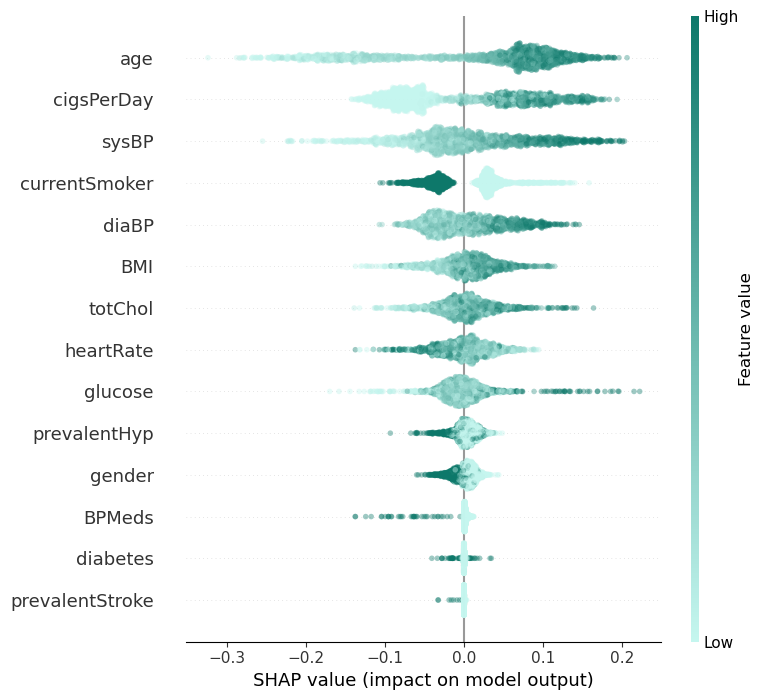

In [31]:
# custom colour plot
colors = ["#c5f6ef", "#0d786a"]           
cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", colors)
shap.summary_plot(shap_values[1], x_test,cmap=cmap,alpha=0.4)

The plot above shows the effect of each data point on our predictions.

For example, for age, the top left point reduced the prediction by about 0.3.

The color shows whether that feature was high or low for that row of the dataset Horizontal location shows whether the effect of that value caused a higher or lower prediction.

In [29]:
def create_shap_plot(feature, title):
    """
    Create a SHAP dependence plot for the specified feature, using original values.

    Parameters:
    feature (str): The feature for which to create the SHAP plot.
    title (str): Title of the plot.
    """
    # Inverse transform the data to get original feature values
    x_test_original = pipeline.named_transformers_['scaler'].inverse_transform(x_test)

    # Find the index of the feature
    feature_index = list(x_test.columns).index(feature)

    # Replace the scaled feature in x_test with its original values
    x_test_shap = x_test.copy()
    x_test_shap.iloc[:, feature_index] = x_test_original[:, feature_index]

    # Create the SHAP plot
    plt.figure(figsize=(20, 10))
    shap.dependence_plot(feature, shap_values[1], x_test_shap, interaction_index=feature, cmap=cmap, alpha=0.6, show=False)
    plt.title(title, loc='left', fontfamily='serif', fontsize=15)
    plt.ylabel(f"SHAP value for the '{feature}' feature")
    plt.show()

<Figure size 2000x1000 with 0 Axes>

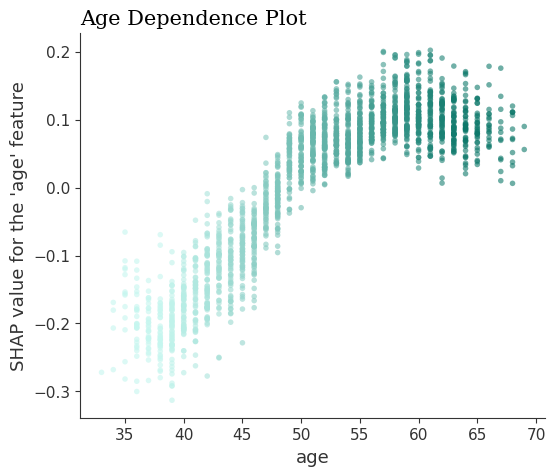

In [215]:
create_shap_plot('age', 'Age Dependence Plot')

<Figure size 2000x1000 with 0 Axes>

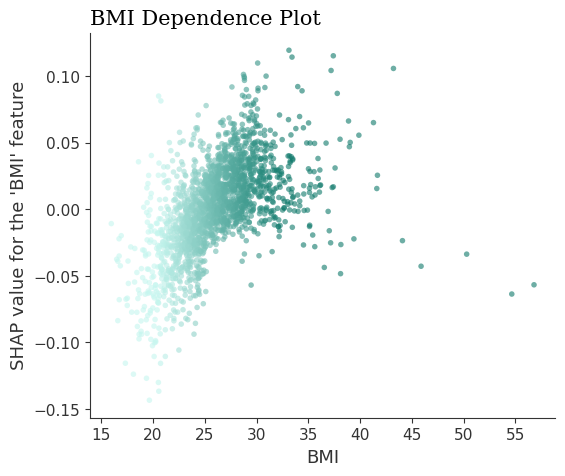

In [216]:
create_shap_plot('BMI', 'BMI Dependence Plot')

<Figure size 2000x1000 with 0 Axes>

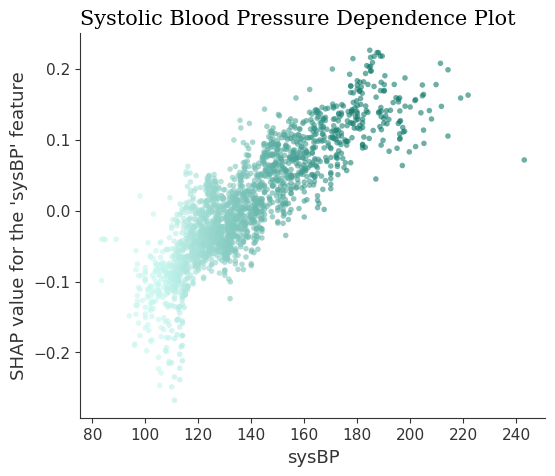

In [217]:
create_shap_plot('sysBP', 'Systolic Blood Pressure Dependence Plot')

<Figure size 2000x1000 with 0 Axes>

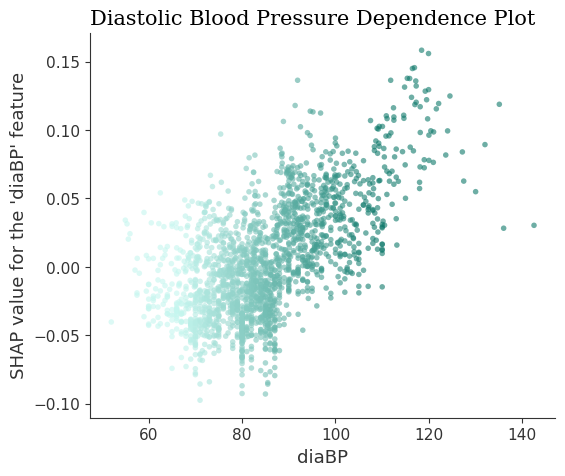

In [218]:
create_shap_plot('diaBP', 'Diastolic Blood Pressure Dependence Plot')

<Figure size 2000x1000 with 0 Axes>

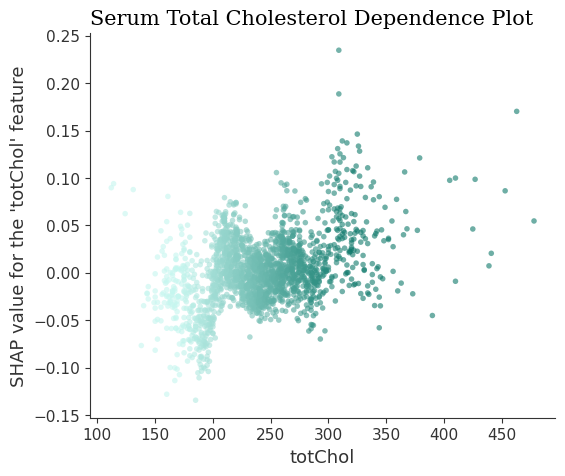

In [219]:
create_shap_plot('totChol', 'Serum Total Cholesterol Dependence Plot')

<Figure size 2000x1000 with 0 Axes>

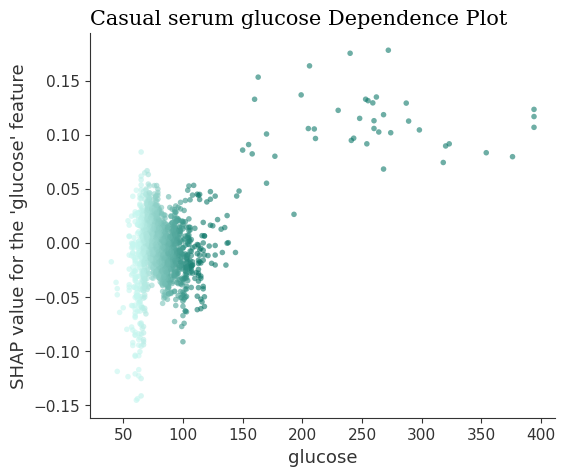

In [220]:
create_shap_plot('glucose', 'Casual serum glucose Dependence Plot')

<Figure size 2000x1000 with 0 Axes>

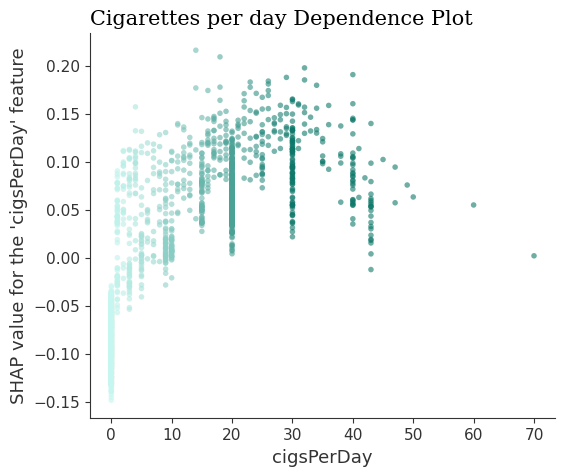

In [221]:
create_shap_plot('cigsPerDay', 'Cigarettes per day Dependence Plot')

<a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">LIME</h3>

LIME, the acronym for local interpretable model-agnostic explanations, is a technique that approximates any black box machine learning model with a local, interpretable model to explain each individual prediction.

### LIME Algorithm Steps:
- Choose the ML model and a reference point to be explained
- Generate points all over the ℝᵖ space
(sample X values from a Normal distribution inferred from the training set)
- Predict the Y coordinate of the sampled points, using the ML model
(the generated points are guaranteed to perfectly lie on the ML surface)
- Assign weights based on the closeness to the chosen point
(use RBF Kernel, it assigns higher weights to points closer to the reference)
- Train Linear Ridge Regression on the generated weighted dataset:
E(Y)= β₀ + ∑ βⱼ Xⱼ. The β coefficients are regarded as LIME explanation.

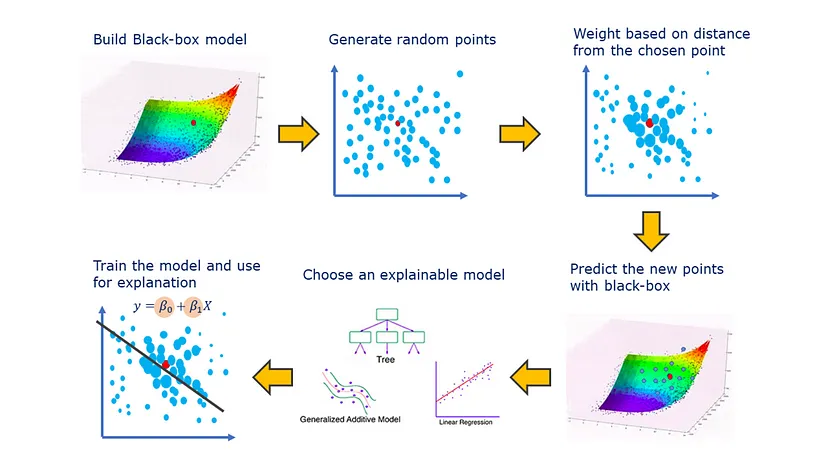

In [182]:
x_train_values = x_train.values if isinstance(x_train, pd.DataFrame) else x_train

# Initialize a LIME explainer object
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=x_train_values, 
    feature_names=x_train.columns.tolist(), 
    class_names=['Healthy', 'CHD'],
    mode='classification'
)

In [195]:
i = 20  # index of the instance to be explained
instance = x_test.values[i] if isinstance(x_test, pd.DataFrame) else x_test[i]

# Generate an explanation for the selected instance
exp = explainer.explain_instance(instance, best_rf_model.predict_proba, num_features=8)
exp.show_in_notebook(show_table=True)

C:\Users\user\anaconda5\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names


<a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Permutation Importance</h3>

Permutation importance is one of the most reliable ways to see the important features in a model.

Its advantages:
1. Works on any model structure
2. Easy to interpret and implement
3. Consistent and reliable

Permutation importance of a feature is defined as the change in model performance when that feature is randomly shuffled.

PI is available through different packages including sklearn and eli5.

The show_weights function displays the features that hurt the model’s performance the most after being shuffled — i.e. the most important features.

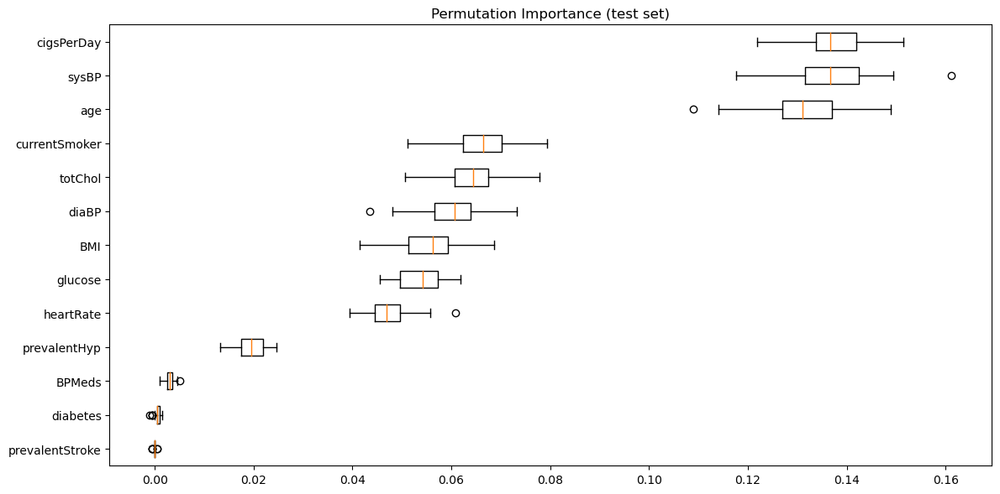

In [64]:
from sklearn.inspection import permutation_importance

result = permutation_importance(best_rf_model, x_test, y_test, n_repeats=50, random_state=42)
perm_sorted_idx = result.importances_mean.argsort()

plt.figure(figsize=(12, 6))
plt.boxplot(result.importances[perm_sorted_idx].T, vert=False, labels=x_test.columns[perm_sorted_idx])
plt.title("Permutation Importance (test set)")
plt.tight_layout()
plt.show()

<a id="2.1"></a>
<h3 style="background-color:#c5f6ef; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Tuned Extra Tree Interpretation</h3>

In [32]:
# Here is our best Extra tree model with its Best parameters from your grid search
best_et_params = {'max_depth': None,
                  'min_samples_split': 2,
                  'n_estimators': 200}

best_et_model = ExtraTreesClassifier(**best_et_params)
best_et_model.fit(x_train, y_train)

ExtraTreesClassifier(n_estimators=200)

<a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Visualizing a sample tree</h3>

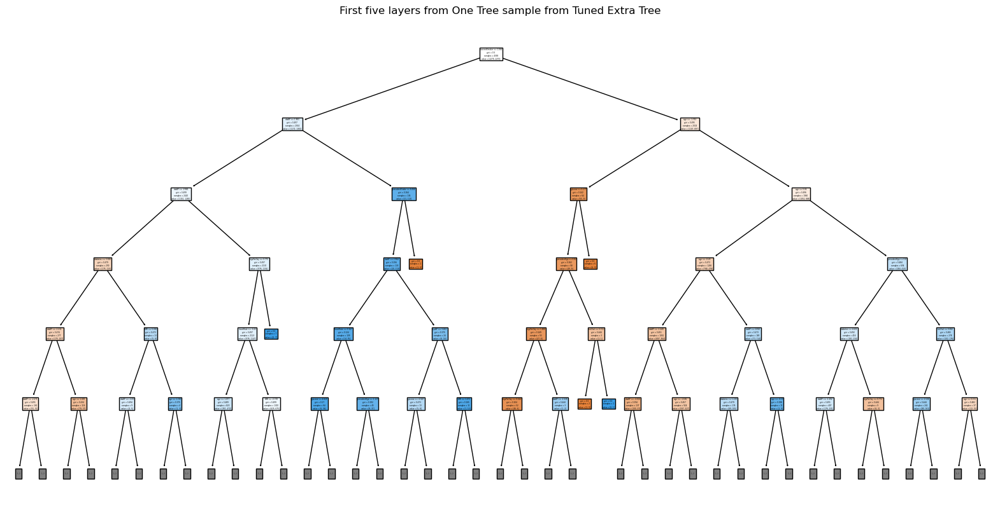

In [162]:
# Random Forest: Visualize one tree
et_single_tree = best_et_model.estimators_[0]

# Convert column names to a list
feature_names_list = x_train.columns.tolist()

plt.figure(figsize=(20, 10))
plot_tree(et_single_tree, filled=True, feature_names=feature_names_list, max_depth=5)
plt.title('First five layers from One Tree sample from Tuned Extra Tree')
plt.show()

<a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Features Importance</h3>

In [33]:
def et_feat_importance(m, df):
    return pd.DataFrame({'Feature':df.columns, 'Importance':m.feature_importances_}).sort_values('Importance', ascending=False)


fi = et_feat_importance(best_et_model, x_train)
fi[:8].style.background_gradient(cmap='Purples')

,Feature,Importance
0,age,0.160460
8,sysBP,0.132885
7,totChol,0.114802
9,diaBP,0.108877
10,BMI,0.103678
11,heartRate,0.103263
12,glucose,0.102769
2,cigsPerDay,0.097855


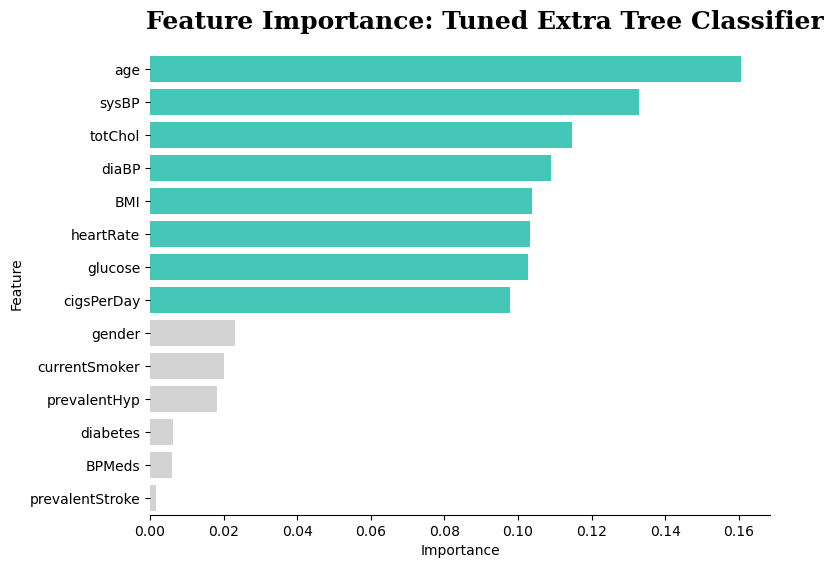

In [34]:
fig, ax = plt.subplots(1,1, figsize=(8, 6))

color_map = ['lightgray' for _ in range(14)]
color_map[0] = color_map[1] = color_map[2] = color_map[3] = color_map[4] = color_map[5] = color_map[6] = color_map[7] = '#2eddc6' # color highlight

sns.barplot(data=fi,x='Importance',y='Feature',ax=ax,palette=color_map)
for s in ['top', 'left', 'right']:
    ax.spines[s].set_visible(False)
    
fig.text(0.12,0.92,"Feature Importance: Tuned Extra Tree Classifier", fontsize=18, fontweight='bold', fontfamily='serif')

plt.show()

<a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">SHAP</h3>

In [222]:
explainer = shap.TreeExplainer(best_et_model)

# calculate shap values. This is what we will plot.
shap_values = explainer.shap_values(x_test)

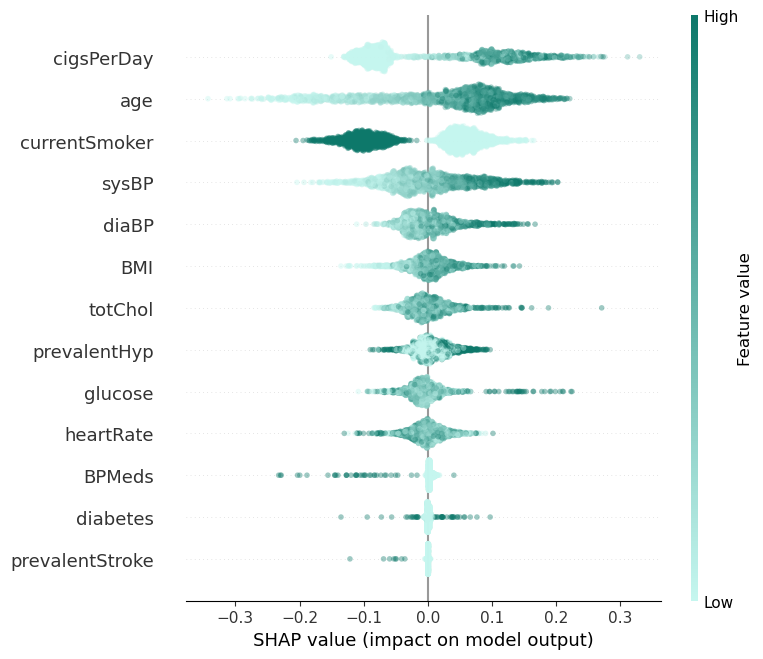

In [223]:
shap.summary_plot(shap_values[1], x_test,cmap=cmap,alpha=0.4)

<Figure size 2000x1000 with 0 Axes>

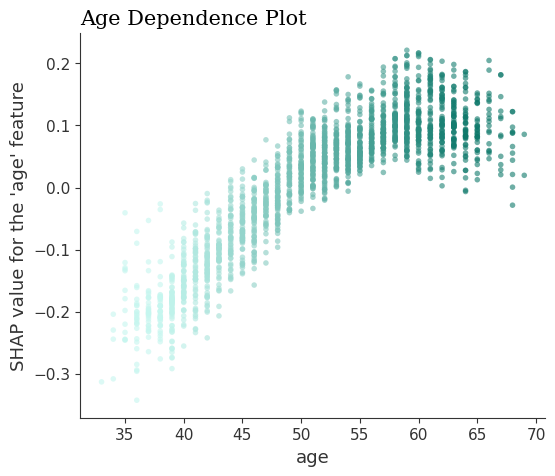

In [224]:
create_shap_plot('age', 'Age Dependence Plot')

<Figure size 2000x1000 with 0 Axes>

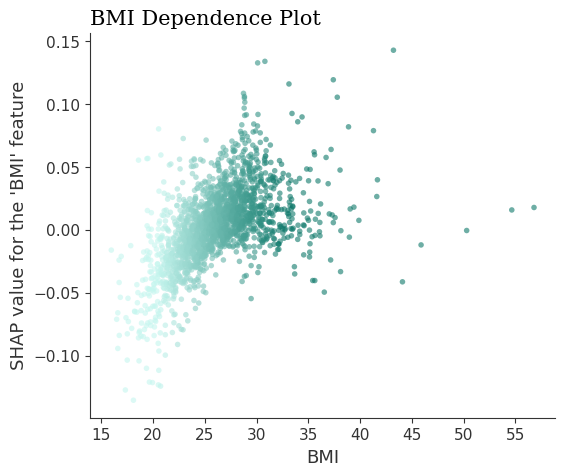

In [225]:
create_shap_plot('BMI', 'BMI Dependence Plot')

<Figure size 2000x1000 with 0 Axes>

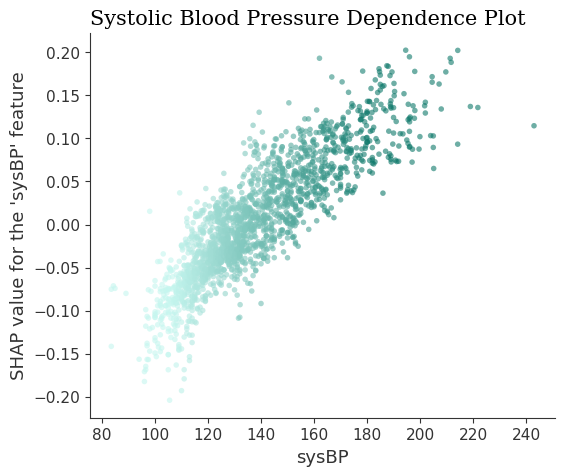

In [226]:
create_shap_plot('sysBP', 'Systolic Blood Pressure Dependence Plot')

<Figure size 2000x1000 with 0 Axes>

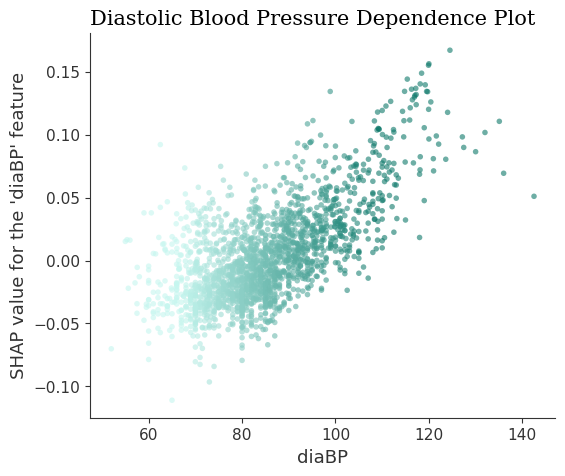

In [227]:
create_shap_plot('diaBP', 'Diastolic Blood Pressure Dependence Plot')

<Figure size 2000x1000 with 0 Axes>

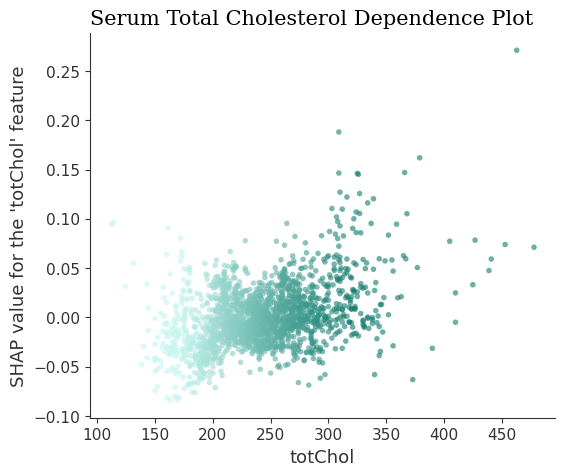

In [228]:
create_shap_plot('totChol', 'Serum Total Cholesterol Dependence Plot')

<Figure size 2000x1000 with 0 Axes>

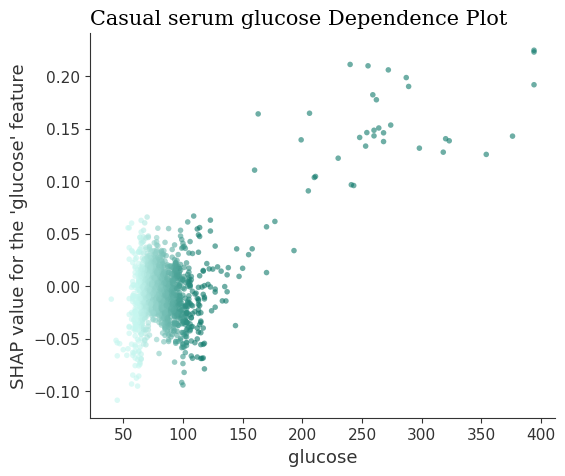

In [229]:
create_shap_plot('glucose', 'Casual serum glucose Dependence Plot')

<Figure size 2000x1000 with 0 Axes>

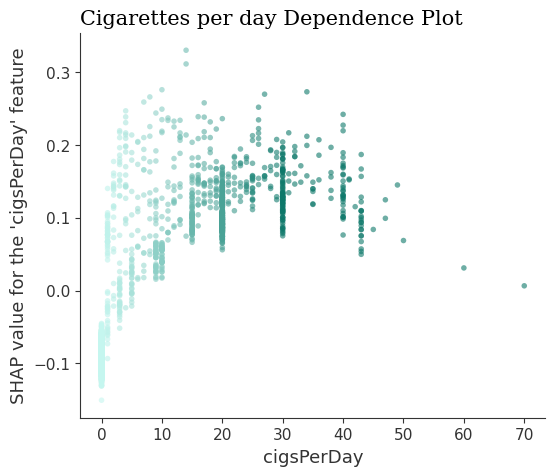

In [230]:
create_shap_plot('cigsPerDay', 'Cigarettes per day Dependence Plot')

<a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">LIME</h3>

In [193]:
i = 80  # index of the instance to be explained
instance = x_test.values[i] if isinstance(x_test, pd.DataFrame) else x_test[i]

# Generate an explanation for the selected instance
exp = explainer.explain_instance(instance, best_et_model.predict_proba, num_features=8)
exp.show_in_notebook(show_table=True)

C:\Users\user\anaconda5\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but ExtraTreesClassifier was fitted with feature names


<a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Permutation Importance</h3>

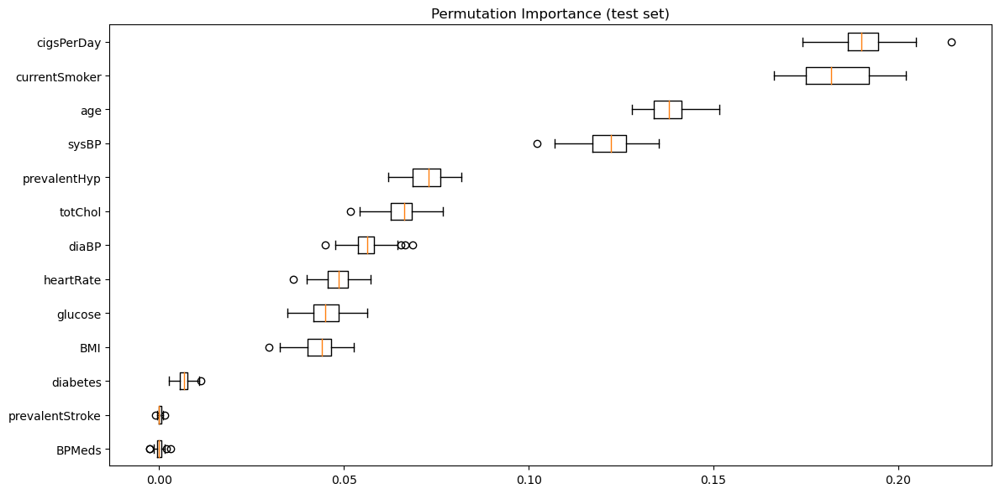

In [159]:
result = permutation_importance(best_et_model, x_test, y_test, n_repeats=50, random_state=21)
perm_sorted_idx = result.importances_mean.argsort()

plt.figure(figsize=(12, 6))
plt.boxplot(result.importances[perm_sorted_idx].T, vert=False, labels=x_test.columns[perm_sorted_idx])
plt.title("Permutation Importance (test set)")
plt.tight_layout()
plt.show()

<a id="2.1"></a>
<h3 style="background-color:#c5f6ef; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Tuned XGBoost Interpretation</h3>

In [35]:
# Here is our best XGBoost model with its Best parameters from your grid search
best_XGB_params = {'gamma': 0.1,
                   'learning_rate': 0.1,
                   'max_depth': 10,
                   'min_child_weight': 1,
                   'n_estimators': 200,
                   'subsample': 0.7}

best_XGB_model = XGBClassifier(**best_XGB_params)
best_XGB_model.fit(x_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.1, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=10, max_leaves=None,
              min_child_weight=1, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=200, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

<a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Features Importance</h3>

In [36]:
def et_feat_importance(m, df):
    return pd.DataFrame({'Feature':df.columns, 'Importance':m.feature_importances_}).sort_values('Importance', ascending=False)


fi = et_feat_importance(best_XGB_model, x_train)
fi[:8].style.background_gradient(cmap='Purples')

,Feature,Importance
1,currentSmoker,0.197601
2,cigsPerDay,0.097682
0,age,0.084601
3,BPMeds,0.074708
6,diabetes,0.074484
4,prevalentStroke,0.074090
5,prevalentHyp,0.063217
8,sysBP,0.053332


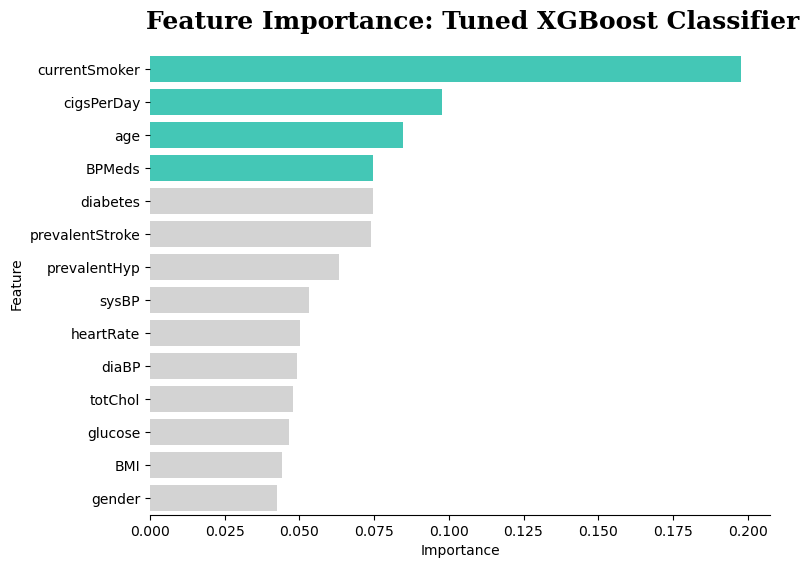

In [37]:
fig, ax = plt.subplots(1,1, figsize=(8, 6))

color_map = ['lightgray' for _ in range(14)]
color_map[0] = color_map[1] = color_map[2] = color_map[3] = '#2eddc6' # color highlight

sns.barplot(data=fi,x='Importance',y='Feature',ax=ax,palette=color_map)
for s in ['top', 'left', 'right']:
    ax.spines[s].set_visible(False)
    
fig.text(0.12,0.92,"Feature Importance: Tuned XGBoost Classifier", fontsize=18, fontweight='bold', fontfamily='serif')

plt.show()

<a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">LIME</h3>

In [192]:
i = 80  # index of the instance to be explained
instance = x_test.values[i] if isinstance(x_test, pd.DataFrame) else x_test[i]

# Generate an explanation for the selected instance
exp = explainer.explain_instance(instance, best_XGB_model.predict_proba, num_features=8)
exp.show_in_notebook(show_table=True)

<a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Permutation Importance</h3>

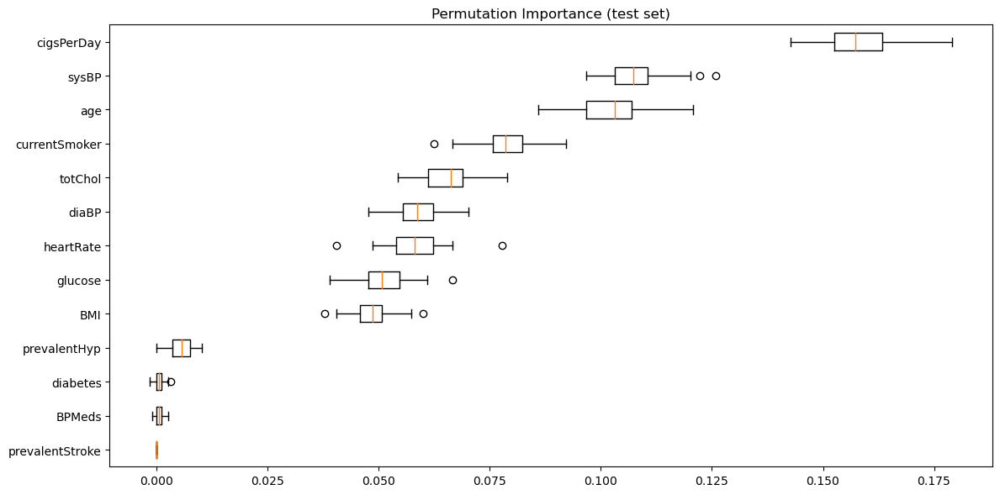

In [179]:
result = permutation_importance(best_XGB_model, x_test, y_test, n_repeats=50, random_state=21)
perm_sorted_idx = result.importances_mean.argsort()

plt.figure(figsize=(12, 6))
plt.boxplot(result.importances[perm_sorted_idx].T, vert=False, labels=x_test.columns[perm_sorted_idx])
plt.title("Permutation Importance (test set)")
plt.tight_layout()
plt.show()

<a id="2.1"></a>
<h3 style="background-color:#c5f6ef; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Tuned Catboost Interpretation</h3>

In [38]:
# Here is our best Catboost model with its Best parameters from your grid search
best_cb_params = {'depth': 8,
                  'iterations': 300,
                  'learning_rate': 0.2}

best_cb_model = CatBoostClassifier(**best_cb_params)
best_cb_model.fit(x_train, y_train)

0:	learn: 0.6360657	total: 4.69ms	remaining: 1.4s
1:	learn: 0.6025909	total: 9.44ms	remaining: 1.41s
2:	learn: 0.5795361	total: 13.5ms	remaining: 1.33s
3:	learn: 0.5647420	total: 17.5ms	remaining: 1.29s
4:	learn: 0.5499696	total: 21.2ms	remaining: 1.25s
5:	learn: 0.5386418	total: 25.6ms	remaining: 1.25s
6:	learn: 0.5294081	total: 29.5ms	remaining: 1.23s
7:	learn: 0.5155454	total: 33.1ms	remaining: 1.21s
8:	learn: 0.5091606	total: 36.9ms	remaining: 1.19s
9:	learn: 0.4933351	total: 40.9ms	remaining: 1.19s
10:	learn: 0.4858199	total: 45.1ms	remaining: 1.18s
11:	learn: 0.4768633	total: 49.1ms	remaining: 1.18s
12:	learn: 0.4664868	total: 52.8ms	remaining: 1.17s
13:	learn: 0.4604580	total: 56.3ms	remaining: 1.15s
14:	learn: 0.4539352	total: 60ms	remaining: 1.14s
15:	learn: 0.4444659	total: 63.7ms	remaining: 1.13s
16:	learn: 0.4386527	total: 67.5ms	remaining: 1.12s
17:	learn: 0.4354428	total: 71.2ms	remaining: 1.11s
18:	learn: 0.4281242	total: 75.6ms	remaining: 1.12s
19:	learn: 0.4219317	tota

<a id="2.1"></a>
<h3 style="background-color:#c5f6ef; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Tuned Gradient Boosting Interpretation</h3>

In [39]:
# Here is our best Gradient Boosting model with its Best parameters from your grid search
best_gb_params = {'learning_rate': 0.2,
                  'max_depth': 7,
                  'n_estimators': 300}

best_gb_model = GradientBoostingClassifier(**best_gb_params)
best_gb_model.fit(x_train, y_train)

GradientBoostingClassifier(learning_rate=0.2, max_depth=7, n_estimators=300)

<a id="2.1"></a>
<h3 style="background-color:#c5f6ef;font-family:newtimeroman;font-size:200%;text-align:center;border-radius: 15px 50px;">Ensemble Learning</h3>

Combining multiple classifiers to improve performance is a common technique in machine learning known as ensemble learning. There are several ways we do this, but the most common and straightforward methods are Voting and Stacking which we will use.

Let's first define the best tuned 3 classifiers we got :
- Random Forest
- Extra Trees
- XGBoost

Each classifier of them has been defined earlier with its optimal paramaters we got using Gridsearch

<a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Voting</h3>

We will apply **Soft Voting** using our best 3 models (Random Forest, Extra Trees, XGBoost). predictions from the three models are combined to make a final prediction.

Since we will use soft voting so the predictions are the probabilities for each class, and the final output prediction is based on the averaged probabilities.

In [196]:
# Create a Voting Classifier
voting_clf = VotingClassifier(
    estimators=[('rf', best_rf_model), ('et', best_et_model), ('XGB', best_XGB_model)],
    voting='soft'
)

# Fit the voting classifier on the training data and evaluate it
voting_clf.fit(x_train, y_train)
# Predict on the test set
y_pred = voting_clf.predict(x_test)
y_prob = voting_clf.predict_proba(x_test)

Voting Classifier : Random Forest + Extra Trees + XGBoost soft voting
Accuracy: 0.89
F1 Score: 0.89
Precision: 0.89
Recall: 0.89


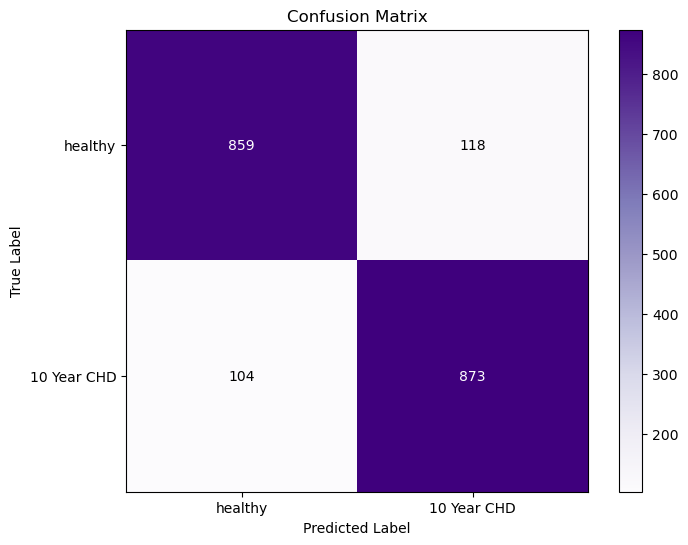

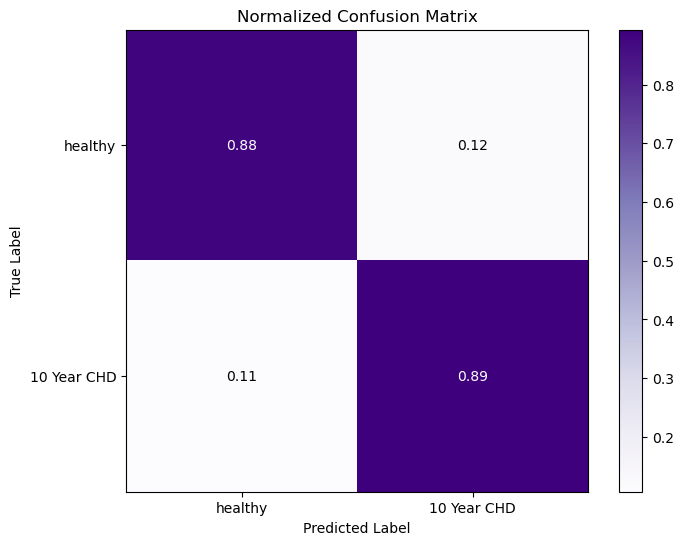

In [197]:
# Calculate metrics and print them
accuracy = voting_clf.score(x_test, y_test)
f1 = f1_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

print(f'Voting Classifier : Random Forest + Extra Trees + XGBoost soft voting')
print(f'Accuracy: {round(accuracy, 2)}')
print(f'F1 Score: {round(f1, 2)}')
print(f'Precision: {round(precision, 2)}')
print(f'Recall: {round(recall, 2)}')

# Define class labels
class_labels = {0: 'healthy', 1: '10 Year CHD'}

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Purples)
plt.title('Confusion Matrix')
plt.colorbar()
ticks = np.arange(len(class_labels))
plt.xticks(ticks, [class_labels[i] for i in ticks])
plt.yticks(ticks, [class_labels[i] for i in ticks])
plt.xlabel('Predicted Label')
plt.ylabel('True Label')

# Add numbers to the confusion matrix plot
for i in range(len(ticks)):
    for j in range(len(ticks)):
        plt.text(j, i, cm[i, j], ha="center", va="center", color="white" if cm[i, j] > cm.max() / 2 else "black")

plt.show()

# Normalized Confusion Matrix
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
plt.figure(figsize=(8, 6))
plt.imshow(cm_normalized, interpolation='nearest', cmap=plt.cm.Purples)
plt.title('Normalized Confusion Matrix')
plt.colorbar()
plt.xticks(ticks, [class_labels[i] for i in ticks])
plt.yticks(ticks, [class_labels[i] for i in ticks])
plt.xlabel('Predicted Label')
plt.ylabel('True Label')

# Add numbers to the normalized confusion matrix plot
for i in range(len(ticks)):
    for j in range(len(ticks)):
        plt.text(j, i, f'{cm_normalized[i, j]:.2f}', ha="center", va="center", color="white" if cm_normalized[i, j] > cm_normalized.max() / 2 else "black")

plt.show()

<a id="2.1"></a>
<h3 style="background-color:#f8fefd; font-family:newtimeroman; font-size:200%; text-align:center; display:inline-block; padding: 10px; border-radius: 15px;">Stacking</h3>

Stacking involves training a new model to combine the predictions of several base models. The base models are trained first, and then a new model is trained to learn how to best combine the predictions of the base models.

### How Stacking Works ?

As a rule, multiple performant models with as different learning functions as possible are chosen to form an ensemble. Then, using KFold cross-validation, predictions are generated for each model.

As an example, with 3 models in a stack doing a 5-fold CV on the data, we will have 15 columns of predictions. This concludes the level 1 of the stack.

In the next level, using these 15 columns of predictions as features, a final — meta estimator is trained with cross-validation and final predictions are made.

This leverages the strength of each individual model in the stack and uses their output as inputs to the final estimator. This helps greatly reduce bias in the predictions.

This complicated ensembling technique is implemented in its basic format in Sklearn as Stacking Classifier/Regressor. We pass a list of base estimators and one final lightweight meta estimator like Logistic Regression or SVM works just like any Sklearn model.

We will define our best 3 models as the base models and the support vector machine classifier as the meta model to best combine the predictions of the three base models.

In [198]:
# Define the base models
base_models = [
    ('rf', best_rf_model),
    ('et', best_et_model),
    ('XGB',best_XGB_model)
]

# Define the parameter grid for the SVM
svm_params = {
    'C': [0.1, 1, 10],
    'gamma': [1, 0.1, 0.01]
}

# Create an SVM classifier for use in grid search
svm_classifier = SVC(probability=True)

# Create a scorer for F1 score
f1_scorer = make_scorer(recall_score)

# Perform grid search to find the best parameters for SVM
grid_search = GridSearchCV(svm_classifier, svm_params, scoring=f1_scorer, cv=3)
grid_search.fit(x_train, y_train)

# Get the best SVM model
meta_model = grid_search.best_estimator_

# Create the Stacking Classifier
stacking_clf = StackingClassifier(
    estimators=base_models,
    final_estimator=meta_model
)

# Fit the stacking classifier on the training data and evaluate it
stacking_clf.fit(x_train, y_train)

# Predict on the test set
y_pred = stacking_clf.predict(x_test)
y_prob = stacking_clf.predict_proba(x_test)

Stacking Classifier : Random Forest + Extra Trees + XGBoost with SVC as the meta model
Accuracy: 0.9
F1 Score: 0.9
Precision: 0.9
Recall: 0.9


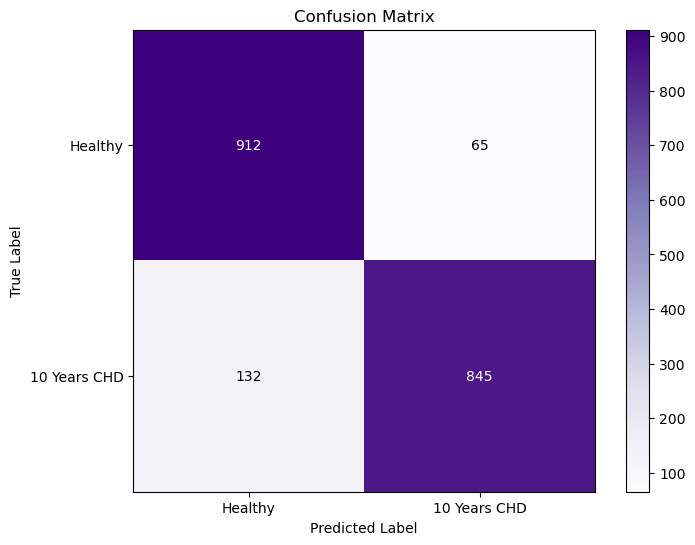

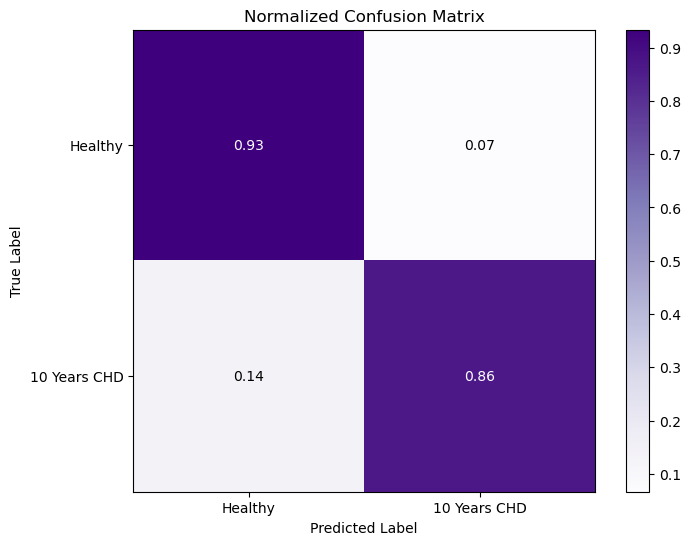

In [199]:
# Calculate metrics
accuracy = stacking_clf.score(x_test, y_test)
f1 = f1_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

print(f'Stacking Classifier : Random Forest + Extra Trees + XGBoost with SVC as the meta model')
print(f'Accuracy: {round(accuracy, 2)}')
print(f'F1 Score: {round(f1, 2)}')
print(f'Precision: {round(precision, 2)}')
print(f'Recall: {round(recall, 2)}')

# Define class labels
class_labels = {0: 'Healthy', 1: '10 Years CHD'}

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Purples)
plt.title('Confusion Matrix')
plt.colorbar()
ticks = np.arange(len(class_labels))
plt.xticks(ticks, [class_labels[i] for i in ticks])
plt.yticks(ticks, [class_labels[i] for i in ticks])
plt.xlabel('Predicted Label')
plt.ylabel('True Label')

# Add numbers to the confusion matrix plot
for i in range(len(ticks)):
    for j in range(len(ticks)):
        plt.text(j, i, cm[i, j], ha="center", va="center", color="white" if cm[i, j] > cm.max() / 2 else "black")

plt.show()

# Normalized Confusion Matrix
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
plt.figure(figsize=(8, 6))
plt.imshow(cm_normalized, interpolation='nearest', cmap=plt.cm.Purples)
plt.title('Normalized Confusion Matrix')
plt.colorbar()
plt.xticks(ticks, [class_labels[i] for i in ticks])
plt.yticks(ticks, [class_labels[i] for i in ticks])
plt.xlabel('Predicted Label')
plt.ylabel('True Label')

# Add numbers to the normalized confusion matrix plot
for i in range(len(ticks)):
    for j in range(len(ticks)):
        plt.text(j, i, f'{cm_normalized[i, j]:.2f}', ha="center", va="center", color="white" if cm_normalized[i, j] > cm_normalized.max() / 2 else "black")

plt.show()

<a id="2.1"></a>
<h3 style="background-color:#c5f6ef;font-family:newtimeroman;font-size:230%;text-align:center;border-radius: 15px 50px;">Model Selection & Deployment</h3>

In [40]:
# Here is our best XGBoost model with its Best parameters from your grid search
best_XGB_params = {'gamma': 0.1,
                   'learning_rate': 0.1,
                   'max_depth': 10,
                   'min_child_weight': 1,
                   'n_estimators': 200,
                   'subsample': 0.7}

best_XGB_model = XGBClassifier(**best_XGB_params)
best_XGB_model.fit(x_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.1, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=10, max_leaves=None,
              min_child_weight=1, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=200, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [41]:
# Saving the model
joblib.dump(best_cb_model, 'XGBoost_CHD_model.joblib')

['XGBoost_CHD_model.joblib']

In [42]:
# Saving the pipeline
joblib.dump(pipeline, "CHD_pipeline.joblib")

['CHD_pipeline.joblib']

In [43]:
del pipeline

In [44]:
del best_XGB_model

In [45]:
pipeline = joblib.load("CHD_pipeline.joblib")

In [46]:
pipeline

ColumnTransformer(transformers=[('scaler', StandardScaler(),
                                 ['age', 'currentSmoker', 'cigsPerDay',
                                  'BPMeds', 'prevalentStroke', 'prevalentHyp',
                                  'diabetes', 'totChol', 'sysBP', 'diaBP',
                                  'BMI', 'heartRate', 'glucose', 'gender'])])

In [48]:
model = joblib.load("XGBoost_CHD_model.joblib")

In [49]:
x_train.head(2)

,age,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,gender
0,1.156466,-0.907304,-0.790299,-0.14668,-0.059352,-0.721351,-0.18447,-0.134226,-0.920340,-1.988560,-0.166546,0.00859,0.468038,-0.822031
1,1.277016,-0.907304,-0.790299,-0.14668,-0.059352,1.386288,-0.18447,0.802169,2.018132,0.844667,0.013658,0.35663,0.818740,-0.822031


In [54]:
sample_input_data = {
    'age': 65,
    'currentSmoker': 1,
    'cigsPerDay': 10,
    'BPMeds': 1,
    'prevalentStroke': 0,
    'prevalentHyp': 1,
    'diabetes': 1,
    'totChol': 230,
    'sysBP': 150,
    'diaBP':90,
    'BMI':35,
    'heartRate':100 ,
    'glucose':140,
    'gender':1
}

In [55]:
def perform_prediction(sample_input_data, pipeline, model):
    
    intput_df = pd.DataFrame(sample_input_data, index=[0])
    
    preprocessed_data = pipeline.transform(intput_df)
    
    prediction = model.predict(preprocessed_data)
    
    return {"prediction":prediction[0]}

In [56]:
perform_prediction(sample_input_data,pipeline,model)

{'prediction': 1}